# Analysis of time series and dose-response

## Load data

In [1]:
setwd(here())

load("data/shiny_rnaseq.rda")
meta <- meta[,!duplicated(colnames(meta))]

sirna <- new.env()
load("data/shiny_rnaseq-sirna.rda", envir = sirna)

Check to see if *IL6* is present in the expression matrices:

In [2]:
names(gene_symbols[which(gene_symbols == "IL6")]) %in% rownames(log2tpm)
names(gene_symbols[which(gene_symbols == "IL6")]) %in% rownames(sirna$log2tpm)

[1] TRUE

[1] TRUE

Reformat the metadata for the dose-response gene expression data:

In [3]:
meta$donor       <- meta$Cell_Line
meta$time        <- meta$Time
meta$timefactor  <- meta$TimeFactor
meta$dose        <- meta$Dose
meta$dosefactor  <- meta$DoseFactor
meta$disease     <- meta$Disease
meta$stimulation <- meta$Stimulation

stopifnot(all(meta$Sample == colnames(log2tpm)))
rownames(meta)  <- colnames(log2tpm)
head(meta)

,Plate,Well,ID,Cell_Line,Stimulation,Time,Concentration,RNA_Prep,Disease,Conc_High,⋯,Age,RF,common_percent,donor,time,timefactor,dose,dosefactor,disease,stimulation
1,1,H11,2-A-2,RA1,TNF (1),2,20.0,1,RA,FALSE,⋯,M,55,0.9961115,RA1,2,2,0,0,RA,TNF (1)
10,1,A04,3-B-2,RA2,TNF (1) + IL17 (1),2,25.8,1,RA,FALSE,⋯,F,NA,0.9914784,RA2,2,2,1,1,RA,TNF (1) + IL17 (1)
100,1,D10,7-A-10,RA4,TNF (1),10,42.1,5,RA,TRUE,⋯,M,NA,0.9956979,RA4,10,10,0,0,RA,TNF (1)
101,1,B02,10-A-10,OA3,TNF (1),10,21.5,5,OA,FALSE,⋯,F,58,0.9966079,OA3,10,10,0,0,OA,TNF (1)
103,1,F04,14-A-10,OA1,TNF (1),10,21.9,5,OA,FALSE,⋯,M,NA,0.9929677,OA1,10,10,0,0,OA,TNF (1)
104,1,C08,15-A-10,OA2,TNF (1),10,26.6,5,OA,FALSE,⋯,M,NA,0.9965252,OA2,10,10,0,0,OA,TNF (1)


It might be interesting to pool some of the time points together...

In [4]:
time_pool <- c(
  "0" = "0",
  "2" = "3",
  "4" = "3",
  "6" = "7",
  "8" = "7",
  "10" = "11",
  "12" = "11",
  "18" = "21",
  "24" = "21"
)
meta$time_pool <- as.numeric(time_pool[as.character(meta$time)])
table(meta$time)
table(meta$time_pool)


 0  2  4  6  8 10 12 18 24 
 7 21 21 21 21 21 21 21 21 


 0  3  7 11 21 
 7 42 42 42 42 

In [5]:
source("R/002_helper_functions.R")
source("R/gg_qqplot.R")

sirnas <- c("CUX1", "ELF3", "LIFR", "STAT3", "STAT4")

meta_colors$sirna <- c(
  "Ctrl"  = "black",
  "CUX1"  = '#1B9E77',
  "STAT3" = '#D95F02',
  "STAT4" = '#7570B3',
  "ELF3"  = '#E7298A',
  "LIFR"  = '#66A61E'
)

meta_colors$Stimulation <- c(
  "None" = "grey50",
  "TNF (1)" = "#FEB24C",
  "TNF (1) + IL17 (1)" = "#E31A1C",
  "TNF (1) + IL17 (10)" = "#800026"
)

## Load packages

In [6]:
pacman::p_load(
  stringr,
  limma,
  dendsort,
  dendextend,
  RColorBrewer,
  pheatmap,
  dplyr,
  data.table,
  liger,
  ggplot2,
  factoextra,
  cluster,
  splines,
  seriation,
  magrittr,
  cetcolor,
  patchwork,
  tibble
#   dendsort,
#   GGally,
#   knitr,
#   rio,
#   UpSetR,
#   matrixStats,
#   igraph,
#   Rfast
)

In [7]:
theme_set(theme_classic(base_size = 18) %+replace% theme(strip.background = element_blank(),
  # axis.line.y = element_line(colour = "black", size = 0.2),
  # axis.line.x = element_line(colour = "black", size = 0.2),
  axis.ticks   = element_line(colour = "black", size = 0.3),
  panel.border = element_rect(size = 0.3, fill = NA),
  axis.line    = element_blank(),
  plot.title   = element_text(size = 18, vjust = 2, hjust = 0.5)
))

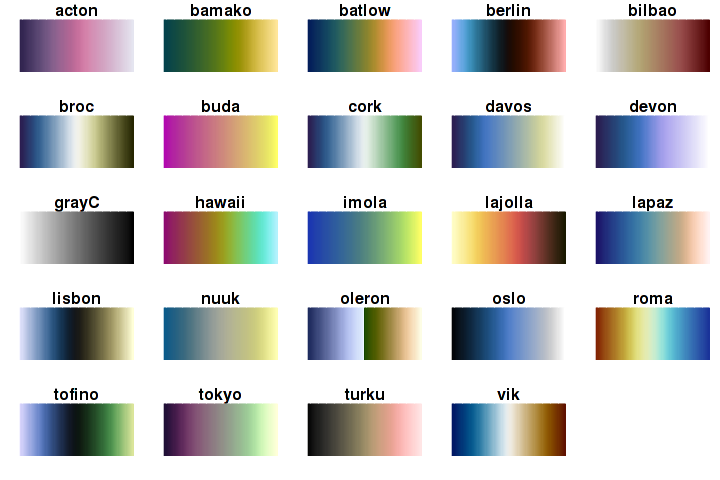

In [8]:
options(repr.plot.width = 6, repr.plot.height = 4)

scico::scico_palette_show()

## Experimental design

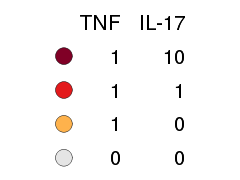

In [9]:
options(repr.plot.width = 2, repr.plot.height = 1.5)

meta_colors$Stimulation[["None"]] <- "grey90"

tt1 <- gridExtra::ttheme_minimal(core=list(fg_params=list(hjust = 1, x = 0.9)))

stims <- data.frame(
  check.names = FALSE,
  blank = c("", "", "", "", ""),
  TNF = rev(c(0, 1, 1, 1, "TNF")),
  "IL-17" = rev(c(0, 0, 1, 10, "IL-17"))
)

g <- gridExtra::tableGrob(d = stims, theme = tt1, cols = NULL, rows = NULL)

g <- gtable::gtable_add_grob(
  x = g,
  grobs = grid::grobTree(
    grid::circleGrob(
      x = unit(0.2,"npc"),
      y = unit(0.7,"npc"),
      r = unit(0.1,"npc"),
      gp = grid::gpar(lwd = 0.3, fill = meta_colors$Stimulation[["TNF (1) + IL17 (10)"]])
    ),
    grid::circleGrob(
      x = unit(0.2,"npc"),
      y = unit(0.5,"npc"),
      r = unit(0.1,"npc"),
      gp = grid::gpar(lwd = 0.3, fill = meta_colors$Stimulation[["TNF (1) + IL17 (1)"]])
    ),
    grid::circleGrob(
      x = unit(0.2,"npc"),
      y = unit(0.3,"npc"),
      r = unit(0.1,"npc"),
      gp = grid::gpar(lwd = 0.3, fill = meta_colors$Stimulation[["TNF (1)"]])
    ),
    grid::circleGrob(
      x = unit(0.2,"npc"),
      y = unit(0.1,"npc"),
      r = unit(0.1,"npc"),
      gp = grid::gpar(lwd = 0.3, fill = meta_colors$Stimulation[["None"]])
    )
  ),
  t = 1, b = 5, l = 1, r = 2
)

grid::grid.draw(g)

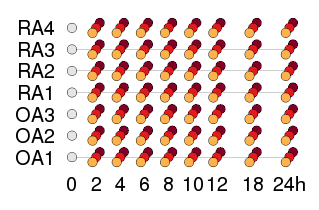

In [565]:
source("R/002_helper_functions.R")

# options(repr.plot.width = 4, repr.plot.height = 1.75)
options(repr.plot.width = 2.66, repr.plot.height = 1.75)

meta$TEMP <- meta$Stimulation
meta$TEMP[meta$TEMP == "None"] <- "TNF (1) + IL17 (1)"

meta$TEMP2 <- meta$Time
meta$TEMP2[meta$TEMP2 == 18] <- 15
meta$TEMP2[meta$TEMP2 == 24] <- 18
meta$TEMP2[meta$Stimulation == "TNF (1)"] <- meta$TEMP2[meta$Stimulation == "TNF (1)"] - 0.3
meta$TEMP2[meta$Stimulation == "TNF (1) + IL17 (10)"] <- meta$TEMP2[meta$Stimulation == "TNF (1) + IL17 (10)"] + 0.3

p <- ggplot() +
geom_segment(
  data = meta,
  mapping = aes(y = 0, yend = 18L, x = Cell_Line, xend = Cell_Line),
  size = 0.01, alpha = 0.1
) +
geom_point(
  data = meta,
  mapping = aes(y = TEMP2, x = Cell_Line, group = paste(TEMP), fill = Stimulation),
  shape = 21, stroke = 0.2,
  size = 2.5,
  position = position_dodge(width = 0.7)
) +
coord_flip() +
scale_fill_manual(
  name = NULL,
  labels = c(
    "None"                = "None",
    "TNF (1)"             = "TNF (1)",
    "TNF (1) + IL17 (1)"  = "TNF (1) and IL-17 (1)",
    "TNF (1) + IL17 (10)" = "TNF (1) and IL-17 (10)"
  ),
  values = meta_colors$Stimulation,
  guide = guide_legend(reverse = TRUE, override.aes = list(size = 4))
) +
scale_y_continuous(
  breaks = c(0L, 2L, 4L, 6L, 8L, 10L, 12L, 15L, 18L),
  labels = c("0", "2", "4", "6", "8", "10", "12", "18", "24h")
) +
theme(
  legend.position = "none",
  axis.ticks.length = unit(0, "cm"),
  legend.spacing = margin(t = 0, unit = "cm"),
  legend.margin = margin(t = 0, unit = 'cm'),
  axis.text = element_text(size = 12, color = "black"),
  legend.text = element_text(size = 12),
  panel.border = element_blank(),
  axis.line.x = element_blank(),
  axis.line.y = element_blank(),
  axis.ticks = element_blank()
) +
labs(x = NULL, y = NULL)

# show_plot(gridExtra::grid.arrange(p, g, nrow = 1, widths = c(3, 1.2))) #, res = 600)
# p <- gridExtra::arrangeGrob(p, g, nrow = 1, widths = c(3, 1.2))
show_plot(p, name = "rnaseq-data-1-design") #, res = 600)

## Gene descriptions from BioMart

In [11]:
# library(biomaRt)
# ensembl <- useEnsembl(
#   biomart = "ensembl",
#   dataset = "hsapiens_gene_ensembl"
# )

# bm <- getBM(
#   attributes = c('ensembl_gene_id', 'hgnc_symbol', 'chromosome_name', 'description'),
#   filters    = 'ensembl_gene_id',
#   values     = rownames(log2tpm_batch)[1:10],
#   mart       = ensembl
# )
# bm$description <- str_split_fixed(bm$description, " \\[Source", 2)[,1]
# head(bm)

In [12]:
hg19_gene_bed <- fread("gzip -cd /data/srlab/slowikow/fibroblast_timecourse/data-raw/grch37/Homo_sapiens.GRCh37.87.bed.gz")
colnames(hg19_gene_bed) <- c("chrom", "start", "end", "name", "score", "strand")
hg19_gene_bed[1:5,]

chrom,start,end,name,score,strand
1,11869,14412,ENSG00000223972,0,+
1,14363,29806,ENSG00000227232,0,-
1,29554,31109,ENSG00000243485,0,+
1,34554,36081,ENSG00000237613,0,-
1,52473,54936,ENSG00000268020,0,+


# Export data for NCBI GEO

In [658]:
e <- environment()
load("data/rnaseq_kallisto_ensembl89.rda", envir = e)

In [661]:
all(colnames(e$counts) == meta$samp)
all(colnames(e$countst) == meta$samp)
all(colnames(e$tpm) == meta$samp)
all(colnames(e$tpmt) == meta$samp)

[1] TRUE

[1] TRUE

[1] TRUE

[1] TRUE

In [662]:
write_matrix <- function(x, path) {
  x <- data.frame(
    ID_REF = rownames(x),
    x,
    stringsAsFactors = FALSE
  )
  rownames(x) <- NULL
  readr::write_tsv(x, path)
  print(path)
  cat(paste(system(sprintf("zcat %s | head | cut -f1-5 | column -t", path), intern = TRUE), collapse = "\n"))
  cat("\n\n")
}

###

out_dir <- "share/NCBI-GEO/rnaseq-data-1"
dir.create(out_dir, showWarnings = FALSE, recursive = TRUE)

gene_counts_file <- sprintf("%s/rnaseq-data-1_gene-counts.tsv.gz", out_dir)
write_matrix(e$counts, gene_counts_file)

gene_tpm_file <- sprintf("%s/rnaseq-data-1_gene-tpm.tsv.gz", out_dir)
write_matrix(e$tpm, gene_tpm_file)

transcript_counts_file <- sprintf("%s/rnaseq-data-1_transcript-counts.tsv.gz", out_dir)
write_matrix(e$countst, transcript_counts_file)

transcript_tpm_file <- sprintf("%s/rnaseq-data-1_transcript-tpm.tsv.gz", out_dir)
write_matrix(e$tpmt, transcript_tpm_file)

###

all(colnames(e$counts) == meta$sample)
all(colnames(e$countst) == meta$sample)

all(colnames(e$tpm) == meta$sample)
all(colnames(e$tpmt) == meta$sample)

meta_cols <- c(
  "samp", "Plate", "Well", "Cell_Line", "Stimulation", "Time"
)
x <- meta[,meta_cols]
colnames(x)[1] <- "sample"
colnames(x) <- stringr::str_to_lower(colnames(x))
meta_file <- sprintf("%s/rnaseq-data-1_metadata.tsv", out_dir)
readr::write_tsv(x, meta_file)

print(meta_file)
cat(paste(system(sprintf("cat %s | head | column -t -s$'\t'", meta_file), intern = TRUE), collapse = "\n"))
cat("\n\n")


[1] "share/NCBI-GEO/rnaseq-data-1/rnaseq-data-1_gene-counts.tsv.gz"
ID_REF           S1                  S10                S100           S101
ENSG00000004059  122.7571291         77.92452999999999  180.99452      159.81880999999998
ENSG00000003056  127.07218565999999  147.738290205873   223.06963      228.2972122307
ENSG00000173153  4                   1                  4.004817       3.226022
ENSG00000004478  28.289640000000002  64.50009           41.28283       69.27346
ENSG00000003137  23                  6                  0              3
ENSG00000003509  36.9224256          28.60903           41.1848577984  42.926180125062
ENSG00000001036  163.77421           152.40226          207.009        226.3044
ENSG00000003249  2.04954             3.04247            1.02089        0
ENSG00000002587  0                   0                  1.02059        0

[1] "share/NCBI-GEO/rnaseq-data-1/rnaseq-data-1_gene-tpm.tsv.gz"
ID_REF           S1                  S10                 S100       

[1] TRUE

[1] TRUE

[1] TRUE

[1] TRUE

[1] "share/NCBI-GEO/rnaseq-data-1/rnaseq-data-1_metadata.tsv"
sample  plate  well  cell_line  stimulation         time
S1      1      H11   RA1        TNF (1)             2
S10     1      A04   RA2        TNF (1) + IL17 (1)  2
S100    1      D10   RA4        TNF (1)             10
S101    1      B02   OA3        TNF (1)             10
S103    1      F04   OA1        TNF (1)             10
S104    1      C08   OA2        TNF (1)             10
S105    2      F08   RA1        TNF (1) + IL17 (1)  10
S106    1      C06   RA2        TNF (1) + IL17 (1)  10
S107    1      E05   RA3        TNF (1) + IL17 (1)  10



## Prepare data for modeling

### Share the first time point

Time point 0 has no stimulation, so it can serve as the reference point for all
other stimulations

In [13]:
# Copy the 0 time point for doses 1 and 10
t0 <- subset(meta, Time == 0)
n0 <- nrow(t0)
t0 <- rbind(t0, t0)
t0$Dose <- rep(c(1, 10), each = n0)
t0$DoseFactor <- rep(c(1, 10), each = n0)
t0$dosefactor <- rep(c(1, 10), each = n0)
t0$DoseExposure <- rep(TRUE, n0 * 2)
meta_zero <- rbind(t0, meta)

We share the 7 RNA-seq samples from the 0h time point with Dose 1 and Dose 10:

In [14]:
table(meta$Dose, meta$Time)

    
     0 2 4 6 8 10 12 18 24
  0  7 7 7 7 7  7  7  7  7
  1  0 7 7 7 7  7  7  7  7
  10 0 7 7 7 7  7  7  7  7

In [15]:
table(meta_zero$Dose, meta_zero$Time)

    
     0 2 4 6 8 10 12 18 24
  0  7 7 7 7 7  7  7  7  7
  1  7 7 7 7 7  7  7  7  7
  10 7 7 7 7 7  7  7  7  7

Now let's do a similar transformation for the siRNA data:

In [16]:
table(sirna$meta$dosefactor, sirna$meta$time, sirna$meta$sirna)

, ,  = Ctrl

   
    0 1 6 16
  0 8 4 4  4
  1 0 4 4  3

, ,  = CUX1

   
    0 1 6 16
  0 8 4 4  4
  1 0 4 4  4

, ,  = ELF3

   
    0 1 6 16
  0 8 4 4  4
  1 0 4 4  4

, ,  = LIFR

   
    0 1 6 16
  0 8 4 4  4
  1 0 4 4  4

, ,  = STAT3

   
    0 1 6 16
  0 7 4 4  4
  1 0 3 4  3

, ,  = STAT4

   
    0 1 6 16
  0 7 4 4  3
  1 0 4 4  4


In [17]:
# Copy the 0 time point for doses 1 and 10
t0 <- subset(sirna$meta, time == 0)
n0 <- nrow(t0)
t0$dosefactor <- 1
sirna$meta_zero <- rbind(t0, sirna$meta)

In [18]:
table(sirna$meta_zero$dosefactor, sirna$meta_zero$time, sirna$meta_zero$sirna)

, ,  = Ctrl

   
    0 1 6 16
  0 8 4 4  4
  1 8 4 4  3

, ,  = CUX1

   
    0 1 6 16
  0 8 4 4  4
  1 8 4 4  4

, ,  = ELF3

   
    0 1 6 16
  0 8 4 4  4
  1 8 4 4  4

, ,  = LIFR

   
    0 1 6 16
  0 8 4 4  4
  1 8 4 4  4

, ,  = STAT3

   
    0 1 6 16
  0 7 4 4  4
  1 7 3 4  3

, ,  = STAT4

   
    0 1 6 16
  0 7 4 4  3
  1 7 4 4  4


### Remove batch effects

Subtract the means of donors and plates to remove most of the batch effects.

Note: This means we can no longer look for differences between OA and RA, since all donors will be centered.

In [19]:
log2tpm_batch <- removeBatchEffect(x = log2tpm, batch = meta$donor, batch2 = meta$Plate)
log2tpm_zero <- log2tpm_batch[,as.character(meta_zero$Sample)]

In [20]:
sirna$log2tpm_batch <- removeBatchEffect(x = sirna$log2tpm, batch = sirna$meta$donor)
sirna$log2tpm_zero <- sirna$log2tpm_batch[,as.character(sirna$meta_zero$sample)]

In [21]:
stopifnot(all(colnames(sirna$log2tpm) == sirna$meta$sample))
stopifnot(all(colnames(sirna$log2tpm_zero) == sirna$meta_zero$sample))

## Model time as a factor

In [22]:
ens_id <- names(which(gene_symbols == "CSF3"))
meta_zero$Gene <- as.numeric(log2tpm_zero[ens_id,])

mod_null <- lm(Gene ~ 0 + TimeFactor + DoseFactor, meta_zero)
mod_full <- lm(Gene ~ 0 + TimeFactor + DoseFactor + TimeFactor:DoseFactor, meta_zero)

meta_zero$Gene_fitted <- mod_full$fitted.values

a <- anova(mod_null, mod_full)
a

Res.Df,RSS,Df,Sum of Sq,F,Pr(>F)
178,184.6697,NA,NA,NA,NA
162,108.2220,16,76.44768,7.152265,2.386174e-12


In [23]:
clean_cols <- function(x) {
  colnames(x) <- str_replace_all(colnames(x), "[()]", "")
  colnames(x) <- str_replace_all(colnames(x), ":", "")
  colnames(x) <- str_replace_all(colnames(x), "DoseFactor", "d")
  colnames(x) <- str_replace_all(colnames(x), "DoseExposure", "d")
  colnames(x) <- str_replace_all(colnames(x), "TimeFactor", "t")
  colnames(x) <- str_replace_all(colnames(x), "TRUE", "1")
  return(x)
}

des0 <- clean_cols(with(
  meta,
#   meta_zero,
#   model.matrix(~ 0 + TimeFactor + DoseFactor)
  model.matrix(~ TimeFactor)
))

des1 <- clean_cols(with(
  meta,
#   meta_zero,
#   model.matrix(~ 0 + TimeFactor + DoseFactor + DoseFactor:TimeFactor)
  model.matrix(~ TimeFactor + DoseFactor)
))

print(colnames(des1))

fit0 <- lmFit(object = log2tpm, design = des0)
fit1 <- lmFit(object = log2tpm, design = des1)
# fit0 <- lmFit(object = log2tpm_zero, design = des0)
# fit1 <- lmFit(object = log2tpm_zero, design = des1)

fit0 <- eBayes(fit0)
fit1 <- eBayes(fit1)
fit1$genes <- gene_symbols[rownames(fit1$coefficients)]

ftime <- lmCompare(log2tpm, fit0, fit1)
# ftime <- lmCompare(log2tpm_zero, fit0, fit1)
ftime$gene <- gene_symbols[rownames(ftime)]
ftime$qval <- qvalue::qvalue(p = ftime$pval)$qvalue

pvals_factor <- ftime$pval

ftime %>% dplyr::arrange(pval) %>% head(n = 20)
sum(ftime$qval < 0.05)

 [1] "Intercept" "t2"        "t4"        "t6"        "t8"        "t10"      
 [7] "t12"       "t18"       "t24"       "d1"        "d10"      


fstat,pval,gene,qval
824.06273,2.790988e-86,ZC3H12A,4.839069e-82
711.53323,1.473656e-81,CXCL2,1.277527e-77
634.95144,6.061457e-78,CXCL1,3.503157e-74
579.31939,4.560503e-75,CXCL3,1.976772e-71
354.03424,3.104899e-60,NMES1,1.076667e-56
337.61022,7.233678e-59,NFKBIZ,2.090315e-55
308.33081,2.724231e-56,IL6,6.747606e-53
235.85022,5.629763e-49,CXCL8,1.220124e-45
227.27285,5.305283e-48,CSF2,1.022045e-44
138.66005,5.589738e-36,ELF3,9.691595e-33


[1] 1358

In [24]:
fit1_signif <- decideTests(fit1, lfc = log2(2), p.value = 0.05)

do.call(rbind, apply(fit1_signif, 2, function(x) {
  data.frame(
    "Up"        = sum(x == 1),
    "Down"      = sum(x == -1),
    "Unchanged" = sum(x == 0)
  )
}))

,Up,Down,Unchanged
Intercept,12835,0,7044
t2,348,143,19388
t4,332,206,19341
t6,408,202,19269
t8,463,192,19224
t10,532,244,19103
t12,478,226,19175
t18,470,148,19261
t24,417,181,19281
d1,25,0,19854


### What if we only had the 24h time point?

In [25]:
table(meta$TimeFactor)


 0  2  4  6  8 10 12 18 24 
 7 21 21 21 21 21 21 21 21 

In [26]:
# count_sub <- function(time_points = c(0, 24)) {
  
time_points <- c(0, 24)
  meta_sub <- subset(meta, TimeFactor %in% time_points)
  log2tpm_sub <- log2tpm[,as.character(rownames(meta_sub))]
  meta_sub$TimeFactor <- factor(meta_sub$TimeFactor)

  clean_cols <- function(x) {
    colnames(x) <- str_replace_all(colnames(x), "[()]", "")
    colnames(x) <- str_replace_all(colnames(x), ":", "")
    colnames(x) <- str_replace_all(colnames(x), "DoseFactor", "d")
    colnames(x) <- str_replace_all(colnames(x), "DoseExposure", "d")
    colnames(x) <- str_replace_all(colnames(x), "TimeFactor", "t")
    colnames(x) <- str_replace_all(colnames(x), "TRUE", "1")
    return(x)
  }

  des0_sub <- clean_cols(with(
    meta_sub,
    model.matrix(~ TimeFactor)
  ))

  des1_sub <- clean_cols(with(
    meta_sub,
    model.matrix(~ TimeFactor + DoseFactor)
  ))

  print(colnames(des1_sub))

  fit0_sub <- lmFit(object = log2tpm_sub, design = des0_sub)
  fit1_sub <- lmFit(object = log2tpm_sub, design = des1_sub)
  fit0_sub <- eBayes(fit0_sub)
  fit1_sub <- eBayes(fit1_sub)
  fit1_sub$genes <- gene_symbols[rownames(fit1_sub$coefficients)]

  ftime_sub <- lmCompare(log2tpm_sub, fit0_sub, fit1_sub)
  ftime_sub$gene <- gene_symbols[rownames(ftime_sub)]
  ftime_sub$qval <- qvalue::qvalue(p = ftime_sub$pval)$qvalue

  # ftime_sub %>% dplyr::arrange(pval) %>% head(n = 20)
  # sum(ftime_sub$qval < 0.05, na.rm = TRUE)

  # Just two time points: 0h and 24h
  x1 <- subset(ftime_sub, qval < 0.05)$gene
  x2 <- union(
    (topTable(fit1_sub, coef = "d1", number = 1e6) %>% filter(abs(logFC) > log2(1.5)))$ID,
    (topTable(fit1_sub, coef = "d10", number = 1e6) %>% filter(abs(logFC) > log2(1.5)))$ID
  )
  length(intersect(x1, x2))
# }

# count_sub(c(0, 2, 4, 6, 8, 10, 12, 18, 24))
# count_sub(c(0, 4, 6, 8, 10, 12, 18, 24))
# count_sub(c(0, 6, 8, 10, 12, 18, 24))
# count_sub(c(0, 8, 10, 12, 18, 24))
# count_sub(c(0, 10, 12, 18, 24))
# count_sub(c(0, 18, 24))
# count_sub(c(0, 24))

[1] "Intercept" "t24"       "d1"        "d10"      


Warning message:
“Zero sample variances detected, have been offset away from zero”Warning message:
“Zero sample variances detected, have been offset away from zero”

[1] 144

In [27]:
table(meta$TimeFactor)


 0  2  4  6  8 10 12 18 24 
 7 21 21 21 21 21 21 21 21 

In [28]:
colnames(des1_sub)

[1] "Intercept" "t24"       "d1"        "d10"

In [29]:
topTable(fit1, coef = "d10", number = 1e6) %>%
filter(abs(logFC) > log2(1.5) & adj.P.Val < 0.05) %>% nrow()

topTable(fit1_sub, coef = "d10", number = 1e6) %>%
filter(abs(logFC) > log2(1.5) & adj.P.Val < 0.05) %>% nrow()

[1] 260

[1] 234

In [30]:
# All time points
# 5% FDR for a better fit with the full model
x1 <- subset(ftime, qval < 0.05)$gene
# 1.5 fold-change in the full model for dose1 or dose10
x2 <- union(
  (topTable(fit1, coef = "d1", number = 1e6) %>% filter(abs(logFC) > log2(1.5)))$ID,
  (topTable(fit1, coef = "d10", number = 1e6) %>% filter(abs(logFC) > log2(1.5)))$ID
)
length(intersect(x1, x2))

# Just two time points: 0h and 24h
x1 <- subset(ftime_sub, qval < 0.05)$gene
x2 <- union(
  (topTable(fit1_sub, coef = "d1", number = 1e6) %>% filter(abs(logFC) > log2(1.5)))$ID,
  (topTable(fit1_sub, coef = "d10", number = 1e6) %>% filter(abs(logFC) > log2(1.5)))$ID
)
length(intersect(x1, x2))

[1] 253

[1] 144

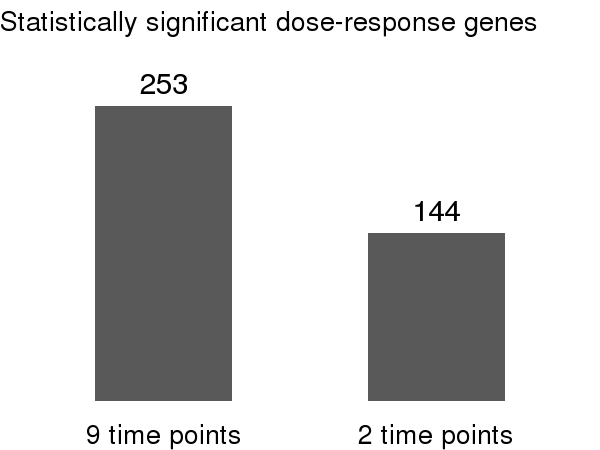

In [31]:
options(repr.plot.width = 4, repr.plot.height = 3)

d_sub <- data.frame(
  data  = c("full", "sub"),
  genes = c(253, 144)
)
d_sub$label <- scales::comma(d_sub$genes)

p <- ggplot(d_sub, aes(x = data, y = genes, label = label)) +
geom_col(width = 0.5) +
geom_text(nudge_y = 20, size = 5) +
scale_x_discrete(labels = c("9 time points", "2 time points")) +
labs(x = NULL, y = NULL, title = "Statistically significant dose-response genes\n") +
theme_void() +
theme(axis.text.x = element_text(size = 13))

show_plot(p, res = 150)

In [32]:
fit1_top <- rbindlist(lapply(colnames(des1), function(coef) {
  retval <- topTable(fit1, confint = TRUE, coef = coef, number = nrow(fit1$coefficients))
  retval$ensembl_id <- rownames(retval)
  retval$Coef <- coef
  retval
}))
fit1_top %<>% mutate(signif = adj.P.Val < 0.05 & abs(logFC) > log2(2))
head(fit1_top)

ID,logFC,CI.L,CI.R,AveExpr,t,P.Value,adj.P.Val,B,ensembl_id,Coef,signif
GAPDH,12.236125,12.139229,12.333022,11.975492,249.3115,1.073158e-216,2.133331e-212,449.8856,ENSG00000111640,Intercept,TRUE
TPT1,12.250191,12.143098,12.357285,12.149701,225.8334,1.524190e-209,1.514969e-205,439.2062,ENSG00000133112,Intercept,TRUE
UBB,10.334362,10.241420,10.427305,10.497590,219.5213,1.706989e-207,1.131108e-203,436.0108,ENSG00000170315,Intercept,TRUE
SRP14,9.107508,9.021381,9.193635,9.061472,208.7697,7.265804e-204,3.610923e-200,430.2092,ENSG00000140319,Intercept,TRUE
COX4I1,9.629190,9.529870,9.728509,9.627548,191.4095,1.354761e-197,5.386257e-194,419.7734,ENSG00000131143,Intercept,TRUE
PPIB,9.930678,9.823745,10.037610,9.886489,183.3484,1.729268e-194,5.729354e-191,414.4209,ENSG00000166794,Intercept,TRUE


# Export Table S3

In [33]:
getwd()

format_numeric <- function(x, ...) {
  numeric_cols <- vapply(x, is.numeric, logical(1))
  x[numeric_cols] <- lapply(x[numeric_cols], function(x) {
    ix <- abs(x) < 0.01
    x1 <- sprintf("%.3e", x[ix])
    x2 <- sprintf("%.4f", x[!ix])
    x[ix] <- x1
    x[!ix] <- x2
    x
  })
  x
}

readr::write_tsv(
  x = format_numeric(as.data.frame(fit1_top)),
  path = "analysis/limma/002_dose_limma_timefactor_dosefactor.tsv.gz"
)

[1] "/data/srlab/slowikow/fibroblast_timecourse"

In [34]:
subset(fit1_top, ID %in% c("CSF3"))

,ID,logFC,CI.L,CI.R,AveExpr,t,P.Value,adj.P.Val,B,ensembl_id,Coef,signif
19006,CSF3,3.172364e-15,-0.98705804,0.9870580,1.790834,6.345225e-15,1.000000e+00,1.000000e+00,-7.805615,ENSG00000108342,Intercept,FALSE
24305,CSF3,-1.028289e+00,-2.20312296,0.1465452,1.790834,-1.728006e+00,8.583557e-02,3.855231e-01,-5.395385,ENSG00000108342,t2,FALSE
51180,CSF3,-4.698057e-01,-1.64463978,0.7050283,1.790834,-7.894933e-01,4.309432e-01,7.499606e-01,-6.600694,ENSG00000108342,t4,FALSE
75657,CSF3,-1.939469e-01,-1.36878097,0.9808871,1.790834,-3.259215e-01,7.448918e-01,9.241565e-01,-6.880339,ENSG00000108342,t6,FALSE
98885,CSF3,-2.802674e-02,-1.20286080,1.1468073,1.790834,-4.709803e-02,9.624914e-01,9.877333e-01,-6.938005,ENSG00000108342,t8,FALSE
114215,CSF3,2.946694e-01,-0.88016462,1.4695035,1.790834,4.951825e-01,6.211222e-01,8.331504e-01,-6.830441,ENSG00000108342,t10,FALSE
133647,CSF3,3.079080e-01,-0.86692610,1.4827420,1.790834,5.174294e-01,6.055411e-01,8.374141e-01,-6.787127,ENSG00000108342,t12,FALSE
146616,CSF3,8.016606e-01,-0.37317346,1.9764947,1.790834,1.347165e+00,1.797522e-01,4.787426e-01,-5.983523,ENSG00000108342,t18,FALSE
162466,CSF3,1.239595e+00,0.06476065,2.4144288,1.790834,2.083099e+00,3.876572e-02,2.244099e-01,-4.763198,ENSG00000108342,t24,FALSE
178937,CSF3,1.920219e+00,1.42669038,2.4137484,1.790834,7.681479e+00,1.266107e-12,9.680366e-10,18.199235,ENSG00000108342,d1,TRUE


In [35]:
fit1_signif <- decideTests(fit1, lfc = log2(1.25), p.value = 0.005)

do.call(rbind, apply(fit1_signif, 2, function(x) {
  data.frame(
    "Up"        = sum(x == 1),
    "Down"      = sum(x == -1),
    "Unchanged" = sum(x == 0)
  )
}))

,Up,Down,Unchanged
Intercept,13866,0,6013
t2,429,230,19220
t4,459,414,19006
t6,498,374,19007
t8,571,402,18906
t10,643,543,18693
t12,556,505,18818
t18,515,397,18967
t24,468,384,19027
d1,89,19,19771


In [36]:
subset(ftime, gene %in% c("TNFSF9", "IL6", "AVPI1", "DIRAS3", "CSF3"))

,fstat,pval,gene,qval
ENSG00000108342,87.963321,1.105627e-26,CSF3,9.128371e-24
ENSG00000119986,42.920252,1.020568e-15,AVPI1,3.402848e-13
ENSG00000125657,50.398873,8.674097e-18,TNFSF9,3.497516e-15
ENSG00000136244,308.330807,2.724231e-56,IL6,6.747606e-53
ENSG00000162595,6.724202,1.560571e-03,DIRAS3,2.489189e-02


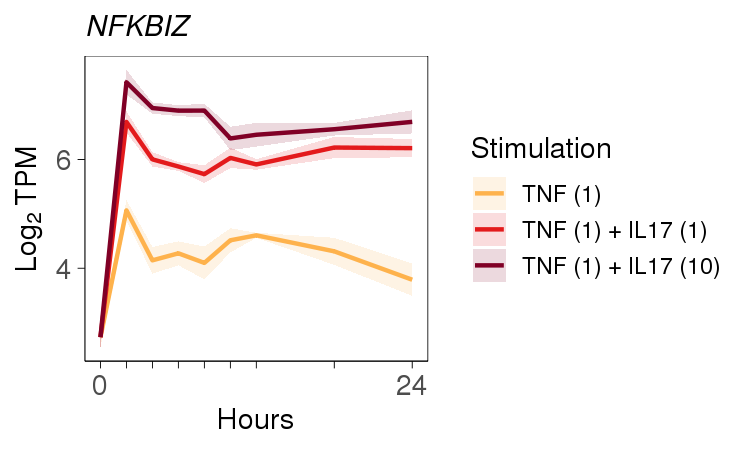

In [37]:
options(repr.plot.width = 5, repr.plot.height = 3)

show_plot(plot_gene_by_stimulation("NFKBIZ", meta = meta, log2tpm = log2tpm_batch), res = 150)
# show_plot(plot_gene_by_stimulation("AVPI1", meta = meta, log2tpm = log2tpm_batch))
# plot_gene_by_stimulation("CSF3", meta = meta, log2tpm = log2tpm_batch)
# plot_gene_by_stimulation("TNFSF9", meta = meta, log2tpm = log2tpm_batch)
# plot_gene_by_stimulation("DIRAS3", meta = meta, log2tpm = log2tpm_batch)
# plot_gene_by_stimulation("RASD1", meta = meta, log2tpm = log2tpm_batch)
# plot_gene_by_stimulation("MFSD2A", meta = meta, log2tpm = log2tpm_batch)

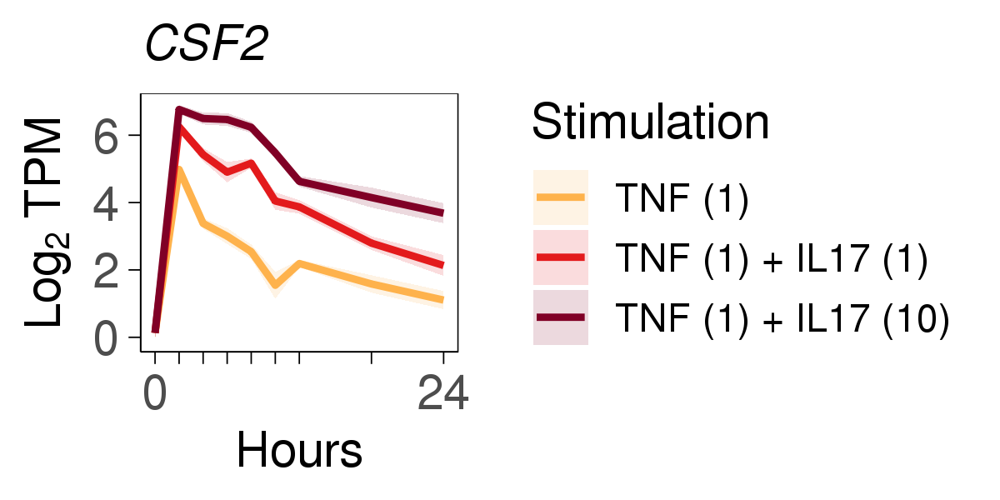

In [38]:
options(repr.plot.width = 4, repr.plot.height = 2)

show_plot(plot_gene_by_stimulation("CSF2", meta = meta, log2tpm = log2tpm_batch), res = 300)

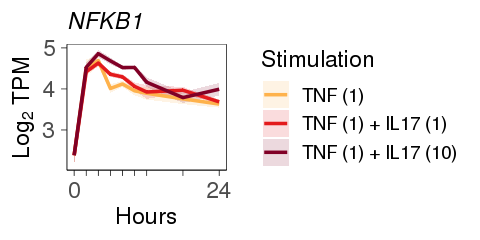

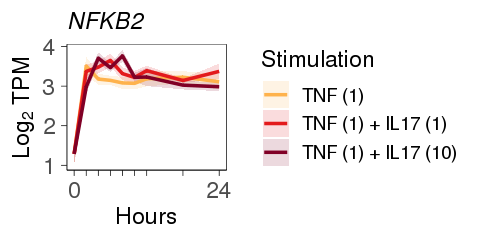

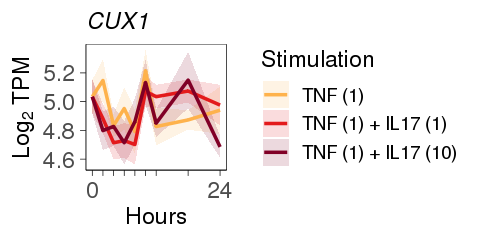

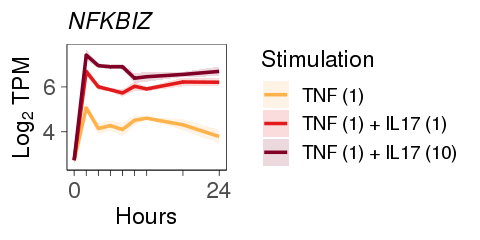

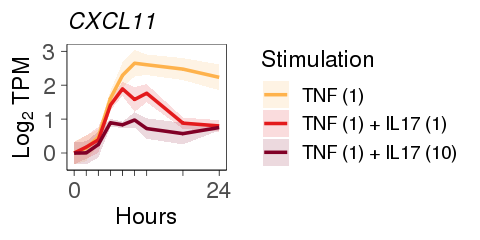

...

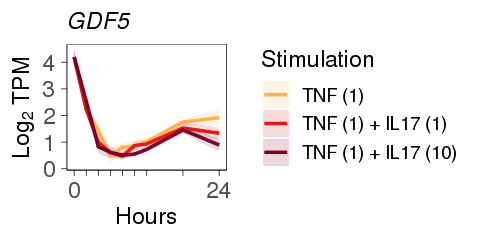

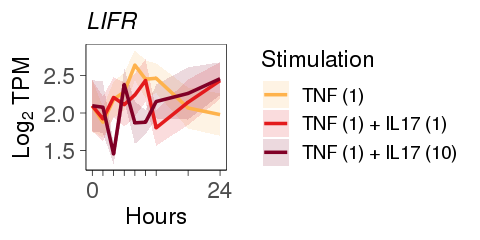

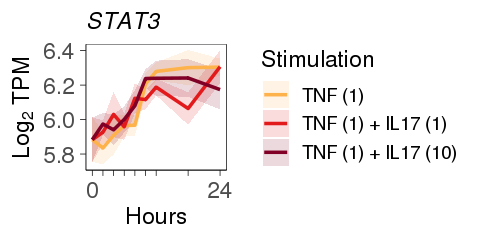

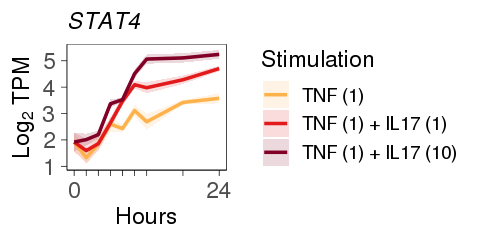

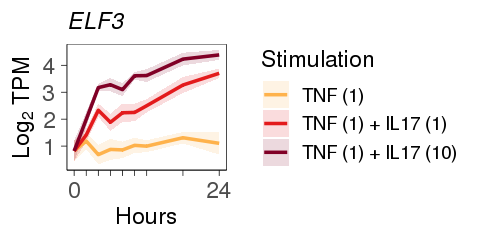

In [332]:
options(repr.plot.width = 4, repr.plot.height = 2)

source("R/002_helper_functions.R")

genelist <- c("NFKB1", "NFKB2", "CUX1", "NFKBIZ", "CXCL11", "CSF3", "CXCL1", "MMP1", "CXCL11", "CXCL10", "CCL5", "GDF5", "LIFR", "STAT3", "STAT4", "ELF3")

for (g in genelist) {
  show_plot(plot_gene_by_stimulation(g, meta = meta, log2tpm = log2tpm_batch), name = g)
}

# show_plot(plot_gene_by_stimulation("NFKB2", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("CUX1", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("NFKBIZ", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("CXCL11", meta = meta, log2tpm = log2tpm_batch))

# show_plot(plot_gene_by_stimulation("CSF3", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("CXCL1", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("MMP1", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("CXCL11", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("CXCL10", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("CCL5", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("GDF5", meta = meta, log2tpm = log2tpm_batch))

# show_plot(plot_gene_by_stimulation("LIFR", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("STAT3", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("STAT4", meta = meta, log2tpm = log2tpm_batch))
# show_plot(plot_gene_by_stimulation("ELF3", meta = meta, log2tpm = log2tpm_batch))

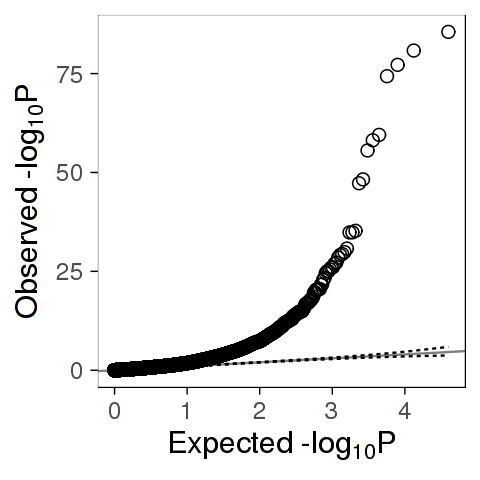

In [40]:
options(repr.plot.width = 4, repr.plot.height = 4)
gg_qqplot(ftime$pval)

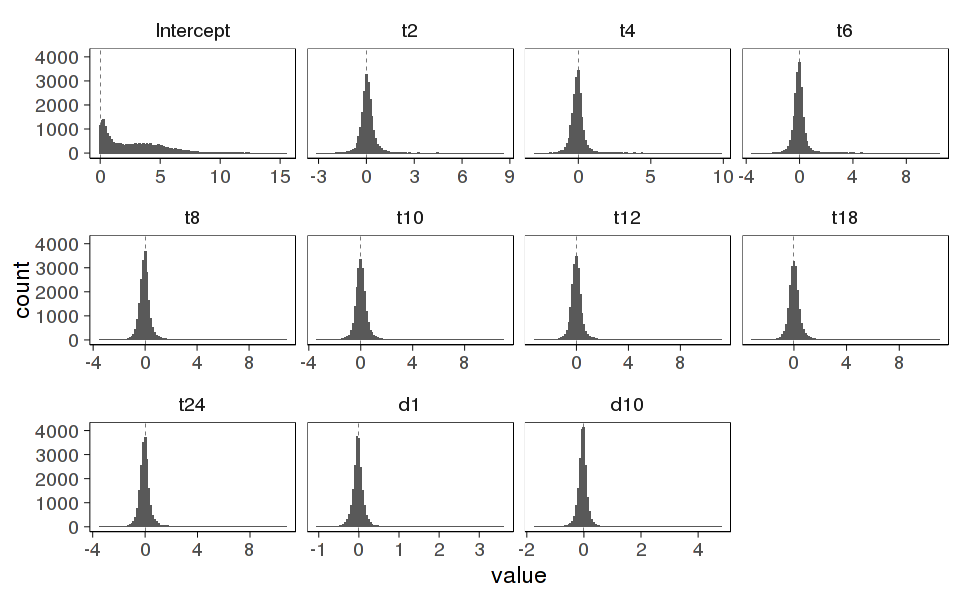

In [41]:
options(repr.plot.width = 8, repr.plot.height = 5)

coef <- as.data.frame(fit1$coefficients)

melt(coef, id.vars = NULL) %>%
ggplot(aes(x = value)) +
geom_vline(xintercept = 0, size = 0.1, linetype = 2) +
geom_histogram(bins = 100) +
facet_wrap(~ variable, scales = "free_x") +
theme_clean(base_size = 14)

### TNF effects and TNF+IL17 effects

In [42]:
des1 <- with(meta, model.matrix(~ DoseFactor + TimeFactor + Cell_Line))
colnames(des1) <- str_replace_all(colnames(des1), ":", "_")

fit1 <- lmFit(log2tpm, des1)
fit1 <- eBayes(fit1)
fit1$genes <- gene_symbols[rownames(fit1$coefficients)]
colnames(fit1$coefficients)[1] <- "Intercept"

dat_tnf <- topTable(fit1, coef = "TimeFactor6", number = 1e6)
dat_tnf <- dat_tnf[order(rownames(dat_tnf)),]
dat_tnf$coef <- "TNF"

dat_il17 <- topTable(fit1, coef = "DoseFactor10", number = 1e6)
dat_il17 <- dat_il17[order(rownames(dat_il17)),]
dat_il17$coef <- "TNF+IL17"

stopifnot(all(rownames(dat_tnf) == rownames(dat_il17)))

In [43]:
head(dat_tnf)

,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B,coef
ENSG00000000003,TSPAN6,-0.02427573,4.8619728,-0.2182052,8.275459e-01,0.9421545940,-7.270789,TNF
ENSG00000000419,DPM1,0.03304886,6.2351591,0.3818322,7.030900e-01,0.8929541416,-7.221646,TNF
ENSG00000000457,SCYL3,-0.04310258,2.0827383,-0.2478273,8.045842e-01,0.9344090404,-7.263878,TNF
ENSG00000000460,C1orf112,-0.15001445,2.9192545,-0.6607757,5.097017e-01,0.7887518580,-7.076253,TNF
ENSG00000000938,FGR,0.43557597,0.3641338,2.5482156,1.176449e-02,0.0807624630,-4.106747,TNF
ENSG00000000971,CFH,0.59306893,5.6342001,4.5509977,1.047752e-05,0.0002350819,2.459951,TNF


In [44]:
dat <- data.frame(
  Gene     = dat_tnf$ID,
  TNF      = dat_tnf$logFC,
  TNF_IL17 = dat_il17$logFC
)
dat$signif <- abs(dat$TNF) > log2(2) | abs(dat$TNF_IL17) > log2(2)
head(dat)

Gene,TNF,TNF_IL17,signif
TSPAN6,-0.02427573,0.03941396,FALSE
DPM1,0.03304886,-0.03095184,FALSE
SCYL3,-0.04310258,0.03985715,FALSE
C1orf112,-0.15001445,-0.09254502,FALSE
FGR,0.43557597,-0.10846629,FALSE
CFH,0.59306893,-0.27877059,FALSE


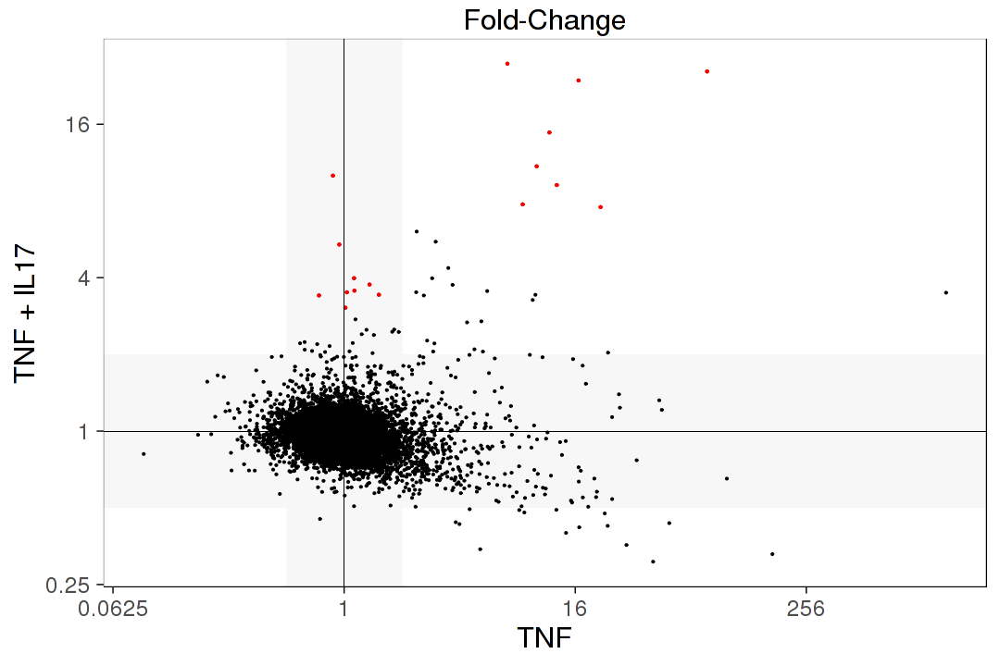

In [45]:
options(repr.plot.width = 9, repr.plot.height = 6)

dat %>% filter(signif) %>%
ggplot(aes(x = TNF, y = TNF_IL17)) +
geom_rect(
  fill = "grey97",
  xmin = -Inf, xmax = Inf, ymin = -log2(2), ymax = log2(2)
) +
geom_rect(
  fill = "grey97",
  ymin = -Inf, ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
geom_point(
  data = dat,
  mapping = aes(x = TNF, y = TNF_IL17),
  size = 0.1
) +
geom_point(
  data = subset(dat, abs(TNF_IL17) > log2(3) & abs(TNF) < log2(2)),
  mapping = aes(x = TNF, y = TNF_IL17),
  color = "red", size = 0.2
) +
# geom_text_repel(
#   data = subset(dat, abs(DoseFactor10) > log2(3) & abs(TimeFactor10) < log2(2)),
#   mapping = aes(x = TimeFactor10, y = DoseFactor10, label = Gene),
#   segment.size = 0.2
# ) +
# geom_point(
#   data = subset(dat, abs(DoseFactor10) < log2(2) & abs(TimeFactor10) > log2(36)),
#   mapping = aes(x = TimeFactor10, y = DoseFactor10),
#   color = "red", size = 0.2
# ) +
# geom_text_repel(
#   data = subset(dat, abs(DoseFactor10) < log2(2) & abs(TimeFactor10) > log2(36)),
#   mapping = aes(x = TimeFactor10, y = DoseFactor10, label = Gene),
#   segment.size = 0.2
# ) +
geom_point(
  data = subset(dat, abs(TNF_IL17) > 2 & abs(TNF) > 2),
  mapping = aes(x = TNF, y = TNF_IL17),
  color = "red", size = 0.2
) +
# geom_text_repel(
#   data = subset(dat, abs(DoseFactor10) > 2 & abs(TimeFactor10) > 2),
#   mapping = aes(x = TimeFactor10, y = DoseFactor10, label = Gene),
#   segment.size = 0.2
# ) +
geom_hline(yintercept = 0, size = 0.2) +
geom_vline(xintercept = 0, size = 0.2) +
scale_y_continuous(labels = function(x) signif(2^x, 3)) +
scale_x_continuous(labels = function(x) signif(2^x, 3)) +
theme(axis.line = element_blank()) +
labs(x = "TNF", y = "TNF + IL17", title = "Fold-Change")

In [46]:
subset(fit1_top, ID %in% c("CSF3"))

,ID,logFC,CI.L,CI.R,AveExpr,t,P.Value,adj.P.Val,B,ensembl_id,Coef,signif
19006,CSF3,3.172364e-15,-0.98705804,0.9870580,1.790834,6.345225e-15,1.000000e+00,1.000000e+00,-7.805615,ENSG00000108342,Intercept,FALSE
24305,CSF3,-1.028289e+00,-2.20312296,0.1465452,1.790834,-1.728006e+00,8.583557e-02,3.855231e-01,-5.395385,ENSG00000108342,t2,FALSE
51180,CSF3,-4.698057e-01,-1.64463978,0.7050283,1.790834,-7.894933e-01,4.309432e-01,7.499606e-01,-6.600694,ENSG00000108342,t4,FALSE
75657,CSF3,-1.939469e-01,-1.36878097,0.9808871,1.790834,-3.259215e-01,7.448918e-01,9.241565e-01,-6.880339,ENSG00000108342,t6,FALSE
98885,CSF3,-2.802674e-02,-1.20286080,1.1468073,1.790834,-4.709803e-02,9.624914e-01,9.877333e-01,-6.938005,ENSG00000108342,t8,FALSE
114215,CSF3,2.946694e-01,-0.88016462,1.4695035,1.790834,4.951825e-01,6.211222e-01,8.331504e-01,-6.830441,ENSG00000108342,t10,FALSE
133647,CSF3,3.079080e-01,-0.86692610,1.4827420,1.790834,5.174294e-01,6.055411e-01,8.374141e-01,-6.787127,ENSG00000108342,t12,FALSE
146616,CSF3,8.016606e-01,-0.37317346,1.9764947,1.790834,1.347165e+00,1.797522e-01,4.787426e-01,-5.983523,ENSG00000108342,t18,FALSE
162466,CSF3,1.239595e+00,0.06476065,2.4144288,1.790834,2.083099e+00,3.876572e-02,2.244099e-01,-4.763198,ENSG00000108342,t24,FALSE
178937,CSF3,1.920219e+00,1.42669038,2.4137484,1.790834,7.681479e+00,1.266107e-12,9.680366e-10,18.199235,ENSG00000108342,d1,TRUE


In [47]:
dat <- reshape2::melt(
  data = dplyr::select(fit1_top, logFC, signif, ID, ensembl_id, Coef),
  id.vars = c("signif", "ID", "Coef", "ensembl_id")
) %>%
# filter(signif) %>%
data.table::dcast(formula = ID + ensembl_id ~ Coef, fun.aggregate = mean, value.var = "value") %>%
mutate(signif = abs(d10) > log2(2) | abs(t6) > log2(2))

#colnames(dat) <- c("Gene", "DoseFactor10", "TimeFactor10", "signif")

subset(dat, ID %in% c("ELF3", "CSF3", "POU2F2", "CXCL1", "CXCL8", "MMP1", "ICAM1"))

,ID,ensembl_id,d1,d10,Intercept,t10,t12,t18,t2,t24,t4,t6,t8,signif
5547,CSF3,ENSG00000108342,1.9202194,3.3297246,3.172364e-15,0.2946694,0.3079080,0.801660596,-1.0282889,1.2395947,-0.46980572,-0.19394691,-0.02802674,TRUE
5668,CXCL1,ENSG00000163739,3.6018779,4.6875079,1.571341e+00,6.3524755,6.3977222,6.346619768,6.5648537,6.3551085,6.28183145,6.28240669,6.32673753,TRUE
5680,CXCL8,ENSG00000169429,1.3469461,1.8038594,6.318416e-01,10.9978220,11.1170872,10.890766567,8.5625756,10.7011752,9.82608734,10.41908058,10.82535646,TRUE
6645,ELF3,ENSG00000163435,1.4482358,2.4315245,8.075669e-01,0.1919160,0.2744657,0.839025863,-0.5673734,0.9595849,-0.04219287,-0.08379862,-0.03324673,TRUE
9035,ICAM1,ENSG00000090339,-0.3027360,-0.6195451,3.347519e+00,6.1024002,5.7718286,4.875479236,5.9628856,4.5246053,6.75124656,6.62397336,6.39316799,TRUE
10887,MMP1,ENSG00000196611,0.2180893,0.2765092,4.051911e+00,6.4072255,6.4222061,6.903854580,2.6748221,7.3451453,4.41939724,5.49862184,6.06220045,TRUE
13290,POU2F2,ENSG00000028277,1.1778541,1.7769817,1.090008e+00,0.4056789,0.7707354,0.001179704,-0.2926870,0.3519195,0.10839474,0.60221377,0.50029859,TRUE


# Define gene categories

In [334]:
cats <- readRDS("analysis/limma/cats.rds")

print(sapply(cats, length))

   C1    C2    C3    C4    C5  None 
   26    25   370    13   202 19243 


In [335]:
dat$category <- 0
dat$category[dat$ensembl_id %in% cats$C1] <- 1
dat$category[dat$ensembl_id %in% cats$C2] <- 2
dat$category[dat$ensembl_id %in% cats$C3] <- 3
dat$category[dat$ensembl_id %in% cats$C4] <- 4
dat$category[dat$ensembl_id %in% cats$C5] <- 5

table(dat$category)


    0     1     2     3     4     5 
19243    26    25   370    13   202 

In [336]:
#dat$category <- 0
#dat$category[    dat$d10  > log2(2)   & dat$t6 < log2(2)  ] <- 1
#dat$category[    dat$d10  > log2(2)   & dat$t6 > log2(2)  ] <- 2
#dat$category[abs(dat$d10) < log2(2)   & dat$t6 > log2(2)  ] <- 3
#dat$category[    dat$d10  < log2(1/2) & dat$t6 > log2(2)  ] <- 4
#dat$category[abs(dat$d10) < log2(2)   & dat$t6 < log2(1/2)] <- 5
#dat$category <- factor(dat$category)
#
#table(dat$category)

In [337]:
dat[which(dat$d10 < log2(1/2) & abs(dat$t6) < log2(2)),]

,ID,ensembl_id,d1,d10,Intercept,t10,t12,t18,t2,t24,t4,t6,t8,signif,category
6067,DKK1,ENSG00000107984,-0.4632467,-1.145277,5.727995,-0.6138084,-0.3245518,-0.2848616,-0.107703,-0.07810911,-0.9023972,-0.4181737,-0.1594664,TRUE,0


In [338]:
ens_to_cat <- unlist(split(dat$category, dat$ensembl_id))
print(head(ens_to_cat))
table(ens_to_cat)

ENSG00000000003 ENSG00000000419 ENSG00000000457 ENSG00000000460 ENSG00000000938 
              0               0               0               0               0 
ENSG00000000971 
              0 


ens_to_cat
    0     1     2     3     4     5 
19243    26    25   370    13   202 

In [339]:
dat_cat <- dat %>% 
filter(category != 0) %>%
group_by(category) %>%
top_n(n = 5, wt = d10 ^ 2 + t6 ^ 2) %>%
dplyr::select(category, ID, ensembl_id, d10, t6) %>%
arrange(category, -d10)

dat_cat %>%
mutate(d10 = sigfig(d10, 2), t6 = sigfig(t6, 2))

category,ID,ensembl_id,d10,t6
1,CSF3,ENSG00000108342,3.3,-0.19
1,ELF3,ENSG00000163435,2.4,-0.084
1,IL23A,ENSG00000110944,2.0,0.17
1,NR4A2,ENSG00000153234,1.9,0.44
1,POU2F2,ENSG00000028277,1.8,0.60
2,CXCL2,ENSG00000081041,4.8,2.8
2,CXCL1,ENSG00000163739,4.7,6.3
2,CXCL3,ENSG00000163734,4.6,4.1
2,CCL20,ENSG00000115009,2.9,4.4
2,CXCL8,ENSG00000169429,1.8,10


In [340]:
dat %>%
filter(ID == "CXCL9")

ID,ensembl_id,d1,d10,Intercept,t10,t12,t18,t2,t24,t4,t6,t8,signif,category
CXCL9,ENSG00000138755,-0.5156561,-0.7857589,1.519042e-15,1.284482,1.182585,0.9619691,0.4747331,0.9052317,0.5414596,1.032014,1.377167,TRUE,3


Fold-change for some of the most strongly affected genes:

In [360]:
plot_these_genes <- function(
  these_genes, title = NULL, filename = NULL, show_pval = FALSE, ncol = 5, res = 150
) {
  plotlist <- lapply(these_genes, function(gene) {
    this_subtitle <- NULL
    if (show_pval) {
      this_subtitle = sub('-0', '-', sprintf("P=%.0e", dtime$pval[dtime$gene == gene]))
    }
    plot_gene_by_stimulation(gene = gene, meta = meta, log2tpm = log2tpm_batch) +
    theme(legend.position = "none", axis.text.x = element_blank()) +
    labs(
      x = NULL, y = NULL, subtitle = this_subtitle
    )
  })

  ncol <- min(ncol, length(plotlist))
  nrow <- ceiling(length(these_genes) / ncol)
  width <- 1 + 1.2 * ncol
  height_mult <- 1.2
  if (show_pval) {
    height_mult <- 1.4
  }
  height <- 1 + height_mult * nrow
  if (nrow == 1) {
    height <- 0.7 + height_mult * nrow
  }

  options(repr.plot.width = width, repr.plot.height = height)

  p <- patchwork::wrap_plots(plotlist, ncol = ncol)
  
  if (!is.null(title)) {
    patchwork::plot_annotation(
      title = title,
      theme = theme(
        plot.title = element_text(size = 20)
      )
    )
  }
  if (!is.null(filename)) {
    pdf(file = filename, width = width, height = height)
    print(p)
    dev.off()
  } else {
    show_plot(p, res = res)
  }
}

In [513]:
# dat_c1 <- subset(dat, category == 1) %>%
# top_n(n = 5, wt = d10 - abs(t6)) %>%
# dplyr::select(category, ID, d10, t6) %>%
# arrange(category, -d10)

# dat_c2 <- subset(dat, category == 2) %>%
# top_n(n = 18, wt = d10 + t6) %>%
# dplyr::select(category, ID, d10, t6) %>%
# arrange(category, -d10)

# dat_c3 <- subset(dat, category == 3) %>%
# top_n(n = 5, wt = t6 - abs(d10)) %>%
# dplyr::select(category, ID, d10, t6) %>%
# arrange(category, -d10)

# dat_c4 <- subset(dat, category == 4) %>%
# top_n(n = 10, wt = t6 - d10) %>%
# dplyr::select(category, ID, d10, t6) %>%
# arrange(category, -d10)

# dat_c5 <- subset(dat, category == 5) %>%
# top_n(n = 3, wt = -t6 - abs(d10)) %>%
# dplyr::select(category, ID, d10, t6) %>%
# arrange(category, -d10)

# Sort by weight

gt_x <- function(x, y) {
  ifelse(y > x, y, 0)
}

lt_x <- function(x, y) {
  ifelse(y < x, y, 0)
}

dat_c1 <- subset(dat, category == 1) %>%
mutate(weight = gt_x(0, d10) ^ 2 - (2 * t6) ^ 2) %>%
top_n(n = 8, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c2 <- subset(dat, category == 2) %>%
mutate(weight = gt_x(0, d10) ^ 2 + gt_x(t6, 0) ^ 2) %>%
top_n(n = 18, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c3 <- subset(dat, category == 3) %>%
mutate(weight = gt_x(0, t6) ^ 2 - (2 * d10) ^ 3) %>%
top_n(n = 7, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c4 <- subset(dat, category == 4) %>%
mutate(weight = gt_x(0, t6) ^ 2 + 3 * lt_x(0, d10) ^ 3) %>%
top_n(n = 10, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c5 <- subset(dat, category == 5) %>%
mutate(weight = lt_x(0, t6) ^ 2 - (2 * d10) ^ 3) %>%
top_n(n = 5, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_cat <- dplyr::bind_rows(dat_c1, dat_c2, dat_c3, dat_c4, dat_c5)

dat_cat %>%
mutate(d10 = sigfig(2^d10, 2), t6 = sigfig(2^t6, 2))


category,ensembl_id,ID,d10,t6,weight
1,ENSG00000108342,CSF3,10,0.87,10.936604
1,ENSG00000163435,ELF3,5.4,0.94,5.884222
1,ENSG00000110944,IL23A,4.0,1.1,3.855338
1,ENSG00000159167,STC1,3.5,1.0,3.263924
1,ENSG00000250339,CXCL1P1,3.6,1.1,3.223139
1,ENSG00000153234,NR4A2,3.8,1.4,2.873802
1,ENSG00000095752,IL11,3.0,1.0,2.585676
1,ENSG00000162840,MT2P1,3.4,0.74,2.369144
2,ENSG00000081041,CXCL2,28,7.1,22.931973
2,ENSG00000163739,CXCL1,26,78,21.972730


# Figure 1D selected genes

[1] 25

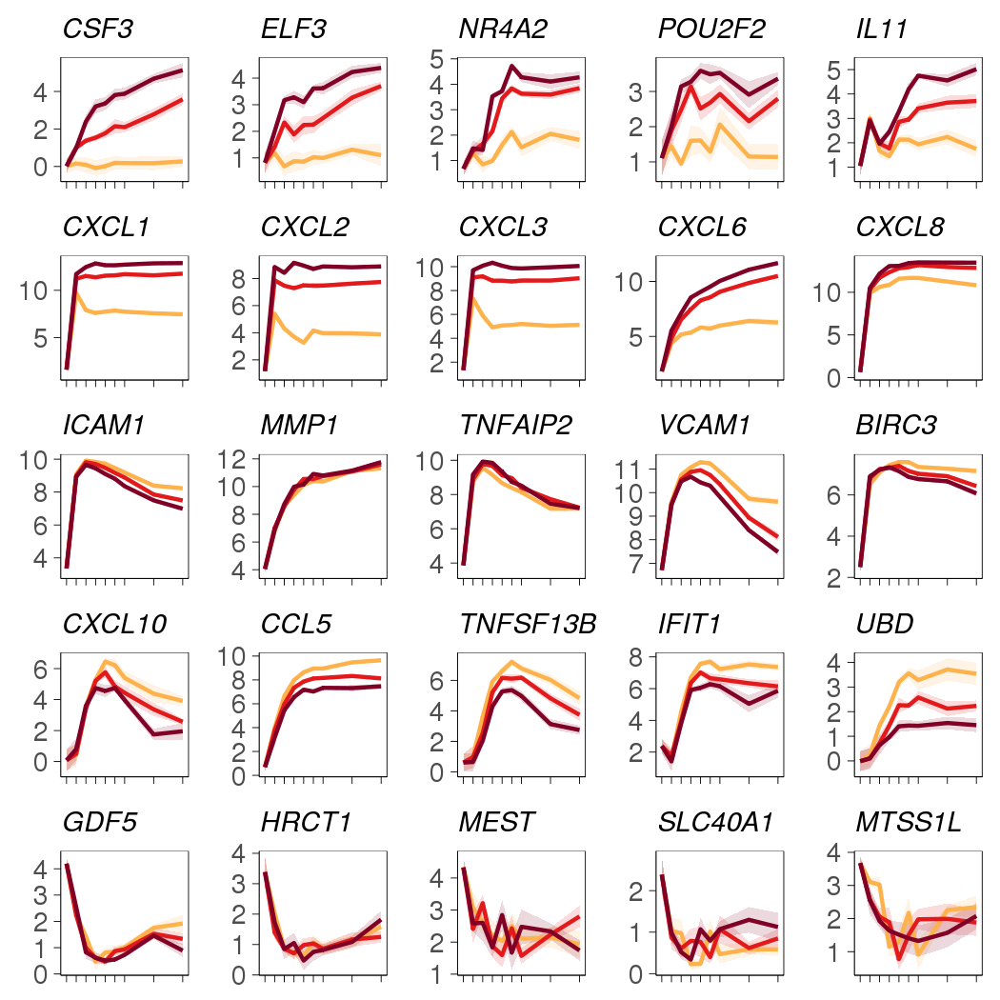

In [566]:
source("R/002_helper_functions.R")
# plot_these_genes(these_genes = (dat_cat %>% group_by(category) %>% top_n(n = 5, wt = weight))$ID)

# these_genes <- c("ELF3", "NR4A2", "POU2F2", "IL11")
these_genes <- c(
  "CSF3", "ELF3", "NR4A2", "POU2F2", "IL11",
  
  "CXCL1", "CXCL2", "CXCL3", "CXCL6", "CXCL8",
  
  "ICAM1", "MMP1", "TNFAIP2", "VCAM1", "BIRC3",
  
  # "UBD", "CXCL9", "CXCL10", "CXCL11", "IFIT1",
  "CXCL10", "CCL5", "TNFSF13B", "IFIT1", "UBD",
  
  "GDF5", "HRCT1", "MEST", "SLC40A1", "MTSS1L"
)

length(these_genes)

plot_these_genes(these_genes)

[1] 10

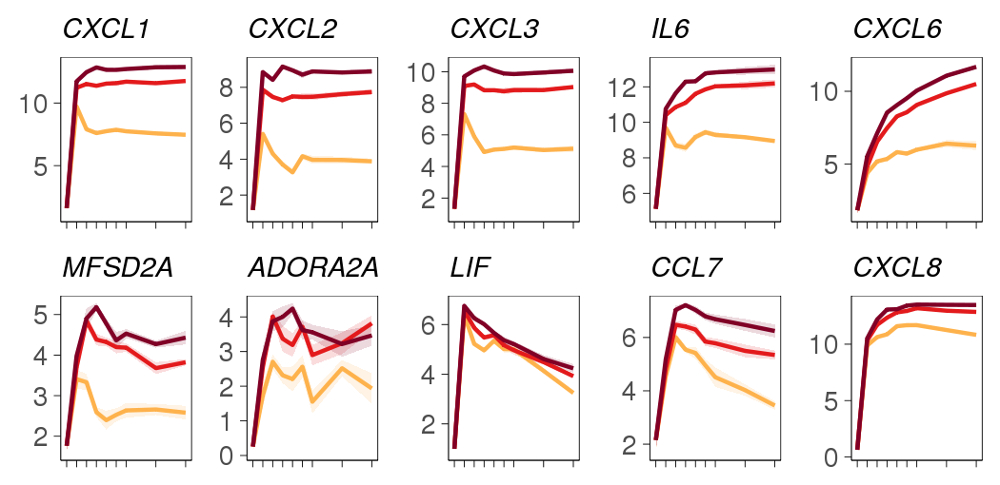

In [569]:
source("R/002_helper_functions.R")
# plot_these_genes(these_genes = (dat_cat %>% group_by(category) %>% top_n(n = 5, wt = weight))$ID)

# these_genes <- c("ELF3", "NR4A2", "POU2F2", "IL11")
these_genes <- c(
  "CXCL1", "CXCL2", "CXCL3", "IL6",  "CXCL6", "MFSD2A", "ADORA2A", "LIF", "CCL7", "CXCL8"
)

length(these_genes)

plot_these_genes(these_genes)

[1] 10

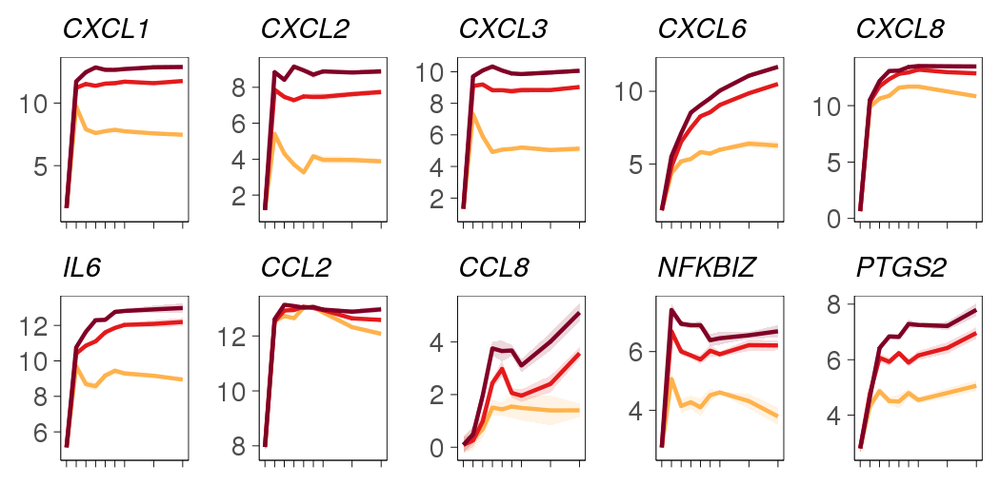

In [596]:
source("R/002_helper_functions.R")
# plot_these_genes(these_genes = (dat_cat %>% group_by(category) %>% top_n(n = 5, wt = weight))$ID)

# these_genes <- c("ELF3", "NR4A2", "POU2F2", "IL11")
these_genes <- c(
  "CXCL1", "CXCL2", "CXCL3", "CXCL6", "CXCL8",
  "IL6",  "CCL2", "CCL8", "NFKBIZ", "PTGS2"
)

length(these_genes)

plot_these_genes(these_genes)

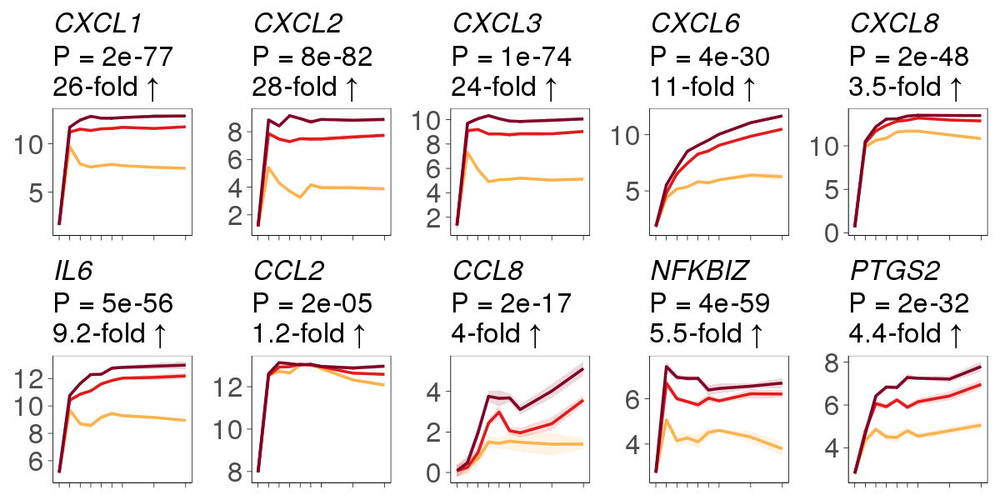

In [601]:
plots <- lapply(these_genes, function(gene) {
  annot <- fit1_top %>% filter(ID == gene & Coef == "d10") %>% as.list

  scientific_10 <- function(x) {
    parse(text=gsub("e", " %*% 10^", scales::scientific_format()(x)))
  }

  pval <- sprintf("P = %s", signif(annot$P.Value, 1))
  fc   <- sprintf("%s-fold %s", signif(2 ^ annot$logFC, 2), ifelse(annot$logFC > 0, "↑", "↓"))

  p <- plot_gene_by_stimulation(gene = gene, meta = meta, log2tpm = log2tpm_batch) +
  theme(
    legend.position = "none",
    axis.text.x = element_blank(),
    axis.text.y = element_text(size = 20),
    plot.title = element_text(size = 20),
    plot.subtitle = element_text(size = 20)
  ) +
  labs(
    x = NULL, y = NULL, subtitle = sprintf("%s\n%s", pval, fc)
  )

  p
})

options(repr.plot.width = 10, repr.plot.height = 5)

show_plot(name = "figure5-dose",
  wrap_plots(plots, ncol = 5)
)


[1] 5

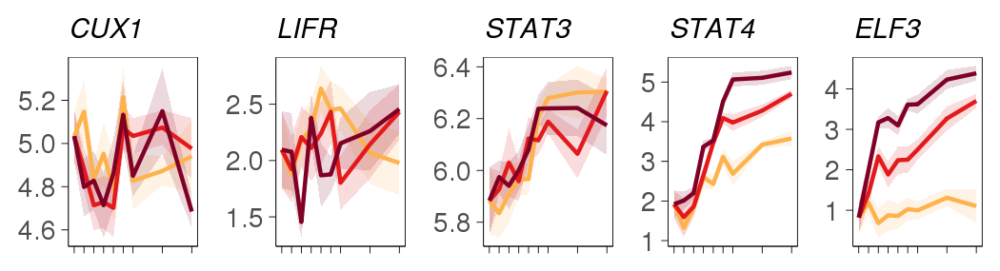

In [570]:
source("R/002_helper_functions.R")
# plot_these_genes(these_genes = (dat_cat %>% group_by(category) %>% top_n(n = 5, wt = weight))$ID)

# these_genes <- c("ELF3", "NR4A2", "POU2F2", "IL11")
these_genes <- c(
  "CUX1", "LIFR", "STAT3", "STAT4", "ELF3"
)

length(these_genes)

plot_these_genes(these_genes)

[1] 2

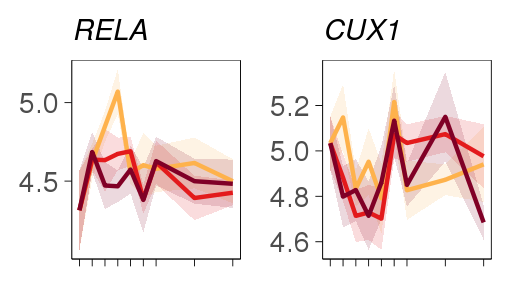

In [573]:
source("R/002_helper_functions.R")
# plot_these_genes(these_genes = (dat_cat %>% group_by(category) %>% top_n(n = 5, wt = weight))$ID)

# these_genes <- c("ELF3", "NR4A2", "POU2F2", "IL11")
these_genes <- c(
  "RELA", "CUX1"
)

length(these_genes)

plot_these_genes(these_genes)

[1] 2

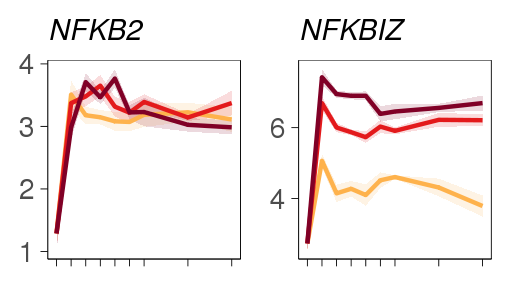

In [574]:
source("R/002_helper_functions.R")
# plot_these_genes(these_genes = (dat_cat %>% group_by(category) %>% top_n(n = 5, wt = weight))$ID)

# these_genes <- c("ELF3", "NR4A2", "POU2F2", "IL11")
these_genes <- c(
  "NFKB2", "NFKBIZ"
)

length(these_genes)

plot_these_genes(these_genes)

In [54]:
fit1_top %>%
dplyr::filter(ID %in% c("POU2F2")) %>%
dplyr::select(ID, Coef, logFC, CI.L, CI.R, P.Value) %>%
mutate(
  logFC = sigfig(2^logFC),
  CI.L = sigfig(2^CI.L),
  CI.R = sigfig(2^CI.R),
  P.Value = sigfig(P.Value, 2))

ID,Coef,logFC,CI.L,CI.R,P.Value
POU2F2,Intercept,2.1,1.4,3.3,0.0010
POU2F2,t2,0.82,0.48,1.4,0.45
POU2F2,t4,1.1,0.63,1.8,0.78
POU2F2,t6,1.5,0.89,2.6,0.12
POU2F2,t8,1.4,0.83,2.4,0.20
POU2F2,t10,1.3,0.78,2.3,0.30
POU2F2,t12,1.7,1.0,2.9,0.049
POU2F2,t18,1.0,0.59,1.7,1.0
POU2F2,t24,1.3,0.75,2.2,0.37
POU2F2,d1,2.3,1.8,2.8,1.7e-11


In [333]:
table(dat$category)


    0     1     2     3     4     5 
19243    26    25   370    13   202 

In [57]:
dat_cat$ID[dat_cat$category == 1]

[1] "CSF3"    "ELF3"    "IL23A"   "STC1"    "CXCL1P1"

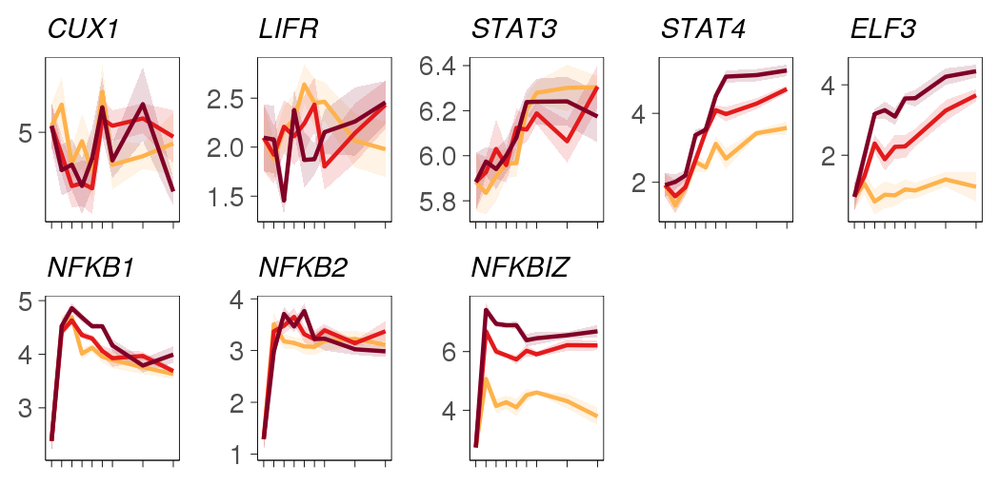

In [362]:
plot_these_genes(
  these_genes = c("CUX1", "LIFR", "STAT3", "STAT4", "ELF3", "NFKB1", "NFKB2", "NFKBIZ"),
  title = sprintf("siRNA")
)

In [502]:
dat_cat

category,ensembl_id,ID,d10,t6,weight
1,ENSG00000108342,CSF3,3.32972462,-0.19394691,10.9366044
1,ENSG00000163435,ELF3,2.43152446,-0.08379862,5.8842224
1,ENSG00000110944,IL23A,1.99335816,0.17185654,3.8553381
1,ENSG00000159167,STC1,1.80919097,0.04808206,3.2639244
1,ENSG00000250339,CXCL1P1,1.83037160,0.17827063,3.2231385
2,ENSG00000081041,CXCL2,4.78873401,2.82628171,22.9319734
2,ENSG00000163739,CXCL1,4.68750789,6.28240669,21.9727302
2,ENSG00000163734,CXCL3,4.57039711,4.05752521,20.8885298
2,ENSG00000166920,NMES1,3.89201477,3.55294058,15.1477790
2,ENSG00000124875,CXCL6,3.45152973,3.33244714,11.9130575


In [503]:
#
#plot_these_genes(ncol = 6,
#  these_genes = dat_cat$ID[dat_cat$category == 1],
#  title = sprintf("Category %s", 1),
#  res = 300
#)
#plot_these_genes(ncol = 6,
#  these_genes = dat_cat$ID[dat_cat$category == 2],
#  title = sprintf("Category %s", 2),
#  res = 300
#)
#plot_these_genes(ncol = 6,
#  these_genes = dat_cat$ID[dat_cat$category == 3],
#  title = sprintf("Category %s", 3),
#  res = 300
#)
#plot_these_genes(ncol = 6,
#  these_genes = dat_cat$ID[dat_cat$category == 4],
#  title = sprintf("Category %s", 4),
#  res = 300
#)
#plot_these_genes(ncol = 6,
#  these_genes = dat_cat$ID[dat_cat$category == 5],
#  title = sprintf("Category %s", 5),
#  res = 300
#)

In [504]:
dat %>% filter(abs(t6) < log2(2)) %>% arrange(d10) %>% head

ID,ensembl_id,d1,d10,Intercept,t10,t12,t18,t2,t24,t4,t6,t8,signif,category
DKK1,ENSG00000107984,-0.4632467,-1.1452774,5.727995,-0.6138084,-0.32455181,-0.2848616,-0.1077030,-0.07810911,-0.90239719,-0.418173707,-0.15946635,TRUE,0
KRTAP2-3,ENSG00000212724,-0.4058008,-0.9789856,2.034149,-0.1914814,-0.08479476,-0.0580171,0.9152205,-0.66957755,0.13158530,0.171081857,0.03226846,FALSE,0
TIMM8BP2,ENSG00000224908,0.2141202,-0.9699199,3.902232,-0.1389758,-0.06821361,-0.3586936,-0.1641869,0.16947908,0.59660844,0.802821112,0.44189176,FALSE,0
CASP1,ENSG00000137752,-0.3146754,-0.8503011,2.419759,1.6468319,1.19600494,0.8289295,-0.3303614,0.91831066,0.51638429,0.955122461,1.46903881,FALSE,0
FGF5,ENSG00000138675,-0.4788910,-0.8404666,4.938029,-0.4183070,-0.68148151,-0.5667465,1.2873894,-0.76647881,0.44591120,0.009196304,-0.39902941,FALSE,0
GADD45A,ENSG00000116717,-0.4806829,-0.8093532,4.830883,0.2383788,0.33081738,0.2388386,0.5212301,-0.11622199,0.01495696,0.523928788,0.29029323,FALSE,0


In [505]:
dat_label <- dat
dat_label$label <- ""
dat_label$label[dat_label$ID %in% dat_cat$ID] <- dat_label$ID[dat_label$ID %in% dat_cat$ID]

In [506]:
library(ggrepel)

## Figure 1 Scatter Plot

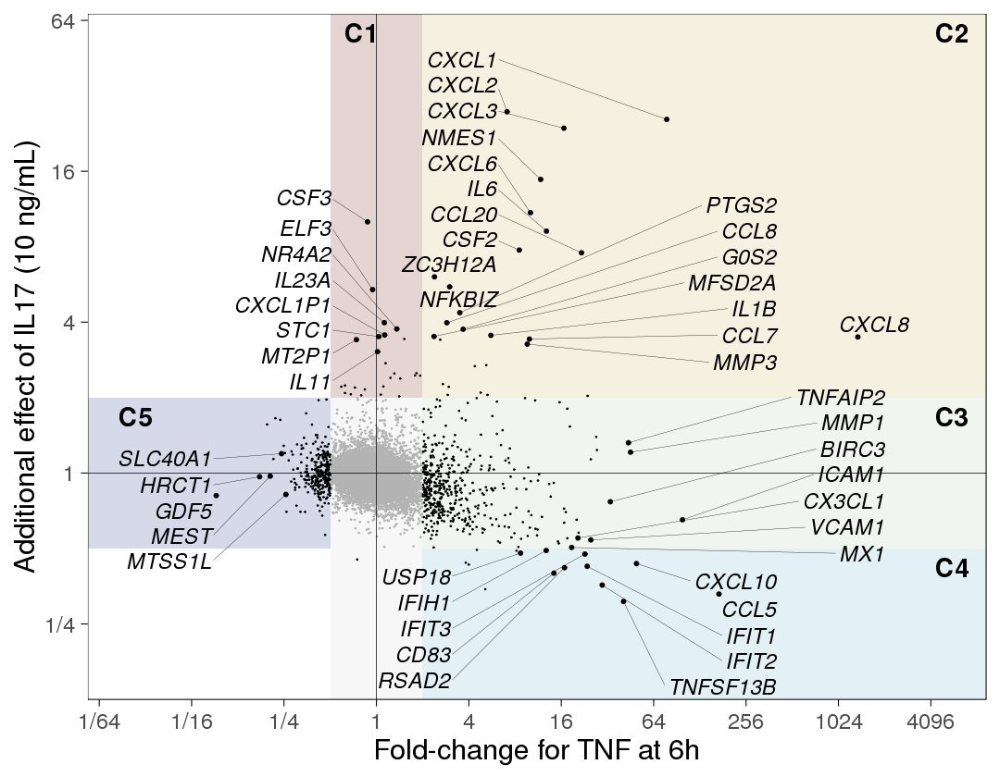

In [526]:
options(repr.plot.width = 9, repr.plot.height = 7)

effect_x <- "t6"
effect_y <- "d10"

cat_colors <- brewer.pal(n = 5, name = "Set1")
cat_colors <- scico::scico(n = 5, palette = "roma")
cat_alpha  <- 0.15

# dat %>% filter(signif) %>%
p <- ggplot() +
annotate(
  geom = "rect",
  fill = "grey97",
  xmin = -Inf, xmax = Inf, ymin = -log2(2), ymax = log2(2)
) +
annotate(
  geom = "rect",
  fill = "grey97",
  ymin = -Inf, ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
annotate(
  geom = "rect",
  fill = cat_colors[1],
  alpha = cat_alpha, color = NA,
  ymin = log2(2), ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
annotate(
  geom = "rect",
  fill = cat_colors[2],
  alpha = cat_alpha, color = NA,
  ymin = log2(2), ymax = Inf, xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[3],
  alpha = cat_alpha, color = NA,
  ymin = -log2(2), ymax = log2(2), xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[4],
  alpha = cat_alpha, color = NA,
  ymin = -Inf, ymax = -log2(2), xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[5],
  alpha = cat_alpha, color = NA,
  ymin = -log2(2), ymax = log2(2), xmin = -Inf, xmax = -log2(2)
) +
annotate(
  geom = "text", color = "black", label = "C1",
  y = Inf, x = -log(2), hjust = 0, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C2",
  y = Inf, x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C3",
  y = log2(2), x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C4",
  y = -log2(2), x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C5",
  y = log2(2), x = -Inf, hjust = -0.9, vjust = 1.5, size = 6, fontface = "bold"
) +
geom_point(
  data = dat,
  mapping = aes_string(x = effect_x, y = effect_y, color = "signif"),
  size = 0.1
) +
geom_point(
  data = dat_cat,
  mapping = aes_string(x = effect_x, y = effect_y),
  size = 1
) +
# geom_text_repel(
#   data = dat_cat %>% filter(!category %in% c(1, 3, 4, 5)),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.2,
#   fontface = "italic"
# ) +
geom_text_repel(
  data = tail(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 10),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(6) - tail(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 10)$t6,
  hjust = 1, nudge_y = log2(1.4),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = head(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 7),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(400) - head(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 7)$t6,
  hjust = 1, nudge_y = log2(2),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = dat_cat %>% filter(ID == "CXCL8"),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = dat_cat %>% filter(category == 1),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(1/2) - (dat_cat %>% filter(category == 1))$t6,
  hjust = 1, nudge_y = log2(1.25),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = dat_cat %>% filter(category == 5),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(1/12) - (dat_cat %>% filter(category == 5))$t6,
  hjust = 1, nudge_y = log2(1/1.25),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = dat_cat %>% filter(category == 3),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(2024) - (dat_cat %>% filter(category == 3))$t6,
  hjust = 1, nudge_y = log2(1.3),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = tail(dat_cat %>% filter(category == 4) %>% arrange(t6), 5),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(400) - tail(dat_cat %>% filter(category == 4) %>% arrange(t6), 5)$t6,
  hjust = 1, nudge_y = log2(1/1.75),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
geom_text_repel(
  data = head(dat_cat %>% filter(category == 4) %>% arrange(t6), 5),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(3) - head(dat_cat %>% filter(category == 4) %>% arrange(t6), 5)$t6,
  hjust = 1, nudge_y = log2(1/1.75),
  direction = "y",
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
  fontface = "italic"
) +
scale_color_manual(values = c("grey70", "black")) +
geom_hline(yintercept = 0, size = 0.2) +
geom_vline(xintercept = 0, size = 0.2) +
# scale_y_continuous(labels = function(x) signif(2^x, 3)) +
# scale_x_continuous(labels = function(x) fractional::fractional(2^x, 3)) +
# scale_y_continuous(labels = function(x) (2^abs(x)), breaks = scales::pretty_breaks(6)) +
# scale_x_continuous(labels = function(x) (2^abs(x)), breaks = scales::pretty_breaks(8)) +
scale_y_continuous(expand = c(0.2, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(6)) +
scale_x_continuous(expand = c(0.2, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(8)) +
theme(legend.position = "none") +
labs(x = "Fold-change for TNF at 6h", y = "Additional effect of IL17 (10 ng/mL)")

# p
show_plot(p, name = "figure1-scatter")#, res = 600)

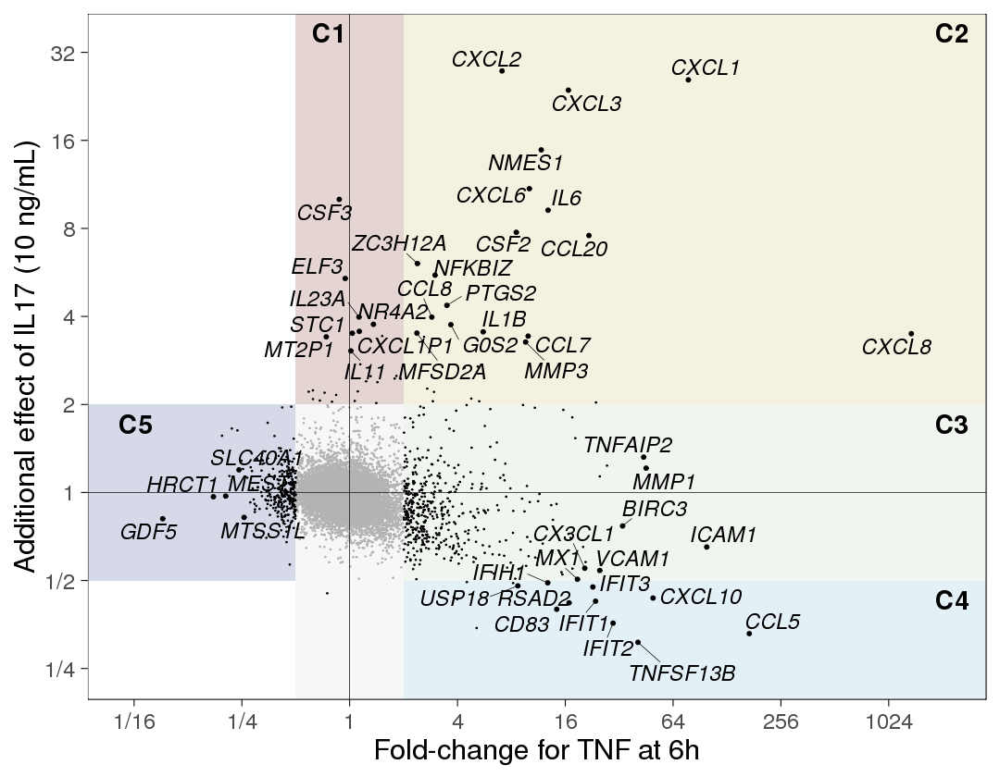

In [534]:
options(repr.plot.width = 9, repr.plot.height = 7)

effect_x <- "t6"
effect_y <- "d10"

cat_colors <- brewer.pal(n = 5, name = "Set1")
cat_colors <- scico::scico(n = 5, palette = "roma")
cat_alpha  <- 0.15

# dat %>% filter(signif) %>%
p <- ggplot() +
annotate(
  geom = "rect",
  fill = "grey97",
  xmin = -Inf, xmax = Inf, ymin = -log2(2), ymax = log2(2)
) +
annotate(
  geom = "rect",
  fill = "grey97",
  ymin = -Inf, ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
annotate(
  geom = "rect",
  fill = cat_colors[1],
  alpha = cat_alpha, color = NA,
  ymin = log2(2), ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
annotate(
  geom = "rect",
  fill = cat_colors[2],
  alpha = cat_alpha, color = NA,
  ymin = log2(2), ymax = Inf, xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[3],
  alpha = cat_alpha, color = NA,
  ymin = -log2(2), ymax = log2(2), xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[4],
  alpha = cat_alpha, color = NA,
  ymin = -Inf, ymax = -log2(2), xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[5],
  alpha = cat_alpha, color = NA,
  ymin = -log2(2), ymax = log2(2), xmin = -Inf, xmax = -log2(2)
) +
annotate(
  geom = "text", color = "black", label = "C1",
  y = Inf, x = -log(2), hjust = 0, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C2",
  y = Inf, x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C3",
  y = log2(2), x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C4",
  y = -log2(2), x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C5",
  y = log2(2), x = -Inf, hjust = -0.9, vjust = 1.5, size = 6, fontface = "bold"
) +
geom_point(
  data = dat,
  mapping = aes_string(x = effect_x, y = effect_y, color = "signif"),
  size = 0.1
) +
geom_point(
  data = dat_cat,
  mapping = aes_string(x = effect_x, y = effect_y),
  size = 1
) +
geom_text_repel(
  data = dat %>% filter(ID %in% dat_cat$ID),
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.2,
  fontface = "italic"
) +
# geom_text_repel(
#   data = tail(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 10),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(6) - tail(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 10)$t6,
#   hjust = 1, nudge_y = log2(1.4),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = head(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 7),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(400) - head(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 7)$t6,
#   hjust = 1, nudge_y = log2(2),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(ID == "CXCL8"),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(category == 1),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/2) - (dat_cat %>% filter(category == 1))$t6,
#   hjust = 1, nudge_y = log2(1.25),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(category == 5),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/12) - (dat_cat %>% filter(category == 5))$t6,
#   hjust = 1, nudge_y = log2(1/1.25),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(category == 3),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(2024) - (dat_cat %>% filter(category == 3))$t6,
#   hjust = 1, nudge_y = log2(1.3),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = tail(dat_cat %>% filter(category == 4) %>% arrange(t6), 5),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(400) - tail(dat_cat %>% filter(category == 4) %>% arrange(t6), 5)$t6,
#   hjust = 1, nudge_y = log2(1/1.75),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = head(dat_cat %>% filter(category == 4) %>% arrange(t6), 5),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(3) - head(dat_cat %>% filter(category == 4) %>% arrange(t6), 5)$t6,
#   hjust = 1, nudge_y = log2(1/1.75),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
scale_color_manual(values = c("grey70", "black")) +
geom_hline(yintercept = 0, size = 0.2) +
geom_vline(xintercept = 0, size = 0.2) +
# scale_y_continuous(labels = function(x) signif(2^x, 3)) +
# scale_x_continuous(labels = function(x) fractional::fractional(2^x, 3)) +
# scale_y_continuous(labels = function(x) (2^abs(x)), breaks = scales::pretty_breaks(6)) +
# scale_x_continuous(labels = function(x) (2^abs(x)), breaks = scales::pretty_breaks(8)) +
# scale_y_continuous(expand = c(0.2, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(6)) +
# scale_x_continuous(expand = c(0.2, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(8)) +
scale_y_continuous(expand = c(0.1, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(6)) +
scale_x_continuous(expand = c(0.1, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(8)) +
theme(legend.position = "none") +
labs(x = "Fold-change for TNF at 6h", y = "Additional effect of IL17 (10 ng/mL)")

# p
show_plot(p, name = "figure1-scatter")#, res = 600)

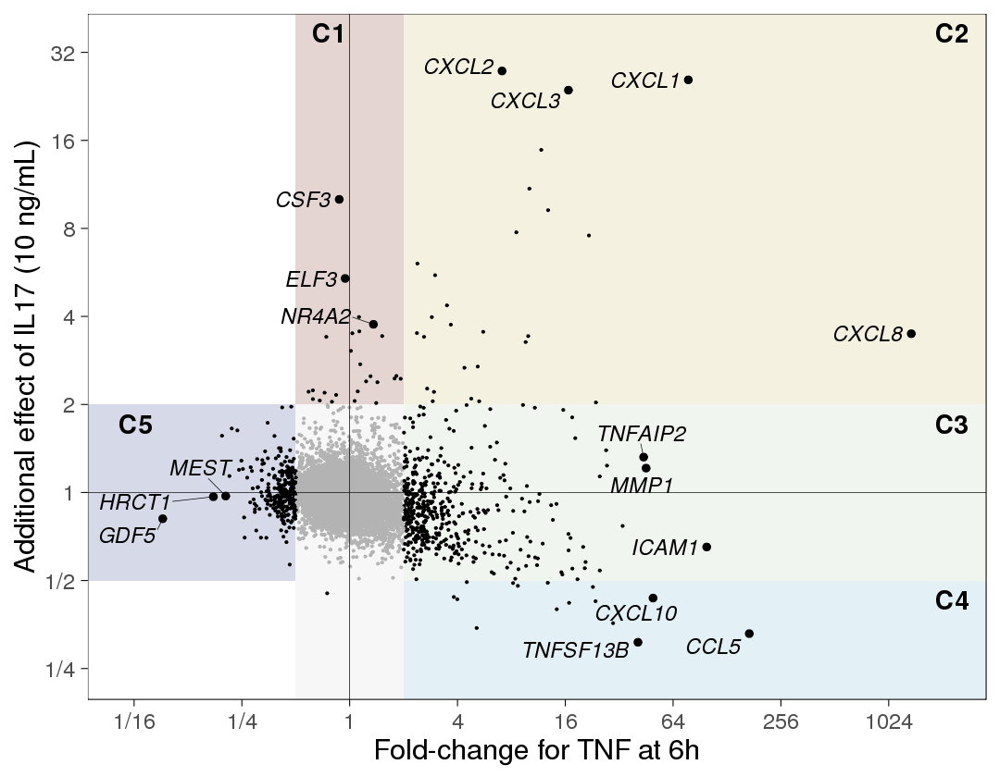

In [560]:
options(repr.plot.width = 9, repr.plot.height = 7)

effect_x <- "t6"
effect_y <- "d10"

cat_colors <- brewer.pal(n = 5, name = "Set1")
cat_colors <- scico::scico(n = 5, palette = "roma")
cat_alpha  <- 0.15

dat_text <- dat %>% filter(ID %in% c("CSF3", "ELF3", "NR4A2", "GDF5", "HRCT1", "MEST", "CXCL1", "CXCL2", "CXCL3", "CXCL8", "ICAM1", "MMP1", "TNFAIP2", "TNFSF13B", "CCL5", "CXCL10"))

d2 <- dat %>% filter(category != 0)
d2$ID <- ifelse(d2$ID %in% dat_text$ID, d2$ID, "")

# dat %>% filter(signif) %>%
p <- ggplot() +
annotate(
  geom = "rect",
  fill = "grey97",
  xmin = -Inf, xmax = Inf, ymin = -log2(2), ymax = log2(2)
) +
annotate(
  geom = "rect",
  fill = "grey97",
  ymin = -Inf, ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
annotate(
  geom = "rect",
  fill = cat_colors[1],
  alpha = cat_alpha, color = NA,
  ymin = log2(2), ymax = Inf, xmin = -log2(2), xmax = log2(2)
) +
annotate(
  geom = "rect",
  fill = cat_colors[2],
  alpha = cat_alpha, color = NA,
  ymin = log2(2), ymax = Inf, xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[3],
  alpha = cat_alpha, color = NA,
  ymin = -log2(2), ymax = log2(2), xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[4],
  alpha = cat_alpha, color = NA,
  ymin = -Inf, ymax = -log2(2), xmin = log2(2), xmax = Inf
) +
annotate(
  geom = "rect",
  fill = cat_colors[5],
  alpha = cat_alpha, color = NA,
  ymin = -log2(2), ymax = log2(2), xmin = -Inf, xmax = -log2(2)
) +
annotate(
  geom = "text", color = "black", label = "C1",
  y = Inf, x = -log(2), hjust = 0, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C2",
  y = Inf, x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C3",
  y = log2(2), x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C4",
  y = -log2(2), x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C5",
  y = log2(2), x = -Inf, hjust = -0.9, vjust = 1.5, size = 6, fontface = "bold"
) +
geom_point(
  data = dat,
  mapping = aes_string(x = effect_x, y = effect_y, color = "signif"),
  size = 0.5
) +
geom_point(
#   data = dat_cat,
  data = dat_text,
  mapping = aes_string(x = effect_x, y = effect_y),
  size = 2
) +
geom_text_repel(
  data = d2,
  mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
  nudge_x = log2(1/1.4),
  size = 5, box.padding = unit(0.4, "lines"), segment.size = 0.2,
  fontface = "italic"
) +
# geom_text_repel(
#   data = dat %>% filter(ID %in% c("CXCL1", "CXCL2", "CXCL3", "CXCL8", "ICAM1", "MMP1", "TNFAIP2", "TNFSF13B", "CCL5", "CXCL10")),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   size = 5, box.padding = unit(0.4, "lines"), segment.size = 0.2,
#   fontface = "italic",
#   seed = 44
# ) +
# geom_text_repel(
#   data = dat %>% filter(ID %in% c("NR4A2")),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/1.2), nudge_y = log2(1.2),
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.2,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat %>% filter(ID %in% c("CSF3", "ELF3")),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/1.4),
#   size = 5, box.padding = unit(0.4, "lines"), segment.size = 0.2,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat %>% filter(ID %in% c("GDF5", "HRCT1")),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/1.4),
#   size = 5, box.padding = unit(0.4, "lines"), segment.size = 0.2,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = tail(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 10),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(6) - tail(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 10)$t6,
#   hjust = 1, nudge_y = log2(1.4),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = head(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 7),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(400) - head(dat_cat %>% filter(category == 2 & ID != "CXCL8") %>% arrange(d10), 7)$t6,
#   hjust = 1, nudge_y = log2(2),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(ID == "CXCL8"),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(category == 1),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/2) - (dat_cat %>% filter(category == 1))$t6,
#   hjust = 1, nudge_y = log2(1.25),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(category == 5),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(1/12) - (dat_cat %>% filter(category == 5))$t6,
#   hjust = 1, nudge_y = log2(1/1.25),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = dat_cat %>% filter(category == 3),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(2024) - (dat_cat %>% filter(category == 3))$t6,
#   hjust = 1, nudge_y = log2(1.3),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = tail(dat_cat %>% filter(category == 4) %>% arrange(t6), 5),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(400) - tail(dat_cat %>% filter(category == 4) %>% arrange(t6), 5)$t6,
#   hjust = 1, nudge_y = log2(1/1.75),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
# geom_text_repel(
#   data = head(dat_cat %>% filter(category == 4) %>% arrange(t6), 5),
#   mapping = aes_string(x = effect_x, y = effect_y, label = "ID"),
#   nudge_x = log2(3) - head(dat_cat %>% filter(category == 4) %>% arrange(t6), 5)$t6,
#   hjust = 1, nudge_y = log2(1/1.75),
#   direction = "y",
#   size = 5, box.padding = unit(0.2, "lines"), segment.size = 0.1,
#   fontface = "italic"
# ) +
scale_color_manual(values = c("grey70", "black")) +
geom_hline(yintercept = 0, size = 0.2) +
geom_vline(xintercept = 0, size = 0.2) +
# scale_y_continuous(labels = function(x) signif(2^x, 3)) +
# scale_x_continuous(labels = function(x) fractional::fractional(2^x, 3)) +
# scale_y_continuous(labels = function(x) (2^abs(x)), breaks = scales::pretty_breaks(6)) +
# scale_x_continuous(labels = function(x) (2^abs(x)), breaks = scales::pretty_breaks(8)) +
# scale_y_continuous(expand = c(0.2, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(6)) +
# scale_x_continuous(expand = c(0.2, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(8)) +
scale_y_continuous(expand = c(0.1, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(6)) +
scale_x_continuous(expand = c(0.1, 0), labels = function(x) fractional::fractional(2^x), breaks = scales::pretty_breaks(8)) +
theme(legend.position = "none") +
labs(x = "Fold-change for TNF at 6h", y = "Additional effect of IL17 (10 ng/mL)")

# p
show_plot(p, name = "figure1-scatter")#, res = 600)

# Figure S2: dose effect sizes

In [65]:
gene_categories <- unlist(with(dat, split(category, ID)))

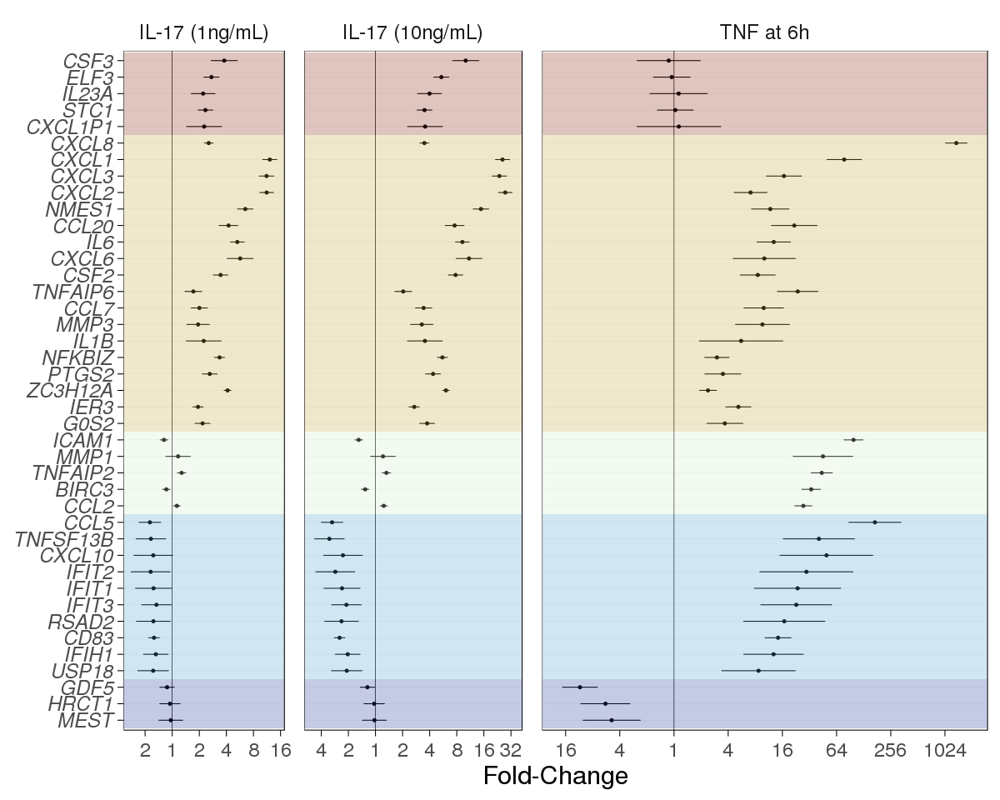

In [66]:
options(repr.plot.width = 10, repr.plot.height = 8)

dat_errorbar <- fit1_top %>%
filter(Coef %in% c("t6", "d1", "d10")) %>%
filter(ID %in% dat_cat$ID) %>%
dplyr::select(Coef, ID, logFC, CI.L, CI.R, adj.P.Val) %>%
reshape2::melt(id.vars = c("ID", "Coef")) %>%
reshape2::dcast(formula = ID + Coef ~ variable, value.var = "value")

dat_errorbar$ID <- factor(dat_errorbar$ID, rev(dat_cat$ID))

cat_breaks <- c(
  (seq(nrow(dat_cat)) - 0.5)[!duplicated(rev(dat_cat$category))],
  nrow(dat_cat) + 0.5
)

p <- ggplot(dat_errorbar) +
facet_grid(
  ~ Coef,
  scales = "free_x", space = "free_x",
  labeller = labeller(Coef = c(
    "d1" = "IL-17 (1ng/mL)",
    "d10" = "IL-17 (10ng/mL)",
    "t6" = "TNF at 6h"
  ))
) +
coord_flip() +
geom_hline(yintercept = 0, size = 0.2) +
geom_point(aes(x = ID, y = logFC), size = 0.75) +
geom_errorbar(aes(x = ID, ymin = CI.L, ymax = CI.R), size = 0.3, width = 0.01) +
scale_y_continuous(
  labels = function(x) 2^abs(x),
  breaks = scales::pretty_breaks(6)
) +
annotate(
  geom = "rect",
  fill = cat_colors[5], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[1], xmax = cat_breaks[2]
) +
annotate(
  geom = "rect",
  fill = cat_colors[4], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[2], xmax = cat_breaks[3]
) +
annotate(
  geom = "rect",
  fill = cat_colors[3], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[3], xmax = cat_breaks[4]
) +
annotate(
  geom = "rect",
  fill = cat_colors[2], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[4], xmax = cat_breaks[5]
) +
annotate(
  geom = "rect",
  fill = cat_colors[1], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[5], xmax = cat_breaks[6]
) +
theme(
  panel.grid.major.y = element_line(size = 0.1, color = "grey90"),
  panel.spacing = unit(1, "lines"),
  axis.text.y = element_text(face = "italic")
) +
labs(x = NULL, y = "Fold-Change")

show_plot(p)

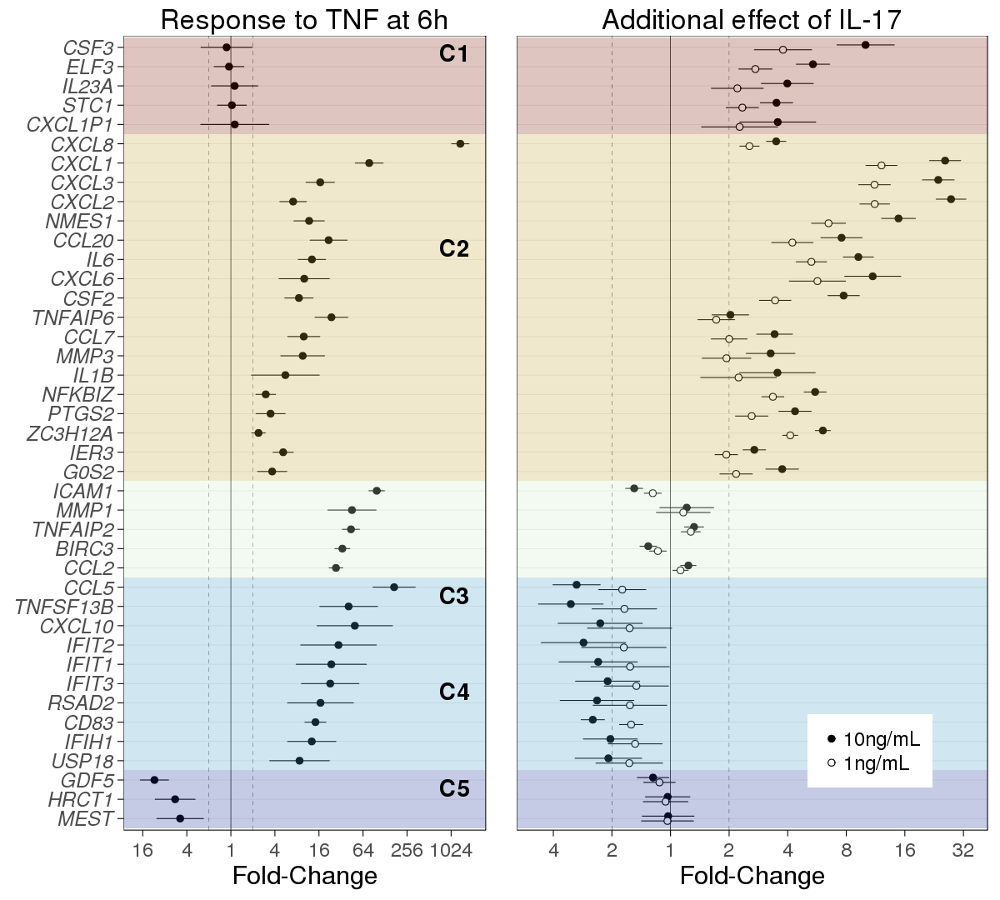

In [67]:
options(repr.plot.width = 10, repr.plot.height = 9)

dat_errorbar <- fit1_top %>%
filter(Coef %in% c("t6", "d1", "d10")) %>%
filter(ID %in% dat_cat$ID) %>%
dplyr::select(Coef, ID, logFC, CI.L, CI.R, adj.P.Val) %>%
reshape2::melt(id.vars = c("ID", "Coef")) %>%
reshape2::dcast(formula = ID + Coef ~ variable, value.var = "value")

dat_errorbar$ID <- factor(dat_errorbar$ID, rev(dat_cat$ID))

dat_errorbar$il17 <- substr(dat_errorbar$Coef, 1, 1) == "d"

cat_breaks <- c(
  (seq(nrow(dat_cat)) - 0.5)[!duplicated(rev(dat_cat$category))],
  nrow(dat_cat) + 0.5
)

p2 <- dat_errorbar %>%
filter(il17) %>%
ggplot() +
coord_flip() +
geom_hline(yintercept = 0, size = 0.2) +
geom_hline(yintercept = log2(c(1/2, 2)), size = 0.1, linetype = 2) +
geom_errorbar(
  mapping = aes(x = ID, ymin = CI.L, ymax = CI.R, group = Coef),
  size = 0.3,
  width = 0.01,
  position = position_dodge(width = 0.5)
) +
geom_point(
  mapping = aes(x = ID, y = logFC, group = Coef, shape = Coef),
  size = 2, fill = "white",
  position = position_dodge(width = 0.5)
) +
scale_shape_manual(
  name = NULL,
  values = c(21, 19),
  labels = c("1ng/mL", "10ng/mL"),
  guide = guide_legend(title = NULL, reverse = TRUE)
) +
scale_y_continuous(
  labels = function(x) 2^abs(x),
  breaks = scales::pretty_breaks(6)
) +
annotate(
  geom = "rect",
  fill = cat_colors[5], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[1], xmax = cat_breaks[2]
) +
annotate(
  geom = "rect",
  fill = cat_colors[4], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[2], xmax = cat_breaks[3]
) +
annotate(
  geom = "rect",
  fill = cat_colors[3], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[3], xmax = cat_breaks[4]
) +
annotate(
  geom = "rect",
  fill = cat_colors[2], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[4], xmax = cat_breaks[5]
) +
annotate(
  geom = "rect",
  fill = cat_colors[1], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[5], xmax = cat_breaks[6]
) +
theme(
  plot.title = element_text(size = 20),
  legend.title = element_blank(),
  panel.grid.major.y = element_line(size = 0.2, color = "grey90"),
  panel.spacing = unit(1, "lines"),
#   axis.text.y = element_text(face = "italic"),
  legend.position = c(0.75, 0.1),
  axis.text.y = element_blank(),
  axis.ticks.y = element_blank()
) +
labs(title = "Additional effect of IL-17", x = NULL, y = "Fold-Change")

p1 <- dat_errorbar %>%
filter(!il17) %>%
ggplot() +
coord_flip() +
geom_hline(yintercept = 0, size = 0.2) +
geom_hline(yintercept = log2(c(1/2, 2)), size = 0.1, linetype = 2) +
geom_errorbar(
  mapping = aes(x = ID, ymin = CI.L, ymax = CI.R),
  size = 0.3,
  width = 0.01
) +
geom_point(
  mapping = aes(x = ID, y = logFC),
  size = 2
) +
scale_y_continuous(
  labels = function(x) 2^abs(x),
  breaks = scales::pretty_breaks(6)
) +
annotate(
  geom = "rect",
  fill = cat_colors[5], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[1], xmax = cat_breaks[2]
) +
annotate(
  geom = "rect",
  fill = cat_colors[4], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[2], xmax = cat_breaks[3]
) +
annotate(
  geom = "rect",
  fill = cat_colors[3], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[3], xmax = cat_breaks[4]
) +
annotate(
  geom = "rect",
  fill = cat_colors[2], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[4], xmax = cat_breaks[5]
) +
annotate(
  geom = "rect",
  fill = cat_colors[1], alpha = cat_alpha,
  ymin = -Inf, ymax = Inf, xmin = cat_breaks[5], xmax = cat_breaks[6]
) +
annotate(
  geom = "text", color = "black", label = "C1",
  y = Inf, x = Inf, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C2",
  y = Inf, x = 31.5, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C3",
  y = Inf, x = 13.5, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C4",
  y = Inf, x = 8.5, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
annotate(
  geom = "text", color = "black", label = "C5",
  y = Inf, x = 3.5, hjust = 1.5, vjust = 1.5, size = 6, fontface = "bold"
) +
theme(
  plot.title = element_text(size = 20),
  panel.grid.major.y = element_line(size = 0.2, color = "grey90"),
  panel.spacing = unit(1, "lines"),
  axis.text.y = element_text(face = "italic")
#   axis.text.y = element_blank(),
#   axis.ticks.y = element_blank()
) +
labs(title = "Response to TNF at 6h", x = NULL, y = "Fold-Change")

show_plot(p1 + p2 + patchwork::plot_layout(widths = c(1, 1.3)))

In [175]:
x <- fit1_top %>%
filter(Coef == "t6" & ID %in% c("CXCL1", "CXCL2", "CXCL3", "CXCL6"))
x
2 ^ mean(x$logFC)

ID,logFC,CI.L,CI.R,AveExpr,t,P.Value,adj.P.Val,B,ensembl_id,Coef,signif
CXCL1,6.282407,5.639031,6.925783,10.332875,19.278267,2.521450e-44,4.556718e-41,89.714520,ENSG00000163739,t6,TRUE
CXCL3,4.057525,3.402231,4.712819,7.854291,12.224519,5.922814e-25,3.270545e-22,46.057269,ENSG00000163734,t6,TRUE
CXCL2,2.826282,2.212830,3.439734,6.596731,9.095816,2.705174e-16,6.296325e-14,26.481928,ENSG00000081041,t6,TRUE
CXCL6,3.332447,2.178115,4.486779,7.383618,5.699533,5.321992e-08,3.317202e-06,7.845186,ENSG00000124875,t6,TRUE


[1] 17.44407

In [178]:
x <- fit1_top %>%
filter(Coef == "d1" & ID %in% c("CXCL1", "CXCL2", "CXCL3", "CXCL6", "CXCL8"))
x
2 ^ mean(x$logFC)

ID,logFC,CI.L,CI.R,AveExpr,t,P.Value,adj.P.Val,B,ensembl_id,Coef,signif
CXCL2,3.485844,3.228143,3.743546,6.596731,26.70533,3.628661e-62,3.606708e-58,123.58500,ENSG00000081041,d1,TRUE
CXCL1,3.601878,3.331606,3.872150,10.332875,26.31084,2.710620e-61,1.796147e-57,121.83297,ENSG00000163739,d1,TRUE
CXCL3,3.482510,3.207231,3.757788,7.854291,24.97622,2.805127e-58,1.394078e-54,115.74323,ENSG00000163734,d1,TRUE
CXCL8,1.346946,1.176641,1.517251,11.640893,15.61457,1.813986e-34,4.507528e-31,65.81016,ENSG00000169429,d1,TRUE
CXCL6,2.508165,2.023249,2.993082,7.383618,10.21165,2.512932e-19,3.568184e-16,32.89548,ENSG00000124875,d1,TRUE


[1] 7.38741

In [179]:
x <- fit1_top %>%
filter(Coef == "d10" & ID %in% c("CXCL1", "CXCL2", "CXCL3", "CXCL6", "CXCL8"))
x
2 ^ mean(x$logFC)

ID,logFC,CI.L,CI.R,AveExpr,t,P.Value,adj.P.Val,B,ensembl_id,Coef,signif
CXCL2,4.788734,4.531033,5.046435,6.596731,36.68688,7.872780e-82,7.825149e-78,170.66374,ENSG00000081041,d10,TRUE
CXCL1,4.687508,4.417236,4.957780,10.332875,34.24111,2.070240e-77,1.371810e-73,161.38072,ENSG00000163739,d10,TRUE
CXCL3,4.570397,4.295119,4.845676,7.854291,32.77844,1.187255e-74,5.900361e-71,155.53648,ENSG00000163734,d10,TRUE
CXCL8,1.803859,1.633555,1.974164,11.640893,20.91138,1.666859e-48,3.681721e-45,98.65467,ENSG00000169429,d10,TRUE
CXCL6,3.451530,2.966613,3.936446,7.383618,14.05243,4.156087e-30,5.507924e-27,57.57833,ENSG00000124875,d10,TRUE


[1] 14.52439

In [205]:
# meta$GDF5 <- as.numeric(log2tpm["ENSG00000125965",])

# meta %>% group_by(TimeFactor, Stimulation) %>%
# summarise(GDF5 = mean(GDF5))

In [303]:
x <- fit1_top %>%
filter(Coef == "t6" & ID %in% c("GDF5", "MEST", "HRCT1")) %>%
select(ID, logFC, CI.L, CI.R, AveExpr, P.Value, adj.P.Val, ensembl_id, Coef) %>%
mutate(FC = 2^logFC, FC.L = 2^CI.L, FC.R = 2^CI.R) %>%
mutate_if(is.numeric, function(x) signif(x, 2))
x
2 ^ mean(x$logFC)

ID,logFC,CI.L,CI.R,AveExpr,P.Value,adj.P.Val,ensembl_id,Coef,FC,FC.L,FC.R
GDF5,-3.5,-4.1,-2.8,1.3,3.5e-20,1.3e-17,ENSG00000125965,t6,0.09,0.058,0.14
HRCT1,-2.5,-3.4,-1.6,1.2,1.7e-07,9.5e-06,ENSG00000196196,t6,0.17,0.092,0.33
MEST,-2.3,-3.4,-1.2,2.4,3.3e-05,1.0e-03,ENSG00000106484,t6,0.20,0.097,0.42


[1] 0.1469435

In [246]:
x <- fit1_top %>%
filter(Coef %in% c("d1", "d10") & ID %in% c("ELF3", "NFKBIZ")) %>%
select(ID, logFC, CI.L, CI.R, AveExpr, P.Value, adj.P.Val, ensembl_id, Coef) %>%
mutate(FC = 2^abs(logFC), FC.L = 2^abs(CI.L), FC.R = 2^abs(CI.R))
x
2 ^ mean(x$logFC)

ID,logFC,CI.L,CI.R,AveExpr,P.Value,adj.P.Val,ensembl_id,Coef,FC,FC.L,FC.R
NFKBIZ,1.747525,1.555192,1.939859,5.619721,8.618144e-41,2.447430e-37,ENSG00000144802,d1,3.357821,2.938728,3.836680
ELF3,1.448236,1.160043,1.736428,2.233696,1.577793e-18,2.090996e-15,ENSG00000163435,d1,2.728742,2.234641,3.332092
NFKBIZ,2.468564,2.276230,2.660897,5.619721,4.151891e-59,1.375591e-55,ENSG00000144802,d10,5.534924,4.844105,6.324261
ELF3,2.431524,2.143332,2.719717,2.233696,2.471772e-37,4.913635e-34,ENSG00000163435,d10,5.394632,4.417812,6.587436


[1] 4.066992

### Gene set enrichment

In [68]:
load("data/gene_sets.rda")

In [69]:
des1 <- clean_cols(with(
  meta,
  model.matrix(~ TimeFactor + DoseFactor)
))
head(des1)

,Intercept,t2,t4,t6,t8,t10,t12,t18,t24,d1,d10
1,1,1,0,0,0,0,0,0,0,0,0
2,1,1,0,0,0,0,0,0,0,1,0
3,1,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,0,1,0,0,0,0,0
5,1,0,0,0,0,1,0,0,0,0,0
6,1,0,0,0,0,1,0,0,0,0,0


In [70]:
hmark <- rbindlist(parallel::mclapply(
  mc.cores = 10,
  X = colnames(des1),
  FUN = function(contrast) {
    retval <- limma::camera(
      y        = log2tpm_batch,
      design   = des1,
      contrast = which(colnames(des1) == contrast),
      index    = ids2indices(
        gene.sets    = MSIGDB_H_ENSEMBL,
        identifiers  = rownames(log2tpm_batch),
        remove.empty = TRUE
      )
    )
    retval$contrast <- contrast
    retval$set      <- rownames(retval)
    retval$log10p   <- -log10(retval$PValue) * ifelse(retval$Direction == "Up", 1, -1)
    return(retval[order(rownames(retval)),])
  }
))

head(hmark)

hmark %>%
group_by(contrast) %>%
summarise(n = sum(PValue < 0.005 / nrow(hmark)))

NGenes,Direction,PValue,FDR,contrast,set,log10p
195,Up,1.775126e-14,9.861809e-14,Intercept,HALLMARK_ADIPOGENESIS,13.750771
158,Up,2.207288e-01,2.508282e-01,Intercept,HALLMARK_ALLOGRAFT_REJECTION,0.656141
95,Up,1.181511e-07,3.109239e-07,Intercept,HALLMARK_ANDROGEN_RESPONSE,6.927562
31,Up,2.425962e-03,3.912843e-03,Intercept,HALLMARK_ANGIOGENESIS,2.615116
178,Up,5.654234e-03,8.567022e-03,Intercept,HALLMARK_APICAL_JUNCTION,2.247626
35,Up,4.320272e-01,4.695947e-01,Intercept,HALLMARK_APICAL_SURFACE,0.364489


contrast,n
d1,6
d10,6
Intercept,24
t10,13
t12,12
t18,11
t2,14
t24,9
t4,14
t6,12


[1] 4.477121

NGenes,Direction,PValue,FDR,contrast,set,log10p,signif
158,Up,2.233838e-19,1.861532e-18,t6,HALLMARK_ALLOGRAFT_REJECTION,18.6509483,TRUE
149,Up,1.863523e-12,1.035290e-11,t6,HALLMARK_APOPTOSIS,11.7296653,TRUE
72,Up,2.420278e-01,3.781685e-01,t6,HALLMARK_CHOLESTEROL_HOMEOSTASIS,0.6161347,FALSE
171,Up,6.308206e-12,3.154103e-11,t6,HALLMARK_COMPLEMENT,11.2000941,TRUE
200,Down,1.610241e-12,1.006401e-11,t6,HALLMARK_E2F_TARGETS,-11.7931091,TRUE
198,Up,2.373385e-05,9.128403e-05,t6,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,4.6246318,TRUE


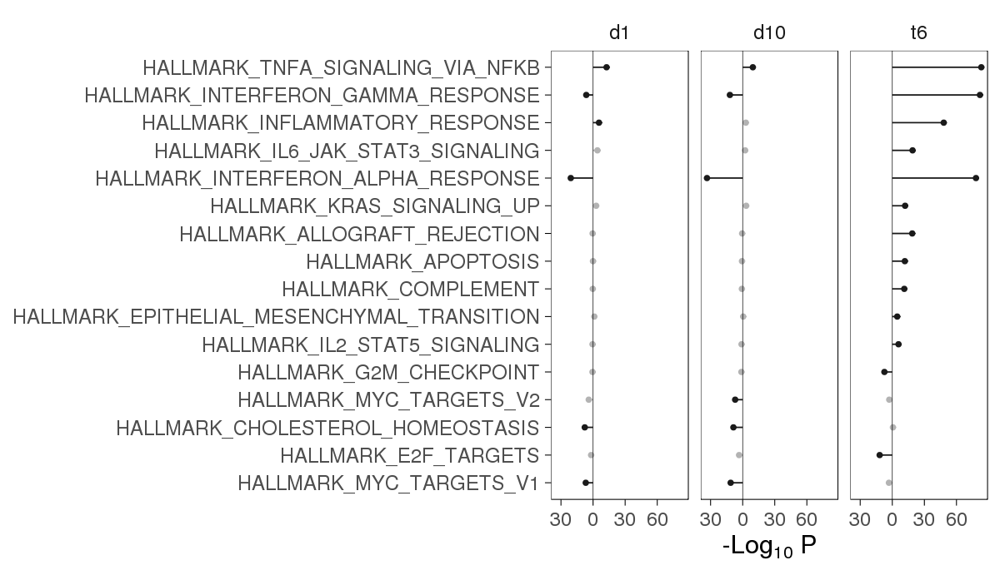

In [71]:
hmark_dat <- subset(hmark, contrast %in% c("t6", "d1", "d10"))

hmark_dat_bonf <- -log10(0.005 / nrow(hmark_dat))
hmark_dat_bonf

hmark_dat <- hmark_dat %>%
group_by(contrast) %>%
mutate(signif = abs(log10p) > hmark_dat_bonf) %>%
group_by(set) %>%
filter(sum(signif) >= 1)

options(repr.plot.width = 10, repr.plot.height = nrow(hmark_dat) * 0.12)

head(hmark_dat)

hmark_dat$set <- factor(hmark_dat$set)
hmark_dat$set <- reorder(hmark_dat$set, hmark_dat$log10p)

p <- ggplot(hmark_dat, aes(x = set, y = log10p, color = signif)) +
geom_point() +
geom_segment(mapping = aes(xend = set, yend = 0)) +
geom_hline(yintercept = 0, size = 0.2) +
scale_color_manual(values = c("TRUE" = "grey10", "FALSE" = "grey70")) +
scale_y_continuous(labels = abs) +
facet_wrap(~ contrast) +
coord_flip() +
labs(x = NULL, y = bquote("-Log"[10]~"P")) +
theme(legend.position = "none")

show_plot(p)

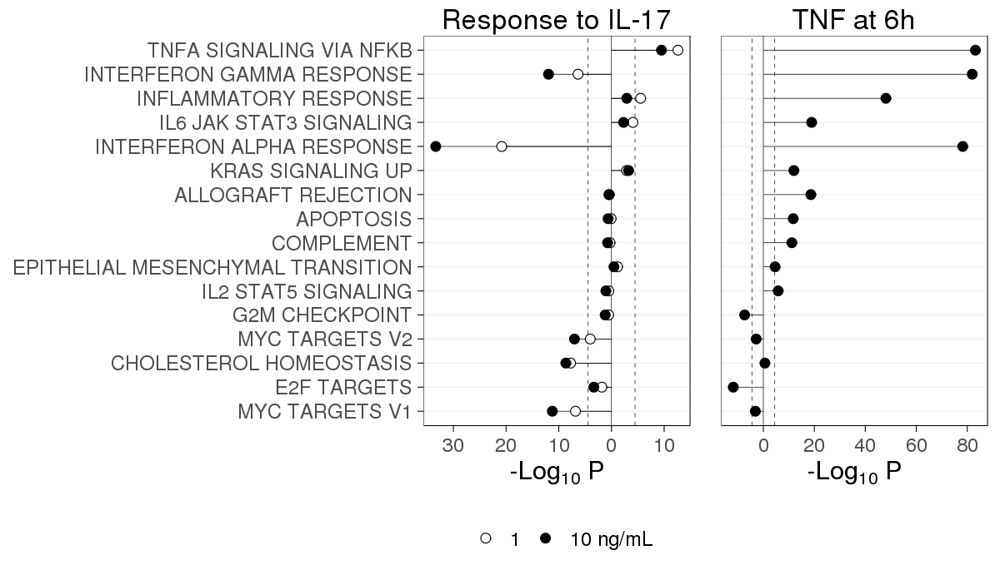

In [72]:
hmark_dat_dose <- hmark_dat %>%
filter(contrast %in% c("d1", "d10")) %>%
group_by(set) %>%
arrange(contrast) %>%
mutate(dose_diff = log10p[2] - log10p[1])

p1 <- hmark_dat_dose %>%
ggplot(aes(x = set, y = log10p, fill = contrast)) +
geom_hline(yintercept = 0, size = 0.2) +
geom_hline(
  yintercept = c(hmark_dat_bonf, -hmark_dat_bonf),
  size = 0.2,
  linetype = 2
) +
geom_segment(mapping = aes(xend = set, yend = 0), size = 0.2) +
geom_point(shape = 21, size = 3) +
scale_fill_manual(
  name = NULL,
  labels = c("d1" = "1", "d10" = "10 ng/mL"),
  values = c("d1" = "white", "d10" = "black")
) +
# scale_color_manual(values = c("TRUE" = "grey10", "FALSE" = "grey70")) +
scale_y_continuous(labels = abs) +
scale_x_discrete(
  labels = function(x) {
    str_replace_all(substr(x, 10, 100), "_", " ")
  }
) +
coord_flip() +
labs(title = "Response to IL-17", x = NULL, y = bquote("-Log"[10]~"P")) +
theme(
  plot.title = element_text(size = 20),
  legend.position = "bottom",
  panel.grid.major.y = element_line(size = 0.2, color = "grey90"),
  panel.spacing = unit(1, "lines")
)

p2 <- hmark_dat %>%
filter(contrast == "t6") %>%
ggplot(aes(x = set, y = log10p)) + #, color = signif)) +
geom_point(size = 3) +
geom_segment(mapping = aes(xend = set, yend = 0), size = 0.2) +
geom_hline(yintercept = 0, size = 0.2) +
geom_hline(
  yintercept = c(hmark_dat_bonf, -hmark_dat_bonf),
  size = 0.2,
  linetype = 2
) +
#scale_color_manual(values = c("TRUE" = "grey10", "FALSE" = "grey70")) +
scale_y_continuous(labels = abs) +
#facet_wrap(~ contrast) +
coord_flip() +
labs(title = "TNF at 6h", x = NULL, y = bquote("-Log"[10]~"P")) +
theme(
  plot.title = element_text(size = 20),
  legend.position = "none",
  axis.text.y = element_blank(),
  axis.ticks.y = element_blank(),
  panel.grid.major.y = element_line(size = 0.2, color = "grey90")
)

show_plot(p1 + p2)

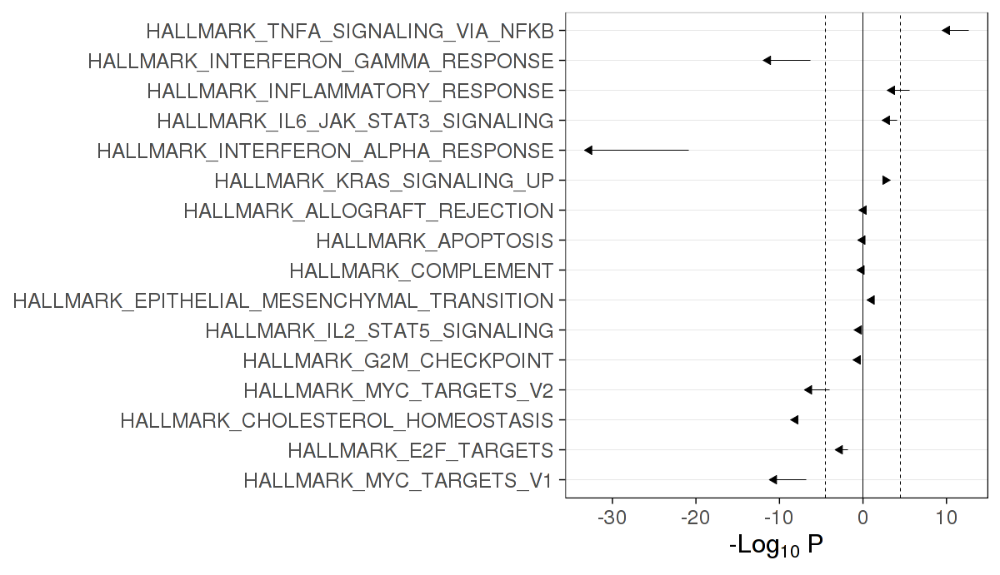

In [73]:
hmark_dat_dose %>% 
dplyr::select(Direction, PValue, contrast, set) %>%
mutate(pval = ifelse(Direction == "Down", -1, 1) * -log10(PValue)) %>%
dplyr::select(pval, contrast, set) %>%
tidyr::spread("contrast", "pval", "set") %>%
mutate(d1 = as.numeric(d1), d10 = as.numeric(d10)) %>%
ggplot(aes(x = set, xend = set, y = d1, yend = d10)) +
geom_segment(arrow = arrow(length = unit(0.02, "npc"), type = "closed"), size = 0.2) +
coord_flip() +
geom_hline(yintercept = 0, size = 0.2) +
geom_hline(
  yintercept = c(hmark_dat_bonf, -hmark_dat_bonf),
  size = 0.2,
  linetype = 2
) +
labs(x = NULL, y = bquote("-Log"[10]~"P")) +
theme(
  legend.position = "none",
  panel.grid.major.y = element_line(size = 0.2, color = "grey90"),
  panel.spacing = unit(1, "lines")
)

[1] 97

[1] 96

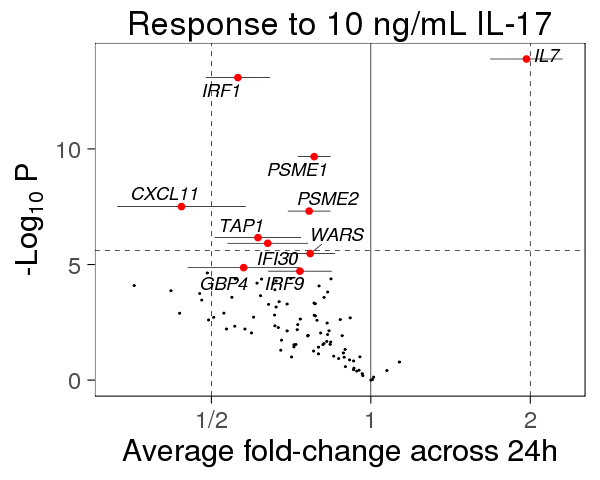

In [74]:
ifa_genes <- gene_symbols[MSIGDB_H_ENSEMBL[["HALLMARK_INTERFERON_ALPHA_RESPONSE"]]]
length(ifa_genes)

ifa_dat <- subset(fit1_top, ID %in% ifa_genes) %>%
filter(Coef %in% c("d10")) %>%
arrange(P.Value) %>% head(1000)
nrow(ifa_dat)

options(repr.plot.width = 5, repr.plot.height = 4)

p <- ggplot(ifa_dat, aes(logFC, -log10(P.Value), label = ID)) +
geom_vline(
  xintercept = 0, size = 0.2
) +
geom_errorbarh(
  data = head(ifa_dat, 10),
  mapping = aes(xmin = CI.L, xmax = CI.R),
  size = 0.2,
  height = 0
) +
geom_hline(
  yintercept = -log10(0.05 / length(unique(fit1_top$ID))),
  linetype = 2, size = 0.2
) +
geom_vline(
  xintercept = log2(c(1/2, 2)), linetype = 2, size = 0.2
) +
geom_text_repel(
  data = head(ifa_dat, 10), segment.size = 0.2,
  fontface = "italic"
) +
geom_point(size = 0.2) +
geom_point(data = head(ifa_dat, 10), color = "red") +
scale_x_continuous(labels = function(x) fractional::fractional(2^x)) +
labs(
  x = "Average fold-change across 24h",
  y = bquote("-Log"[10]~"P"),
  title = "Response to 10 ng/mL IL-17"
) +
theme(
  plot.title = element_text(size = 20)
)
show_plot(p)

In [75]:
source("R/002_helper_functions.R")

[1] 10

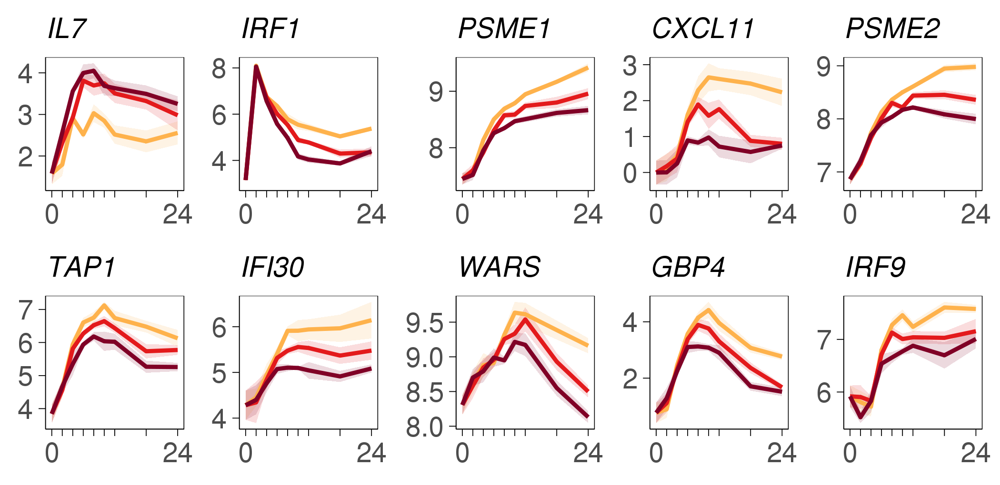

In [76]:
these_genes <- (subset(fit1_top, ID %in% ifa_genes) %>%
filter(Coef %in% c("d10")) %>%
arrange(P.Value) %>% head(10) %>%
# filter(Coef %in% c("d1", "d10", "t6")) %>%
# arrange(d10) %>% head %>%
# group_by(ID) %>%
# filter(sum(signif) > 0) %>%
# filter(all(adj.P.Val < 0.05)) %>%
dplyr::select(ID) %>%
unique)[[1]]

length(these_genes)

plot_these_genes(these_genes, res = 300)

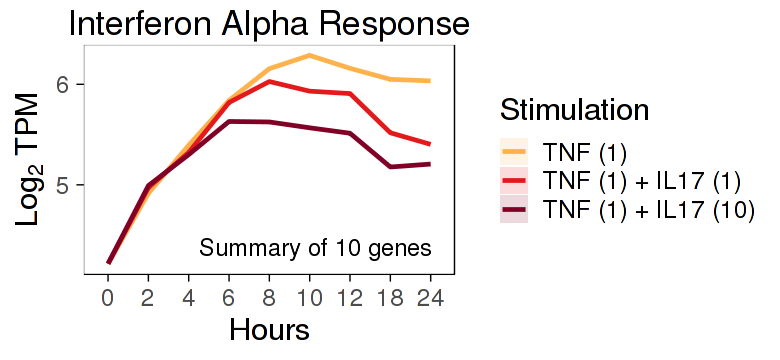

In [77]:
options(repr.plot.width = 6.5, repr.plot.height = 3)

plot_geneset_by_stimulation(
  geneset = these_genes,#[!these_genes %in% c("IL7")],
  meta = meta,
  log2tpm = log2tpm_batch,
  ci = 0.01
) +
labs(title = "Interferon Alpha Response") +
theme(plot.title = element_text(size = 20))

**C3** motif gene sets based on conserved cis-regulatory motifs from a comparative analysis of the human, mouse, rate and dog genomes.

In [78]:
c3 <- rbindlist(parallel::mclapply(
  mc.cores = 10,
  X = colnames(des1),
  FUN = function(contrast) {
    retval <- limma::camera(
      y        = log2tpm_batch,
      design   = des1,
      contrast = which(colnames(des1) == contrast),
      index    = ids2indices(
        gene.sets    = MSIGDB_C3_ENSEMBL,
        identifiers  = rownames(log2tpm_batch),
        remove.empty = TRUE
      )
    )
    retval$contrast <- contrast
    retval$set      <- rownames(retval)
    retval$log10p   <- -log10(retval$PValue) * ifelse(retval$Direction == "Up", 1, -1)
    return(retval[order(rownames(retval)),])
  }
))

head(c3)

c3 %>%
group_by(contrast) %>%
summarise(n = sum(PValue < 0.005 / nrow(c3)))

NGenes,Direction,PValue,FDR,contrast,set,log10p
102,Up,1.360505e-03,0.0046494930,Intercept,"AAACCAC,MIR-140",2.866300
112,Up,9.057134e-03,0.0204366095,Intercept,"AAAGGAT,MIR-501",2.043009
163,Up,8.471481e-02,0.1274342379,Intercept,AAANWWTGC_UNKNOWN,1.072041
134,Up,5.354079e-05,0.0003624299,Intercept,"AACATTC,MIR-409-3P",4.271315
12,Up,1.101165e-02,0.0233622854,Intercept,"AACGGTT,MIR-451",1.958148
90,Up,5.783730e-03,0.0145419487,Intercept,"AACTGAC,MIR-223",2.237792


contrast,n
d1,0
d10,0
Intercept,20
t10,3
t12,3
t18,3
t2,2
t24,3
t4,3
t6,3


[1] 5.324694

NGenes,Direction,PValue,FDR,contrast,set,log10p,signif
120,Up,6.899405e-15,2.428590e-12,t6,GGGNNTTTCC_V$NFKB_Q6_01,14.1611884,TRUE
171,Up,3.317624e-14,5.839018e-12,t6,STTTCRNTTT_V$IRF_Q6,13.4791729,TRUE
20,Up,4.264151e-08,5.003270e-06,t6,V$STAT3_01,7.3701675,TRUE
120,Down,7.907275e-02,8.020086e-01,d1,GGGNNTTTCC_V$NFKB_Q6_01,-1.1019732,FALSE
171,Down,4.510184e-03,7.937923e-01,d1,STTTCRNTTT_V$IRF_Q6,-2.3458058,FALSE
20,Down,3.321129e-01,8.628727e-01,d1,V$STAT3_01,-0.4787143,FALSE


[1] 3

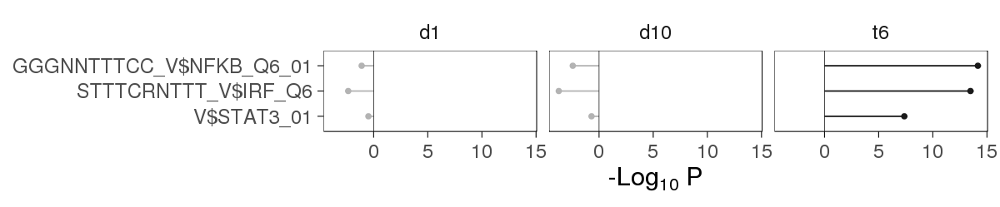

In [79]:
c3_dat <- subset(c3, contrast %in% c("t6", "d1", "d10"))

c3_dat_bonf <- -log10(0.005 / nrow(c3_dat))
c3_dat_bonf

c3_dat <- c3_dat %>%
group_by(contrast) %>%
mutate(signif = abs(log10p) > c3_dat_bonf) %>%
group_by(set) %>%
filter(sum(signif) >= 1)

options(repr.plot.width = 10, repr.plot.height = 1 + nrow(c3_dat) * 0.12)

head(c3_dat)
length(unique(c3_dat$set))

c3_dat$set <- factor(c3_dat$set)
c3_dat$set <- reorder(c3_dat$set, c3_dat$log10p)

p <- ggplot(c3_dat, aes(x = set, y = log10p, color = signif)) +
geom_point() +
geom_segment(mapping = aes(xend = set, yend = 0)) +
geom_hline(yintercept = 0, size = 0.2) +
scale_color_manual(values = c("TRUE" = "grey10", "FALSE" = "grey70")) +
scale_y_continuous(labels = abs) +
scale_x_discrete(labels = function(x) substr(x, 1, 30)) +
facet_wrap(~ contrast) +
coord_flip() +
labs(x = NULL, y = bquote("-Log"[10]~"P")) +
theme(legend.position = "none")

show_plot(p)

[1] 200

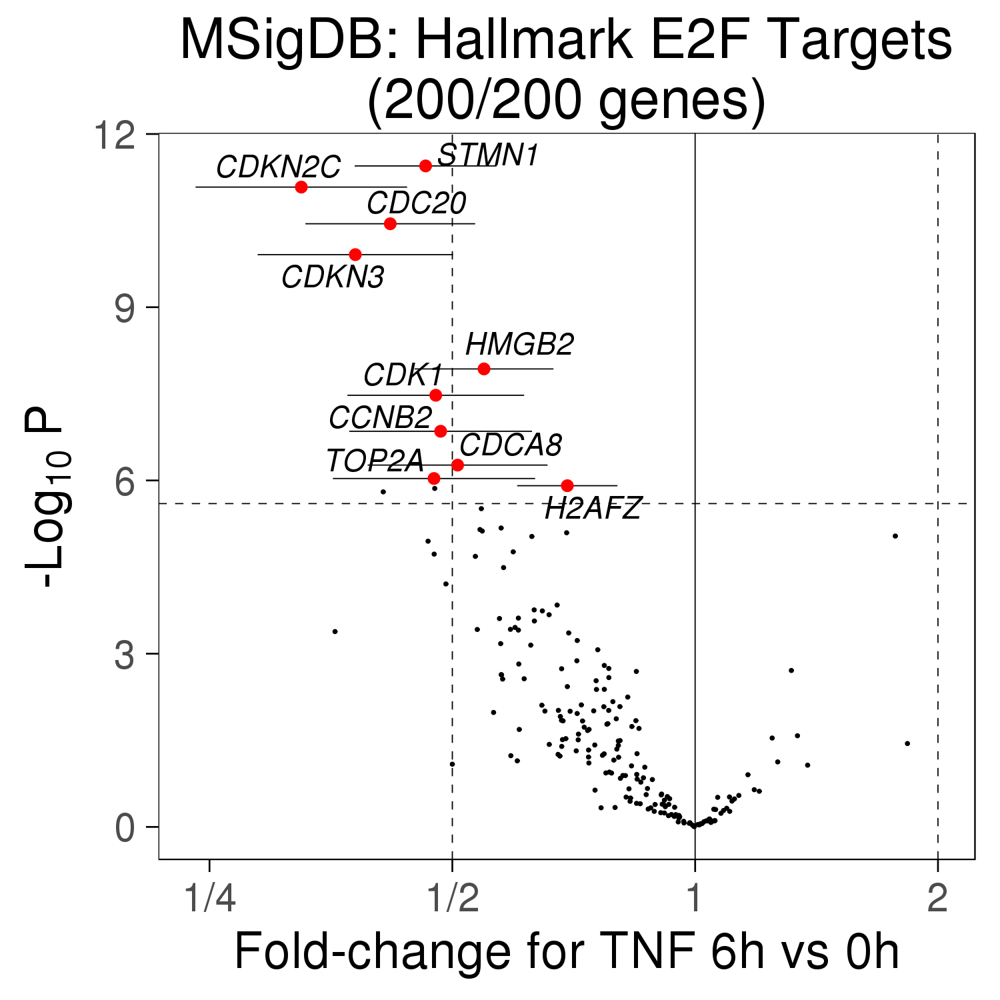

In [244]:
ifa_genes <- gene_symbols[MSIGDB_H_ENSEMBL[["HALLMARK_E2F_TARGETS"]]]
length(ifa_genes)

ifa_dat <- subset(fit1_top, ID %in% ifa_genes) %>%
filter(Coef %in% c("t6")) %>%
arrange(P.Value) %>%
head(1000) %>%
mutate(repel = ifelse(row_number(P.Value) <= 10, ID, ""))

options(repr.plot.width = 5, repr.plot.height = 5)

p <- ggplot(ifa_dat, aes(logFC, -log10(P.Value), label = repel)) +
geom_vline(
  xintercept = 0, size = 0.2
) +
geom_errorbarh(
  data = head(ifa_dat, 10),
  mapping = aes(xmin = CI.L, xmax = CI.R),
  size = 0.2,
  height = 0
) +
geom_hline(
  yintercept = -log10(0.05 / length(unique(fit1_top$ID))),
  linetype = 2, size = 0.2
) +
geom_vline(
  xintercept = log2(c(1/2, 2)), linetype = 2, size = 0.2
) +
geom_text_repel(
  # data = head(ifa_dat, 10),
  segment.size = 0.2,
  fontface = "italic"
) +
geom_point(size = 0.2) +
geom_point(data = head(ifa_dat, 10), color = "red") +
scale_x_continuous(labels = function(x) fractional::fractional(2^x)) +
labs(
  x = "Fold-change for TNF 6h vs 0h",
  y = bquote("-Log"[10]~"P"),
  # caption = "Response to TNF at 6h",
  title = sprintf("MSigDB: Hallmark E2F Targets\n(%s/%s genes)", comma(nrow(ifa_dat)), comma(length(ifa_genes)))
) +
theme(
  plot.title = element_text(size = 20)
)
show_plot(p, res = 300)

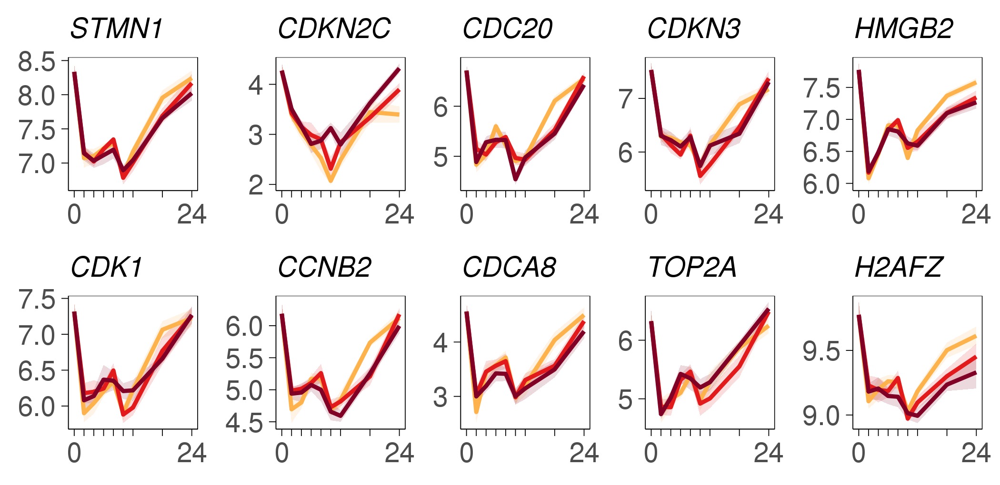

In [245]:
x <- unique(ifa_dat$repel)
x <- x[nchar(x) > 1]

plot_these_genes(x, res = 300)

In [210]:
library(scales)

[1] 161

[1] 149

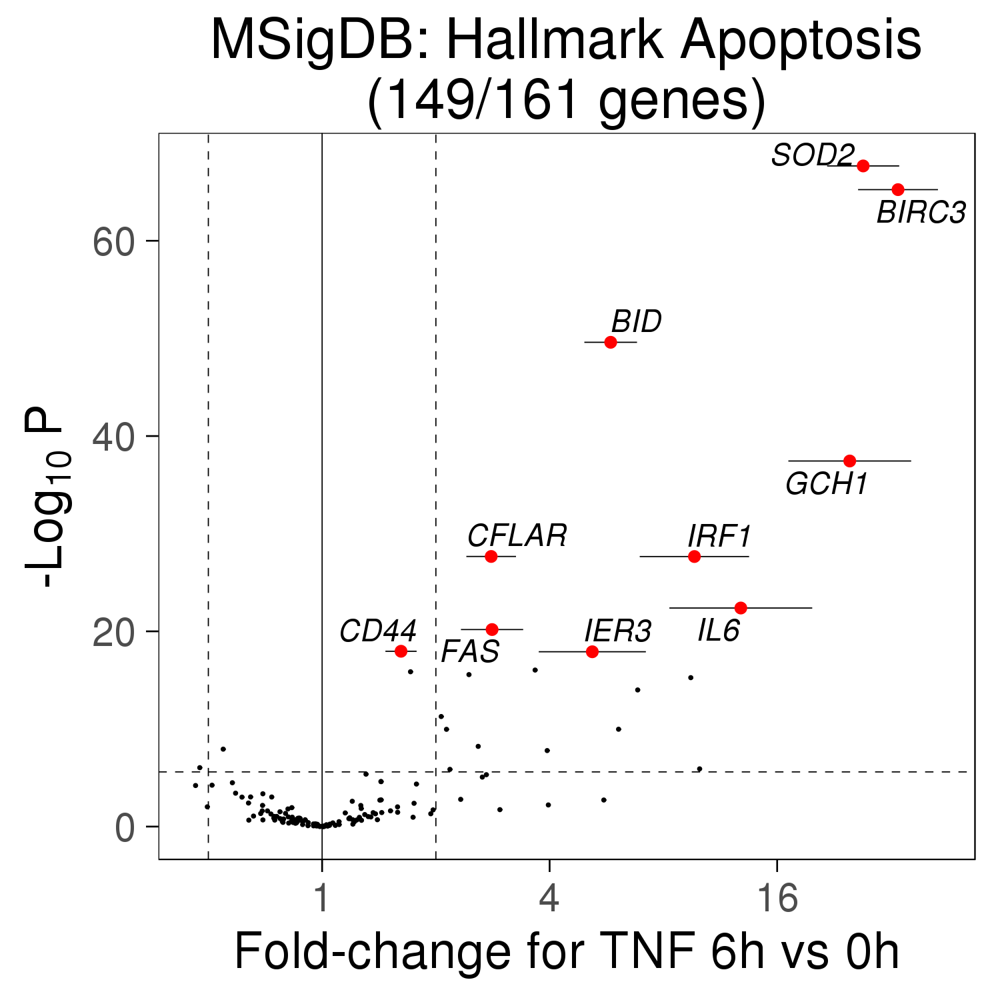

In [242]:
ifa_genes <- gene_symbols[MSIGDB_H_ENSEMBL[["HALLMARK_APOPTOSIS"]]]
length(ifa_genes)

ifa_dat <- subset(fit1_top, ID %in% ifa_genes) %>%
filter(Coef %in% c("t6")) %>%
arrange(P.Value) %>%
head(1000) %>%
mutate(repel = ifelse(row_number(P.Value) <= 10, ID, ""))

nrow(ifa_dat)

options(repr.plot.width = 5, repr.plot.height = 5)

p <- ggplot(ifa_dat, aes(logFC, -log10(P.Value), label = repel)) +
geom_vline(
  xintercept = 0, size = 0.2
) +
geom_errorbarh(
  data = head(ifa_dat, 10),
  mapping = aes(xmin = CI.L, xmax = CI.R),
  size = 0.2,
  height = 0
) +
geom_hline(
  yintercept = -log10(0.05 / length(unique(fit1_top$ID))),
  linetype = 2, size = 0.2
) +
geom_vline(
  xintercept = log2(c(1/2, 2)), linetype = 2, size = 0.2
) +
geom_text_repel(
  # data = head(ifa_dat, 10),
  segment.size = 0.2,
  fontface = "italic"
) +
geom_point(size = 0.2) +
geom_point(data = head(ifa_dat, 10), color = "red") +
scale_x_continuous(labels = function(x) fractional::fractional(2^x)) +
labs(
  x = "Fold-change for TNF 6h vs 0h",
  y = bquote("-Log"[10]~"P"),
#   title = "Response to TNF at 6h",
  title = sprintf("MSigDB: Hallmark Apoptosis\n(%s/%s genes)", comma(nrow(ifa_dat)), comma(length(ifa_genes)))
) +
theme(
  plot.title = element_text(size = 20)
)
show_plot(p, res = 300)

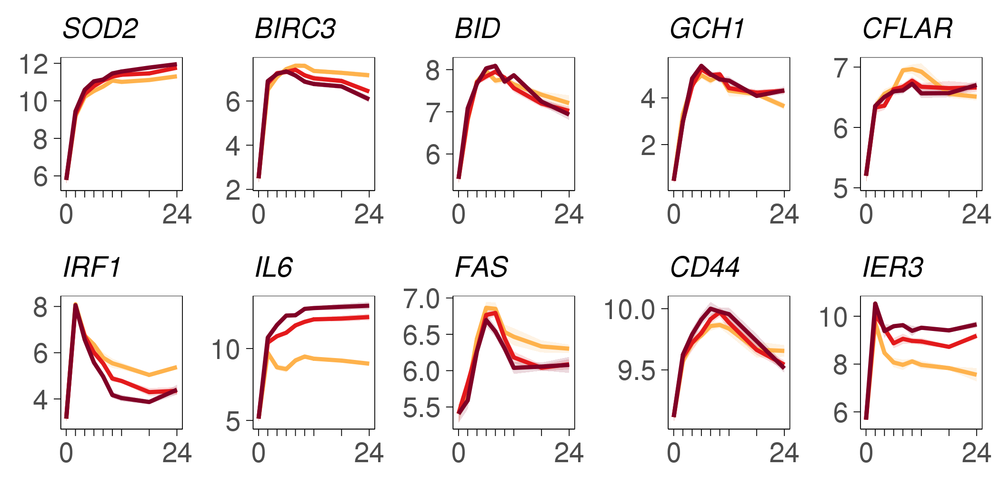

In [230]:
x <- unique(ifa_dat$repel)
x <- x[nchar(x) > 1]

plot_these_genes(x, res = 300)

In [82]:
cat(head(ifa_dat, 10)$ID)

SOD2 BIRC3 BID GCH1 CFLAR IRF1 IL6 FAS CD44 IER3

In [83]:
celseq_genes <- c("C3", "FGF7", "IGF1", "IGFBP4", "RASD1", "CRTAC1", "ITGB8", 
"NDP", "RERG", "SOX5", "AKR1C2", "DHRS3", "GALNT15", "SLC43A3", "BTG2",
                 "C11orf96", "FOS", "HAS1", "NR4A1")

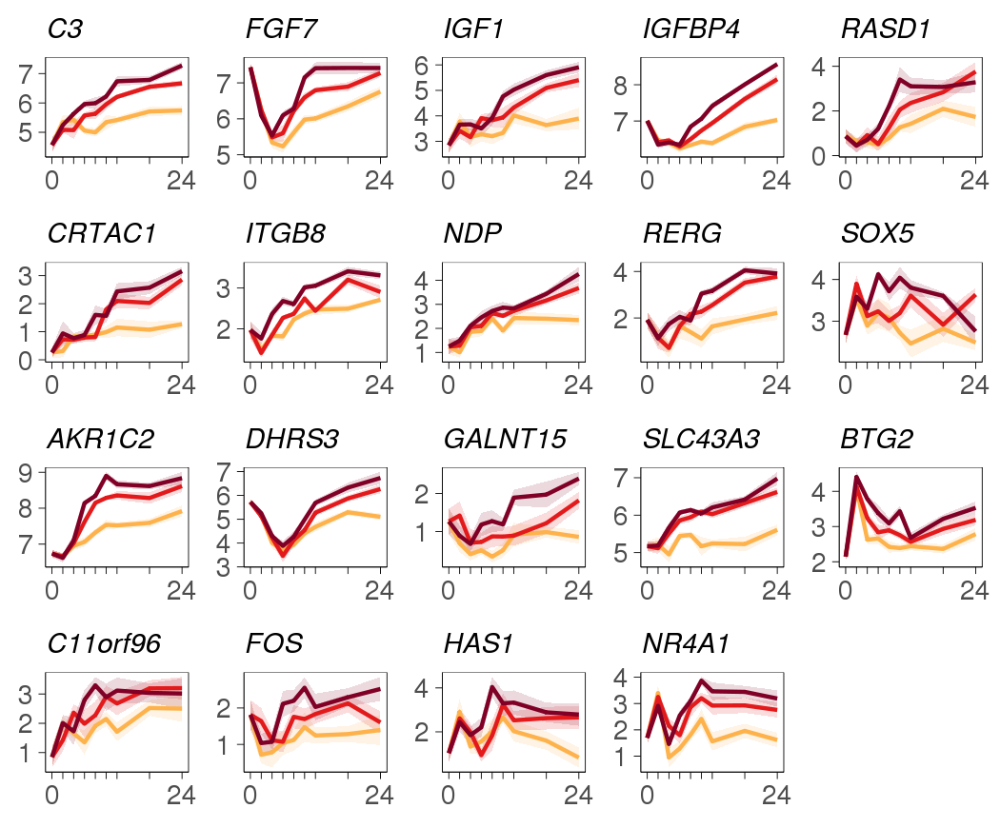

In [84]:
plot_these_genes(these_genes = celseq_genes)

[1] 13

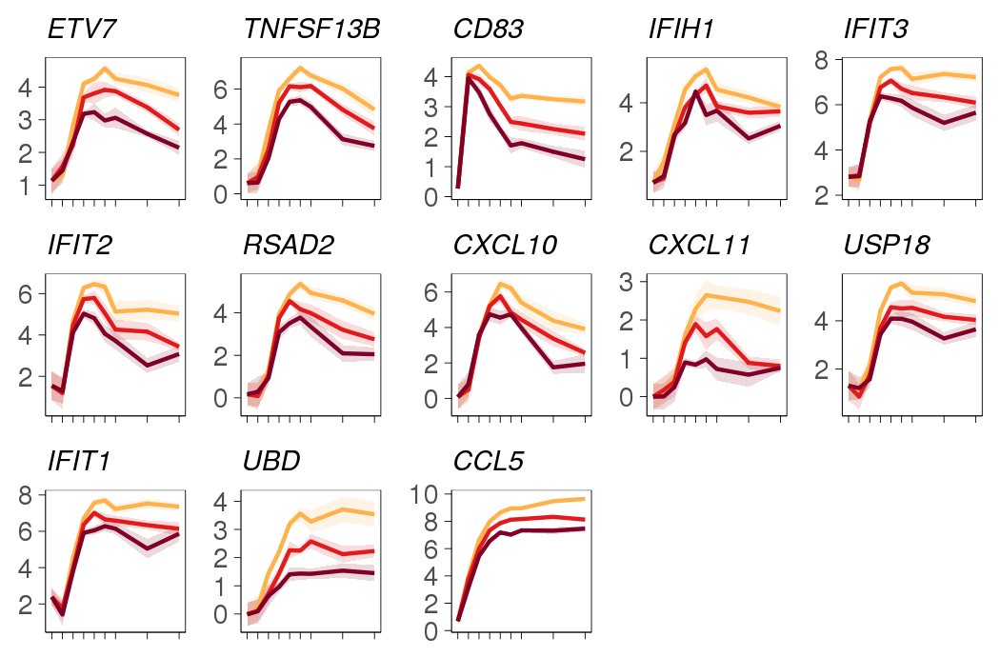

In [602]:
these_genes <- cats$C4

length(these_genes)

plot_these_genes(these_genes)

# Figure 1 PCA

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
Standard deviation,5.499913,4.471525,3.209498,2.792584,2.237087,1.547427,1.440775,1.365577,1.316793,1.26128
Proportion of Variance,0.185260,0.122460,0.063090,0.047760,0.030650,0.014670,0.012710,0.011420,0.010620,0.00974
Cumulative Proportion,0.185260,0.307720,0.370810,0.418570,0.449220,0.463880,0.476600,0.488020,0.498640,0.50838


term,df,sumsq,meansq,statistic,p.value,pc
Time,1,0.7384992,0.7384992,468.79734,3.209256e-50,1
Stimulation,2,0.5741914,0.2870957,111.24903,2.571514e-31,3
Dose,1,0.4099231,0.4099231,115.31927,9.260814e-21,3
Stimulation,2,0.2118772,0.1059386,22.17912,2.944383e-09,2
Dose,1,0.1528452,0.1528452,29.95001,1.609543e-07,2
Time,1,0.1007486,0.1007486,18.59798,2.761337e-05,2


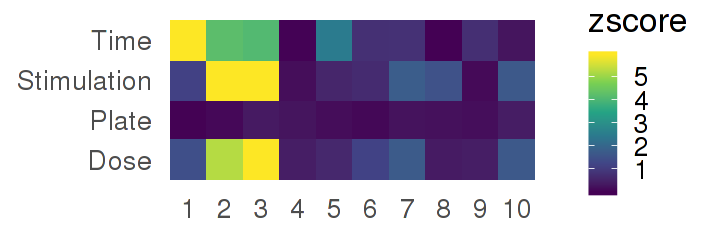

In [97]:
ix_pca <- meta$Stimulation != "None"

ix_cat <- ens_to_cat[which(ens_to_cat != 0)] %>% names()

# x <- data.frame(
#   mean = rowMeans(log2tpm_batch[ix_cat,ix_pca]),
#   sd = matrixStats::rowSds(log2tpm_batch[ix_cat,ix_pca])
# )
# head(x)
# options(repr.plot.width = 3, repr.plot.height = 3)
# smoothScatter(x$mean, x$sd)

pca <- summary(prcomp(x = scale_rows(log2tpm_batch[ix_cat, ix_pca])))
pca$importance[,1:10]
pca_dat <- cbind(meta[ix_pca,], as.data.frame(pca$rotation[,1:10]))

# ANOVA

cols <- c("Plate", "Stimulation", "Time", "Dose")

a <- rbindlist(lapply(cols, function(col) {
  rbindlist(lapply(1:10, function(pc) {
    a <- anova(aov(formula = as.formula(sprintf("PC%s ~ %s", pc, col)), data = pca_dat))
    a <- broom::tidy(a)
    a$pc <- pc
    a
  }))
}))
a <- a[!is.na(a$p.value),]
a$pc <- factor(a$pc)
a %>% arrange(p.value) %>% head

a$log10p <- -log10(a$p.value)
a$zscore <- qnorm(1 - (a$p.value / 2))
a$zscore[!is.finite(a$zscore)] <- max(a$zscore[is.finite(a$zscore)])

options(repr.plot.width = 6, repr.plot.height = 2)

ggplot(a, aes(x = pc, y = term, fill = zscore)) +
geom_tile() +
scale_fill_viridis_c() +
theme_minimal(base_size = 20) +
theme(panel.grid = element_blank()) +
labs(x = NULL, y = NULL)

In [98]:
length(ix_cat)

[1] 828

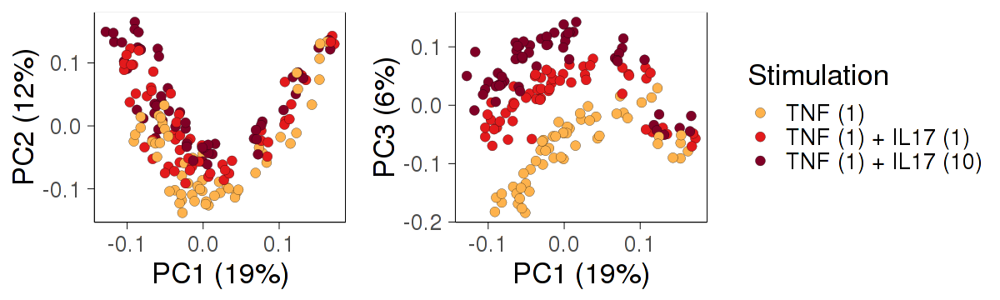

In [99]:
options(repr.plot.width = 10, repr.plot.height = 3)

plot_pca <- function(x = "PC1", y = "PC2", fill = "Stimulation") {
  ggplot(pca_dat, aes_string(x = x, y = y, fill = fill)) +
  geom_point(shape = 21, size = 3, stroke = 0.1) +
  scale_fill_manual(values = meta_colors[[fill]]) +
  theme_clean(base_size = 20) +
  labs(
    x = sprintf("%s (%.0f%%)", x, 100 * pca$importance[2,x]),
    y = sprintf("%s (%.0f%%)", y, 100 * pca$importance[2,y])
  )
}

(plot_pca() + theme(legend.position = "none") )+ plot_pca("PC1", "PC3")

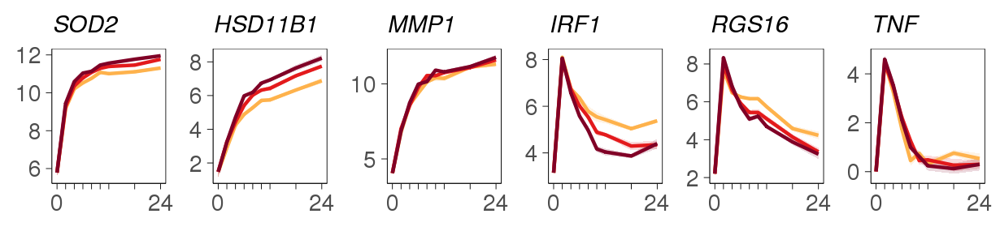

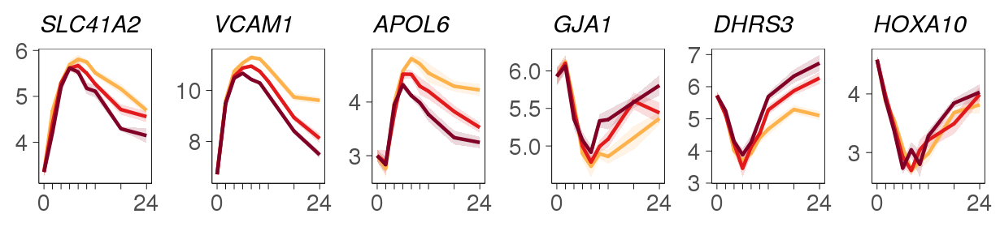

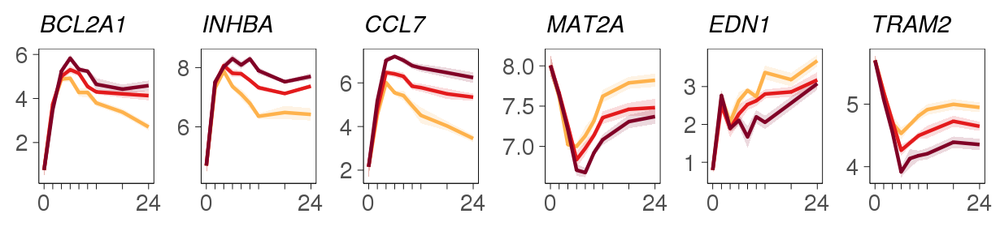

In [100]:
for (this_pc in c("PC1", "PC2", "PC3")) {

  x1 <- data.frame(ensembl_id = rownames(pca$x), pca$x, stringsAsFactors = FALSE) %>%
  mutate(gene = gene_symbols[ensembl_id], category = ens_to_cat[ensembl_id]) %>%
  select(ensembl_id, gene, category, PC1, PC2, PC3, PC4, PC5) %>%
  top_n(n = 3, wt = -!!as.symbol(this_pc))

  x2 <- data.frame(ensembl_id = rownames(pca$x), pca$x, stringsAsFactors = FALSE) %>%
  mutate(gene = gene_symbols[ensembl_id], category = ens_to_cat[ensembl_id]) %>%
  select(ensembl_id, gene, category, PC1, PC2, PC3, PC4, PC5) %>%
  top_n(n = 3, wt = !!as.symbol(this_pc))

  x <- rbind(x1, x2)
  x

  if (this_pc == "PC3") {
    x <- x[rev(seq(nrow(x))),]
  }
  plot_these_genes(x$gene, ncol = 6, title = this_pc)
}

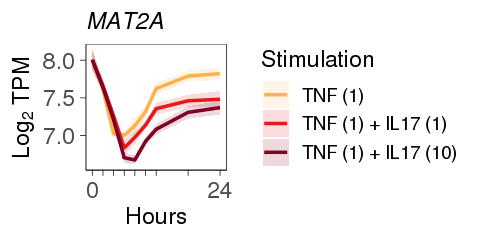

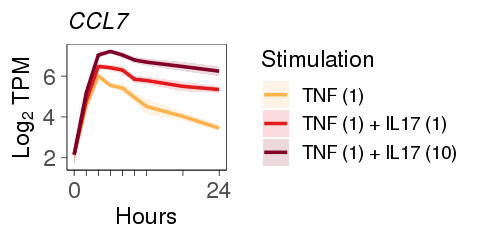

In [101]:
options(repr.plot.width = 4, repr.plot.height = 2)

show_plot(plot_gene_by_stimulation("MAT2A", meta = meta, log2tpm = log2tpm_batch))
show_plot(plot_gene_by_stimulation("CCL7", meta = meta, log2tpm = log2tpm_batch))

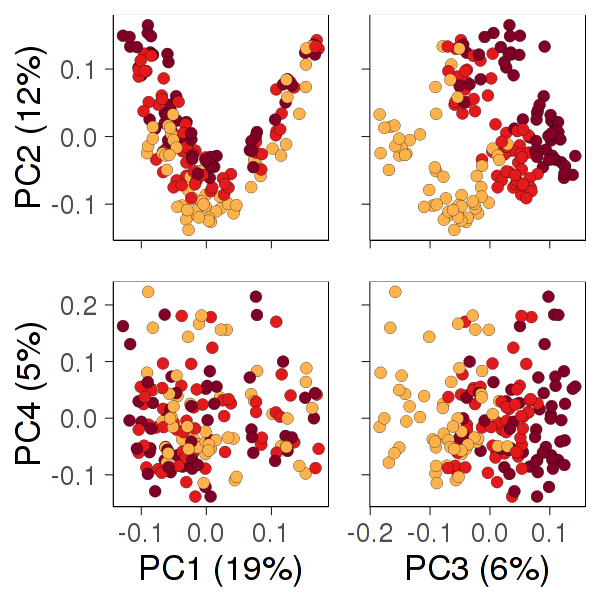

In [102]:
p1 <- plot_pca("PC1", "PC2") + theme(legend.position = "none", axis.text.x = element_blank(), axis.title.x = element_blank())
p2 <- plot_pca("PC3", "PC2") + theme(legend.position = "none",
                                     axis.text.x = element_blank(), axis.title.x = element_blank(),
                                     axis.text.y = element_blank(), axis.title.y = element_blank()
                                    )
p3 <- plot_pca("PC1", "PC4") + theme(legend.position = "none")
p4 <- plot_pca("PC3", "PC4") + theme(legend.position = "none", axis.text.y = element_blank(), axis.title.y = element_blank())

options(repr.plot.width = 5, repr.plot.height = 5)

(p1 + p2) / (p3 + p4)

In [103]:
# Add principal curves to the PCA result
n_components <- 4
x <- do.call(rbind, lapply(unique(pca_dat$Stimulation), function(this_stim) {
  ix_stim <- which(pca_dat$Stimulation == this_stim)
  pca_curve <- princurve::principal_curve(
    maxit = 1e2,
    thresh = 0.0001,
    x = as.matrix(pca_dat[ix_stim, c("Time", sprintf("PC%s", seq(n_components)))])
  )
  x <- pca_curve$s
  x <- x[,!colnames(x) %in% c("Time")]
  x_rownames <- rownames(x)
  colnames(x) <- sprintf("PC%s_curve", seq(n_components))
  x <- as.data.frame(x)
  rownames(x) <- x_rownames
  x$pca_lambda <- pca_curve$lambda 
  # Sometimes the fit is backwards
  if (cor(pca_dat$Time[ix_stim], pca_curve$lambda) < 0) {
    x$pca_lambda <- abs(x$pca_lambda - max(x$pca_lambda))
  }
  # Re-scale the distance to 24 hours
#   x$pca_lambda <- x$pca_lambda * (24 / max(x$pca_lambda))
  return(x)
}))
x <- x[rownames(pca_dat),]
stopifnot(all(rownames(x) == rownames(pca_dat)))
ix_curve <- colnames(pca_dat) %in% c("pca_lambda", sprintf("PC%s_curve", seq(n_components)))
# Remove the curve
pca_dat <- pca_dat[,!ix_curve]
# Add the curve
pca_dat <- cbind(pca_dat, x)

In [104]:
x <- 1
y <- 3
cx <- sprintf("PC%s_curve", x)
cy <- sprintf("PC%s_curve", y)

dat_curve <- (
  pca_dat[,c(cx, cy, "Time", "Stimulation")]
) %>%
group_by(Time, Stimulation) %>%
summarize(
  !!cx := mean(get(cx)),
  !!cy := mean(get(cy))
)


In [105]:
plot_pca_curve <- function(
  pca_dat, x = 1, y = 2,
  fill = "Stimulation",
  fill_values = NULL,
  fill_name = NULL,
  draw_curve = TRUE
) {
  p <- ggplot() +
  geom_point(
    data = pca_dat,
    mapping = aes_string(
      x = sprintf("PC%s", x),
      y = sprintf("PC%s", y),
      fill = fill
    ),
    shape = 21, size = 3, stroke = 0.25
  )
  if (draw_curve) {
    myarrow <- arrow(angle = 20, length = unit(0.15, "inches"), type = "closed")
    cx <- sprintf("PC%s_curve", x)
    cy <- sprintf("PC%s_curve", y)
    dat_curve <- pca_dat[,c(cx, cy, "Time", "Stimulation")] %>%
      group_by(Time, Stimulation) %>%
      summarize(
        !!cx := mean(get(cx)),
        !!cy := mean(get(cy))
      ) %>%
      arrange(Time)
    p <- p +
    geom_path(
      data = dat_curve,
      mapping = aes_string(
        x = sprintf("PC%s_curve", x),
        y = sprintf("PC%s_curve", y),
        group = "Stimulation"
      ),
      lineend = "round",
      linejoin = "round",
      color = "white",
      arrow = myarrow,
      size = 2.5
    ) +
    geom_path(
      data = dat_curve,
      mapping = aes_string(
        x = sprintf("PC%s_curve", x),
        y = sprintf("PC%s_curve", y),
        color = "Stimulation",
        group = "Stimulation"
      ),
      lineend = "round",
      linejoin = "round",
      arrow = myarrow,
      size = 1
    ) +
    scale_color_manual(
      name = "Stimulation", values = meta_colors[["Stimulation"]],
      guide = FALSE
    )
  }
  # Automatically color stuff!
  if (is.null(fill_name)) {
    fill_name <- fill
  }
  if (fill %in% names(meta_colors) && is.null(fill_values)) {
    p <- p + scale_fill_manual(
      name = fill_name, values = meta_colors[[fill]],
      guide = guide_legend(override.aes = list(size = 5))
    )
  } else if (!is.null(fill_values)) {
    p <- p + scale_fill_manual(
      name = fill_name, values = fill_values,
      guide = guide_legend(override.aes = list(size = 5))
    )
  }
  # Return a ggplot2 object
  p +
  theme_clean(base_size = 20) +
  labs(
    x = sprintf("PC%s (%.0f%%)", x, 100 * pca$importance[2,x]),
    y = sprintf("PC%s (%.0f%%)", y, 100 * pca$importance[2,y])
  )  
}


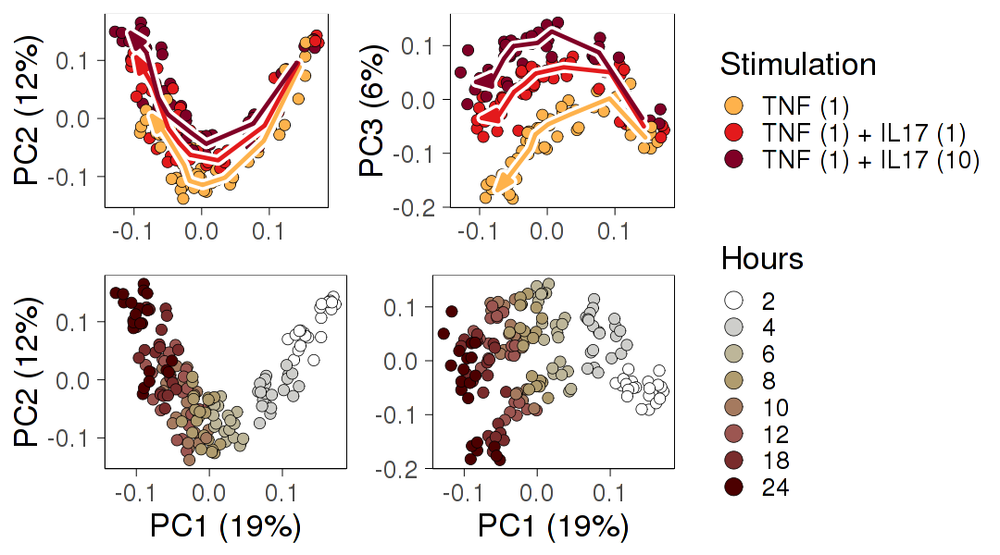

In [106]:
p1 <- plot_pca_curve(pca_dat, draw_curve = TRUE, x = 1, y = 2, fill = "Stimulation")
p2 <- plot_pca_curve(pca_dat, draw_curve = FALSE,
  x = 1,
  y = 2,
  fill = "TimeFactor",
  fill_name = "Hours",
  fill_values = scico::scico(n = 8, palette = "bilbao")
)
options(repr.plot.width = 10, repr.plot.height = 3)

# p1 + p2

p3 <- plot_pca_curve(pca_dat, draw_curve = TRUE, x = 1, y = 3, fill = "Stimulation")
p4 <- plot_pca_curve(pca_dat, draw_curve = FALSE,
  x = 1,
  y = 3,
  fill = "TimeFactor",
  fill_name = "Hours",
  fill_values = scico::scico(n = 8, palette = "bilbao")
)

options(repr.plot.width = 9, repr.plot.height = 5)

(
  (p1 + theme(axis.title.x = element_blank(), legend.position = "none")) +
  (p3 + theme(axis.title.x = element_blank()))
) /
(
  (p2 + theme(legend.position = "none")) +
  (p4 + theme(axis.title.y = element_blank()))
)

# Mike Love's PCA tutorial

In [107]:
counts <- fread("gzip -dc share/NCBI-GEO/rnaseq-data-1/rnaseq_gene_counts.tsv.gz") %>%
as.data.frame() %>%
column_to_rownames(var = "ID_REF") %>%
as.matrix() %>%
round()

counts[1:5,1:5]

,S1,S10,S100,S101,S103
ENSG00000004059,123,78,181,160,112
ENSG00000003056,127,148,223,228,187
ENSG00000173153,4,1,4,3,6
ENSG00000004478,28,65,41,69,54
ENSG00000003137,23,6,0,3,2


In [108]:
library(vsn)

Loading required package: Biobase
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union

The following object is masked from ‘package:limma’:

    plotMA

The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colMeans, colnames,
    colSums, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, lengths, Map, mapply, match,
    mget, order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rowMeans, rown

In [109]:
x <- data.frame(
  sd = matrixStats::rowSds(log2(counts + 1)),
  mean = rowMeans(log2(counts + 1))
)

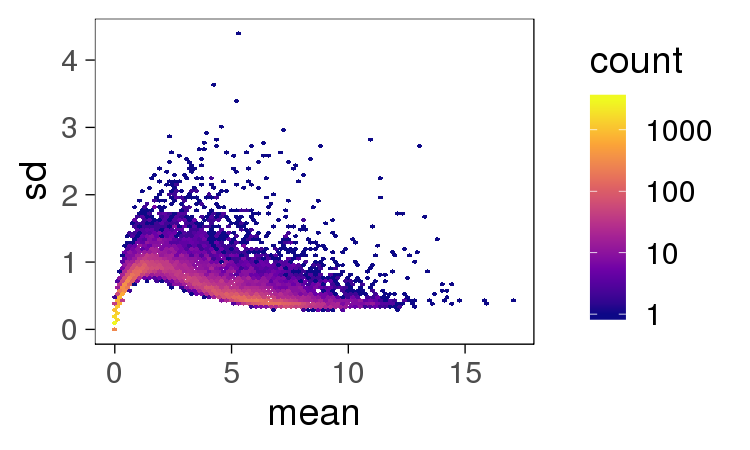

In [110]:
options(repr.plot.width = 5, repr.plot.height = 3)

p <- ggplot(x, aes(mean, sd)) +
geom_hex(bins = 80) +
scale_fill_viridis_c(trans = "log10", option = 5) +
theme(legend.key.height = unit(1.5, "lines"))

show_plot(p, res = 150)

In [111]:
counts[1:5,1:5]

,S1,S10,S100,S101,S103
ENSG00000004059,123,78,181,160,112
ENSG00000003056,127,148,223,228,187
ENSG00000173153,4,1,4,3,6
ENSG00000004478,28,65,41,69,54
ENSG00000003137,23,6,0,3,2


In [112]:
rownames(meta) <- meta$samp

In [113]:
dds <- DESeq2::DESeqDataSetFromMatrix(
  countData = counts,
  colData = meta,
#   design = ~ TimeFactor + DoseFactor + Cell_Line
    design = ~ TimeFactor + DoseFactor
)

converting counts to integer mode


In [114]:
vsd <- DESeq2::vst(dds)

In [115]:
library(DESeq2)

Loading required package: S4Vectors
Loading required package: stats4

Attaching package: ‘S4Vectors’

The following objects are masked from ‘package:data.table’:

    first, second

The following objects are masked from ‘package:dplyr’:

    first, rename

The following object is masked from ‘package:base’:

    expand.grid

Loading required package: IRanges

Attaching package: ‘IRanges’

The following object is masked from ‘package:data.table’:

    shift

The following objects are masked from ‘package:dplyr’:

    collapse, desc, slice

Loading required package: GenomicRanges
Loading required package: GenomeInfoDb
Loading required package: SummarizedExperiment
Loading required package: DelayedArray
Loading required package: matrixStats

Attaching package: ‘matrixStats’

The following objects are masked from ‘package:Biobase’:

    anyMissing, rowMedians

The following object is masked from ‘package:dplyr’:

    count


Attaching package: ‘DelayedArray’

The following objects are mask

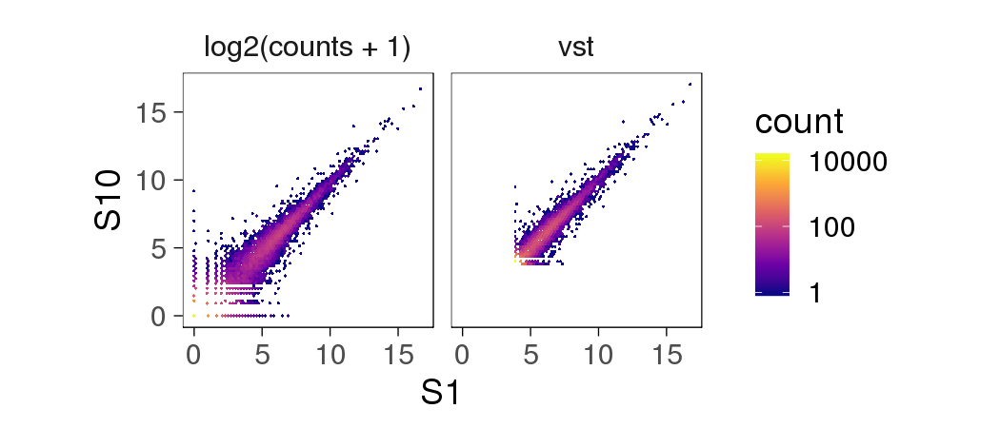

In [116]:
p <- bind_rows(
  as_data_frame(log2(counts[,1:2] + 1)) %>% mutate(label = "log2(counts + 1)"),
  as_data_frame(assay(vsd)[,1:2]) %>% mutate(label = "vst")
) %>%
ggplot(aes(S1, S10)) +
geom_hex(bins = 80) +
coord_fixed() +
facet_wrap(~ label) +
scale_fill_viridis_c(trans = "log10", option = 5) +
theme(legend.key.height = unit(1, "lines"))

options(repr.plot.width = 7, repr.plot.height = 3)

show_plot(p, res = 150)

In [117]:
sampleDists <- dist(t(assay(vsd)))

In [118]:
library("pheatmap")
library("RColorBrewer")

In [119]:
meta$samp <- sprintf("S%s", meta$Sample)
stopifnot(all(colnames(counts) == meta$samp))

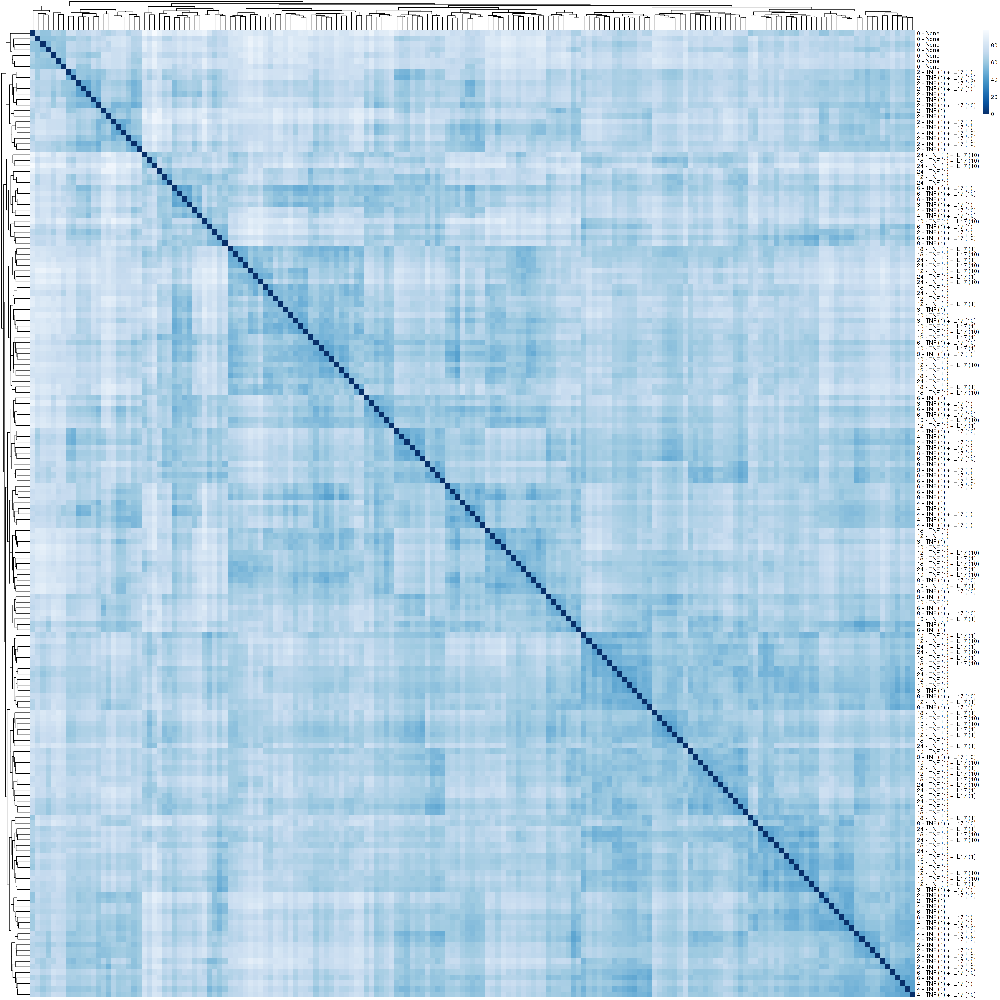

In [120]:
sampleDistMatrix <- as.matrix(sampleDists)
rownames(sampleDistMatrix) <- paste(meta$Time, meta$Stimulation, sep = " - ")
colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette(rev(brewer.pal(9, "Blues")) )(255)

options(repr.plot.width = 25, repr.plot.height = 25)

pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         col = colors)

In [121]:
o <- seriation::seriate(sampleDistMatrix, method = "BEA_TSP")
#sampleDistMatrix <- sampleDistMarix[o[[1]], o[[2]]]

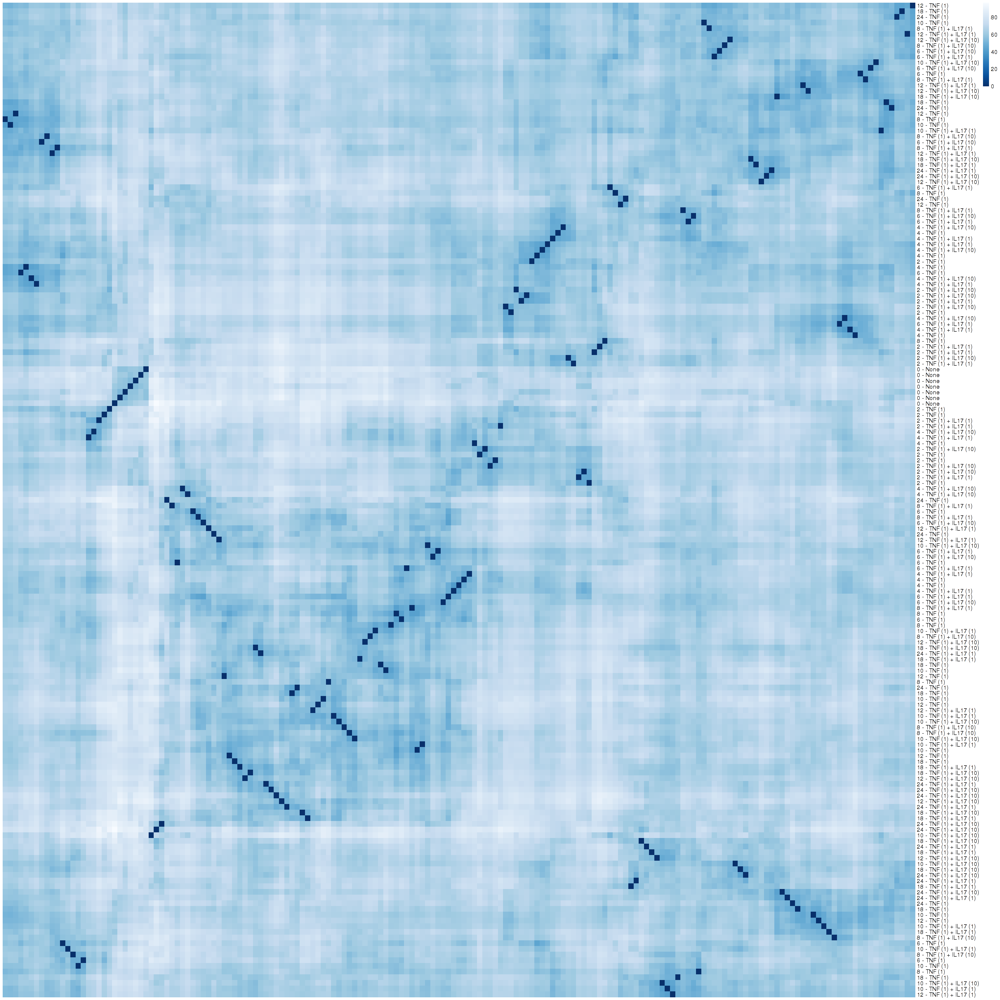

In [122]:
pheatmap(
  mat = sampleDistMatrix[o[[1]], o[[2]]],
  cluster_cols = FALSE,
  cluster_rows = FALSE,
  color = colors
)

In [123]:
assay(vsd)[1:5,1:5]

,S1,S10,S100,S101,S103
ENSG00000004059,7.317382,6.987766,7.670323,7.360092,7.391601
ENSG00000003056,7.355745,7.757074,7.933568,7.796710,8.031944
ENSG00000173153,4.661916,4.318811,4.626482,4.491647,4.900189
ENSG00000004478,5.799202,6.783755,6.046874,6.423226,6.565419
ENSG00000003137,5.640771,4.908793,3.900006,4.491647,4.485078


## PCA

[1] 636

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
Standard deviation,12.76928,8.963662,8.656598,4.728612,3.752785,3.26351,2.917686,2.584846,2.314786,2.133564
Proportion of Variance,0.30669,0.151130,0.140950,0.042060,0.026490,0.02003,0.016010,0.012570,0.010080,0.008560
Cumulative Proportion,0.30669,0.457820,0.598770,0.640830,0.667320,0.68735,0.703360,0.715930,0.726010,0.734570


,gene,PC1,PC2,PC3,PC4
ENSG00000002549,LAP3,0.05063845,-0.018592814,-0.03574228,-0.0008165404
ENSG00000003402,CFLAR,0.02177327,-0.010988911,0.00977325,0.0008480571
ENSG00000003989,SLC7A2,0.08530591,0.045606753,0.02116241,0.0220513600
ENSG00000004660,CAMKK1,-0.04063426,0.007686333,0.01108486,0.0392167361
ENSG00000005102,MEOX1,0.01172698,-0.065733871,0.01183659,-0.0278397801


[1] 636

term,estimate,std.error,statistic,p.value,pc,log10p,zscore
(Intercept),-12.3689962,1.40742759,-8.788371,1.511986e-15,1,14.820452,7.972552
Time,1.1268951,0.10565827,10.665470,1.047609e-20,1,19.979801,8.014016
Dose,0.2869015,0.16747833,1.713067,8.850216e-02,1,1.053046,1.703352
(Intercept),-9.4257813,0.93181804,-10.115474,3.618341e-19,2,18.441490,8.014016
Time,0.6048528,0.06995336,8.646516,3.603747e-15,2,14.443246,7.869778
Dose,0.9457002,0.11088267,8.528837,7.378201e-15,2,14.132050,7.778698


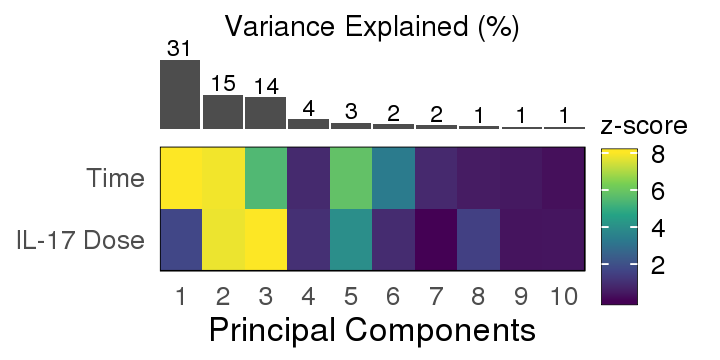

In [642]:
ix_pca <- seq(nrow(meta))
# ix_pca <- meta$Stimulation != "None"

ix_cat <- ens_to_cat[which(ens_to_cat != 0)] %>% names()
length(ix_cat)

# pca <- summary(prcomp(x = t(assay(vsd)[ix_cat, ix_pca])))
pca <- summary(prcomp(x = t(log2tpm_batch[ix_cat, ix_pca])))
# pca <- summary(prcomp(x = t(log2tpm_batch[, ix_pca])))
# pca <- summary(prcomp(x = t(log2tpm[ix_cat, ix_pca])))
pca$importance[,1:10]
pca_dat <- cbind(meta[ix_pca,], as.data.frame(pca$x[,1:10]))

pca$rotation <- data.frame(
  gene = gene_symbols[rownames(pca$rotation)],
  pca$rotation
)
corner(pca$rotation)
nrow(pca$rotation)

# ANOVA

# cols <- c(
#   "Time", "Dose"
# #  "Stimulation", "Time", "Dose", "Disease"
# #   "Plate", "Disease", "Cell_Line"
# )

# a <- rbindlist(lapply(cols, function(col) {
#   rbindlist(lapply(1:10, function(pc) {
#     a <- anova(aov(formula = as.formula(sprintf("PC%s ~ %s", pc, col)), data = pca_dat))
#     a <- broom::tidy(a)
#     a$pc <- pc
#     a
#   }))
# }))
# a <- a[!is.na(a$p.value),]
# a$pc <- factor(a$pc)
# a %>% arrange(p.value) %>% head

# a$log10p <- -log10(a$p.value)
# a$zscore <- qnorm(1 - (a$p.value / 2))
# a$zscore[!is.finite(a$zscore)] <- max(a$zscore[is.finite(a$zscore)])

# Linear model (almost the same result)
a <- rbindlist(lapply(1:10, function(pc) {
  a <- lm(formula = as.formula(sprintf("PC%s ~ Time + Dose", pc)), data = pca_dat)
  a <- broom::tidy(a)
  a$pc <- pc
  a
}))
a <- a[!is.na(a$p.value),]
a$pc <- factor(a$pc)
a$log10p <- -log10(a$p.value)
a$zscore <- qnorm(1 - (a$p.value / 2))
a$zscore[!is.finite(a$zscore)] <- max(a$zscore[is.finite(a$zscore)])
head(a)


options(repr.plot.width = 6, repr.plot.height = 3)

p1 <- ggplot(a %>% filter(term != "(Intercept)"), aes(x = pc, y = term, fill = zscore)) +
geom_tile() +
# scale_fill_gradient2(low = "white", high = "black") +
scale_fill_viridis_c() + #name = bquote("-log"[10]~"P")) +
# scale_fill_distiller(direction = 1, palette = "Greys") +
scale_x_discrete(expand = c(0, 0)) +
scale_y_discrete(expand = c(0, 0), labels = c("Time" = "Time", "Dose" = "IL-17 Dose")) +
guides(
  fill = guide_colorbar(title = "z-score",
    barheight = 6.5, barwidth = 1.5,
    frame.colour = "black", frame.linewidth = 0.6,
    ticks.linewidth = 1.5
  )
) +
theme_minimal(base_size = 20) +
# coord_equal() +
theme(legend.title = element_text(size = 16),
  panel.border = element_rect(fill = NA, size = 0.5),
  panel.grid = element_blank(),
  legend.position = "right",
  legend.box.spacing = unit(0, "lines"),
  plot.margin = margin(0, 0, 0, 0)
) +
labs(x = "Principal Components", y = NULL)

d <- janitor::clean_names(as.data.frame(t(pca$importance[,1:10]))) %>%
rownames_to_column("pc") %>%
mutate(pc = factor(as.integer(substr(pc, 3, 5))))

p2 <- ggplot() +
geom_col(width = 0.95,
  data = d, mapping = aes(x = pc, y = proportion_of_variance),
  fill = "grey30"
) +
scale_x_discrete(expand = c(0, 0)) +
scale_y_discrete(expand = c(0.1, 0)) +
geom_text(
  mapping = aes(x = 5.5, y = max(d$proportion_of_variance) * 1.5, label = "Variance Explained (%)"),
  size = 6
) +
geom_text(
  data = d, mapping = aes(
    x = pc, y = proportion_of_variance,
    label = sprintf("%.0f", proportion_of_variance * 100)
  ),
  size = 5,
  vjust = -0.2
) +
theme(axis.text = element_blank(), axis.ticks = element_blank(), panel.border = element_blank()) +
labs(x = NULL, y = NULL) +
theme(plot.margin = margin(0, 0, 0, 0))

show_plot((p2 / p1) + plot_layout(ncol = 1), name = "rnaseq-data-1-pca-variance")

In [643]:
class(pca_dat$Time)
class(pca_dat$Stimulation)
class(pca_dat$Dose)

[1] "integer"

[1] "character"

[1] "numeric"

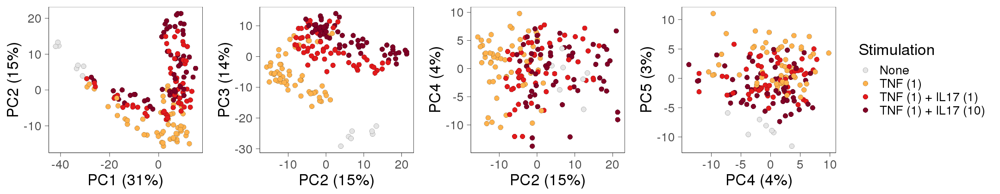

In [644]:
options(repr.plot.width = 18, repr.plot.height = 3.5)

plot_pca <- function(x = "PC1", y = "PC2", fill = "Stimulation") {
  ggplot(pca_dat, aes_string(x = x, y = y, fill = fill)) +
  geom_point(shape = 21, size = 3, stroke = 0.1) +
  scale_fill_manual(values = meta_colors[[fill]]) +
  theme_clean(base_size = 20) +
  labs(
    x = sprintf("%s (%.0f%%)", x, 100 * pca$importance[2,x]),
    y = sprintf("%s (%.0f%%)", y, 100 * pca$importance[2,y])
  )
}

show_plot(name = "rnaseq-data-1-pca-1-2-3-4-9",
  (plot_pca("PC1", "PC2") + theme(legend.position = "none") ) + 
  (plot_pca("PC2", "PC3") + theme(legend.position = "none") ) +
  (plot_pca("PC2", "PC4") + theme(legend.position = "none") ) +
  plot_pca("PC4", "PC5") + plot_layout(ncol = 4)
)

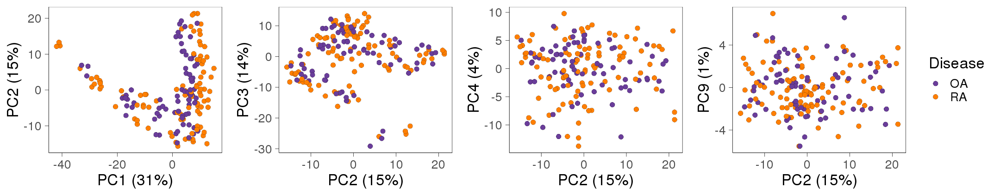

In [645]:
show_plot(name = "rnaseq-data-1-pca-ra-oa",
  (plot_pca("PC1", "PC2", fill = "Disease") + theme(legend.position = "none") ) + 
  (plot_pca("PC2", "PC3", fill = "Disease") + theme(legend.position = "none") ) +
  (plot_pca("PC2", "PC4", fill = "Disease") + theme(legend.position = "none") ) +
  plot_pca("PC2", "PC9", fill = "Disease") + plot_layout(ncol = 4)
)

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


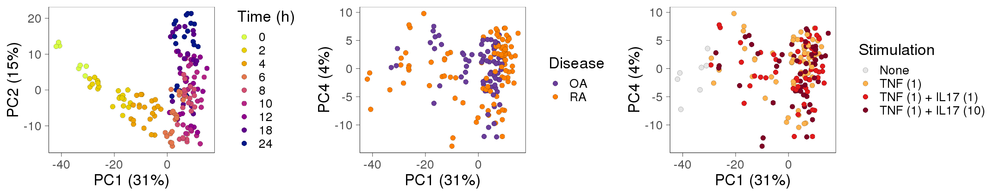

In [646]:
options(repr.plot.width = 18, repr.plot.height = 3.5)

p1 <- plot_pca("PC1", "PC2", fill = "TimeFactor") +
    scale_fill_manual(values = rev(colorspace::sequential_hcl(palette = "Plasma", n = 9)))
#   scale_fill_manual(values = scico::scico(n = length(unique(pca_dat$TimeFactor)), palette = "bilbao"))


show_plot(name = "rnaseq-data-1-pca-time",
  p1 + guides(fill = guide_legend(title = "Time (h)")) +
  plot_pca("PC1", "PC4", fill = "Disease") +
  plot_pca("PC1", "PC4", fill = "Stimulation")
)

In [647]:
# Add principal curves to the PCA result
n_components <- 10
stimulations <- c("TNF (1)", "TNF (1) + IL17 (1)", "TNF (1) + IL17 (10)")
x <- do.call(rbind, lapply(stimulations, function(this_stim) {
  ix_stim <- c(
    which(pca_dat$Stimulation == "None"),
    which(pca_dat$Stimulation == this_stim)
  )
  pca_curve <- princurve::principal_curve(
    maxit = 1e2,
    thresh = 0.0001,
    x = as.matrix(pca_dat[ix_stim, c("Time", sprintf("PC%s", seq(n_components)))])
  )
  x <- pca_curve$s
  x <- x[,!colnames(x) %in% c("Time")]
  x_rownames <- rownames(x)
  colnames(x) <- sprintf("PC%s_curve", seq(n_components))
  x <- as.data.frame(x)
  rownames(x) <- x_rownames
  x$pca_lambda <- pca_curve$lambda 
  # Sometimes the fit is backwards
  if (cor(pca_dat$Time[ix_stim], pca_curve$lambda) < 0) {
    x$pca_lambda <- abs(x$pca_lambda - max(x$pca_lambda))
  }
  # Re-scale the distance to 24 hours
#   x$pca_lambda <- 24 * (x$pca_lambda / max(x$pca_lambda))
  return(x)
}))
x <- x[rownames(pca_dat),]
stopifnot(all(rownames(x) == rownames(pca_dat)))
ix_curve <- colnames(pca_dat) %in% c("pca_lambda", sprintf("PC%s_curve", seq(n_components)))
# Remove the curve
pca_dat <- pca_dat[,!ix_curve]
# Add the curve
pca_dat <- cbind(pca_dat, x)

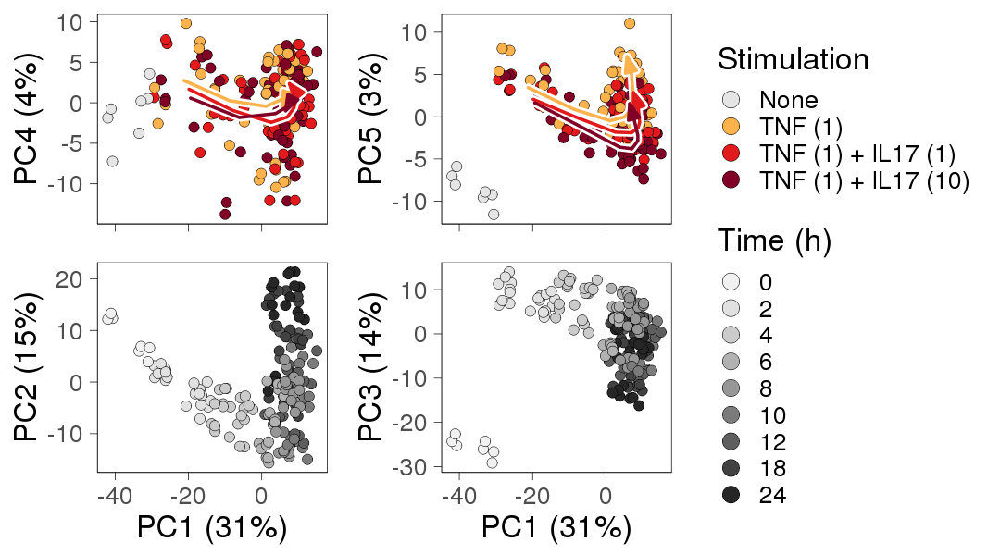

In [648]:
time_colors <- rev(colorspace::sequential_hcl(palette = "Grays", n = 9))

p1 <- plot_pca_curve(pca_dat, draw_curve = TRUE, x = 1, y = 4, fill = "Stimulation")
p2 <- plot_pca_curve(pca_dat, draw_curve = FALSE,
  x = 1,
  y = 2,
  fill = "TimeFactor",
  # fill_name = "Hours",
  fill_name = "Time (h)",
  # fill_values = scico::scico(n = length(unique(pca_dat$TimeFactor)), palette = "bilbao")
  fill_values = time_colors
)
options(repr.plot.width = 10, repr.plot.height = 3)

# p1 + p2

p3 <- plot_pca_curve(pca_dat, draw_curve = TRUE, x = 1, y = 5, fill = "Stimulation")
p4 <- plot_pca_curve(pca_dat, draw_curve = FALSE,
  x = 1,
  y = 3,
  fill = "TimeFactor",
  fill_name = "Time (h)",
#   fill_values = scico::scico(n = length(unique(pca_dat$TimeFactor)), palette = "bilbao")
  fill_values = time_colors
)

options(repr.plot.width = 9, repr.plot.height = 5)

show_plot(name = "rnaseq-data-1-princurve",
  (
    (p1 + theme(axis.title.x = element_blank(), axis.text.x = element_blank(), legend.position = "none")) +
    (p3 + theme(axis.title.x = element_blank(), axis.text.x = element_blank()))
  ) /
  (
    (p2 + theme(legend.position = "none")) +
    (p4 )
  )
)

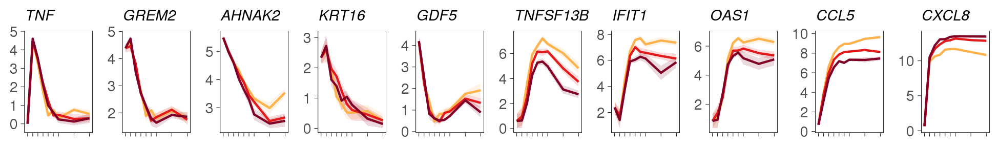

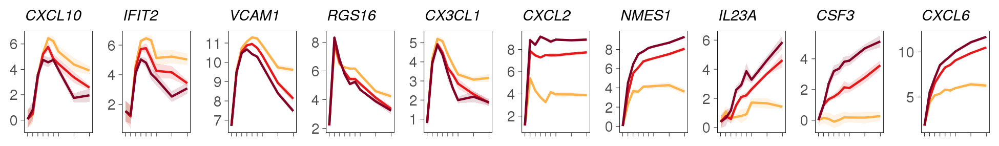

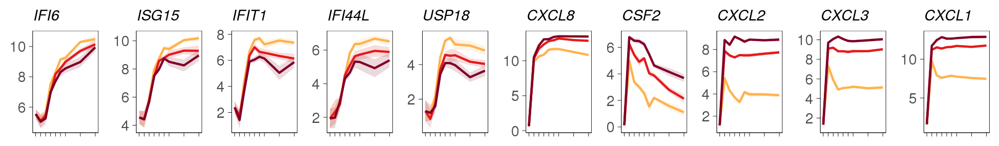

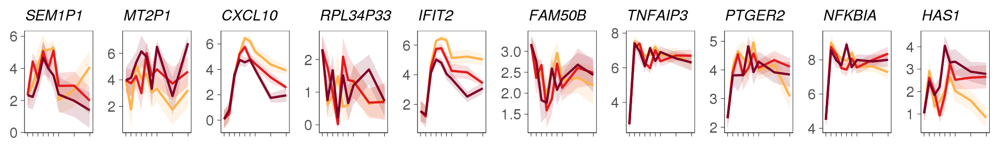

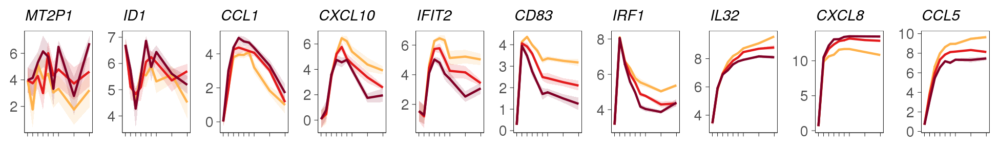

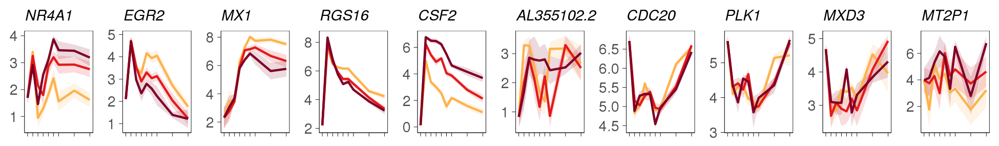

In [649]:
for (this_pc in sprintf("PC%s", 1:6)) {

  n <- 5
  
  x1 <- data.frame(ensembl_id = rownames(pca$rotation), pca$rotation, stringsAsFactors = FALSE) %>%
  mutate(gene = gene_symbols[ensembl_id], category = ens_to_cat[ensembl_id]) %>%
  select(ensembl_id, gene, category, PC1, PC2, PC3, PC4, PC5, PC6) %>%
  top_n(n = n, wt = -!!as.symbol(this_pc)) %>%
  arrange(!!as.symbol(this_pc))

  x2 <- data.frame(ensembl_id = rownames(pca$rotation), pca$rotation, stringsAsFactors = FALSE) %>%
  mutate(gene = gene_symbols[ensembl_id], category = ens_to_cat[ensembl_id]) %>%
  select(ensembl_id, gene, category, PC1, PC2, PC3, PC4, PC5, PC6) %>%
  top_n(n = n, wt = !!as.symbol(this_pc)) %>%
  arrange(!!as.symbol(this_pc))

  x <- rbind(x1, x2)
  x

#   if (this_pc == "PC3") {
#     x <- x[rev(seq(nrow(x))),]
#   }
  plot_these_genes(x$gene, ncol = n * 2, title = this_pc)
}

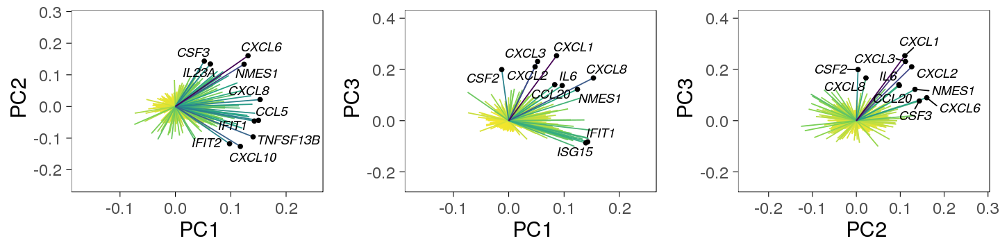

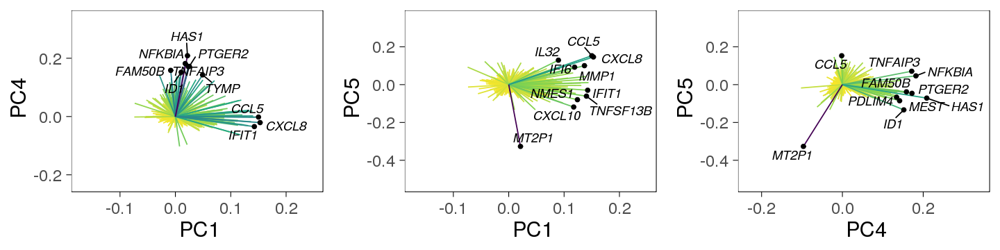

In [650]:
plot_segment_genes <- function(d, x, y, n = 10) {
  # This should be a column in d.
  x <- enquo(x)
  y <- enquo(y)
  
  d <- d %>% mutate(wt = abs(!!x)^2 + abs(!!y)^2)
  x1 <- d %>% top_n(n = n, wt = wt)
  
  # Build the histogram.
  p1 <- ggplot() +
  geom_segment(
    data = d[order(d$wt),],
    mapping = aes(x = 0, y = 0, xend = !!x, yend = !!y, color = wt)
#     alpha = 0.2
  ) +
  scale_alpha_continuous(guide = FALSE) +
  scale_color_viridis_c(guide = FALSE, direction = -1) +
  geom_point(
    data = x1,
    mapping = aes(x = !!x, y = !!y)
  ) +
  geom_text_repel(
    data = x1,
    mapping = aes(x = !!x, y = !!y, label = gene),
    fontface = "italic"
  ) +
  scale_x_continuous(expand = c(0.5, 0)) +
  scale_y_continuous(expand = c(0.5, 0)) +
  labs(x = x, y = y)
}

options(repr.plot.width = 12, repr.plot.height = 3)

p1 <- plot_segment_genes(pca$rotation, PC1, PC2)
p2 <- plot_segment_genes(pca$rotation, PC1, PC3)
p3 <- plot_segment_genes(pca$rotation, PC2, PC3)

show_plot(p1 + p2 + p3)

p1 <- plot_segment_genes(pca$rotation, PC1, PC4)
p2 <- plot_segment_genes(pca$rotation, PC1, PC5)
p3 <- plot_segment_genes(pca$rotation, PC4, PC5)

show_plot(p1 + p2 + p3)

[1] 35  4

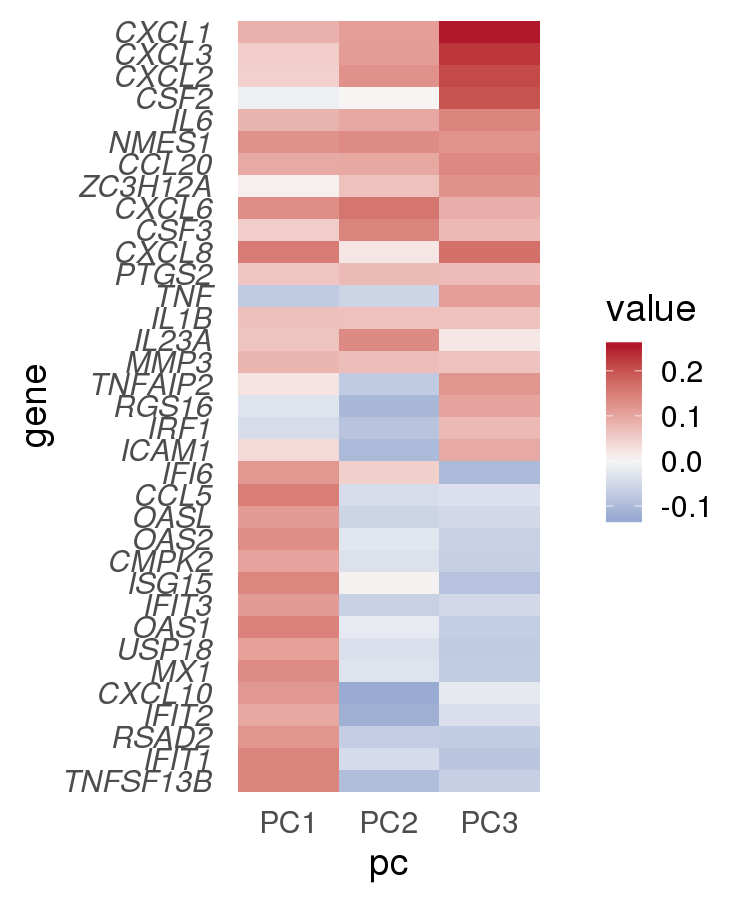

In [281]:
options(repr.plot.width = 5, repr.plot.height = 6)

mat <- pca$rotation %>% select(gene, PC1, PC2, PC3)

mat <- mat[rowSums(abs(mat[,2:4])) > 0.2,]

dim(mat)

o <- seriation::seriate(
  x = as.matrix(mat[,c("PC1", "PC2", "PC3")])
)

d <- mat %>%
tidyr::gather("pc", "value", -gene)

d$gene <- factor(
  as.character(d$gene),
  as.character(d$gene)[o[[1]]]
)

cols <- brewer.pal(9, "RdBu")

p <- ggplot() +
geom_tile(data = d, mapping = aes(x = pc, y = gene, fill = value)) +
theme(
  panel.border = element_blank(),
#   axis.text.y = element_blank(),
  axis.text.y = element_text(face = "italic"),
  axis.ticks.y = element_blank(),
  axis.ticks.x = element_blank()
) +
scale_fill_gradient2(low = cols[9], mid = cols[5], high = cols[1])

show_plot(p, res = 150)

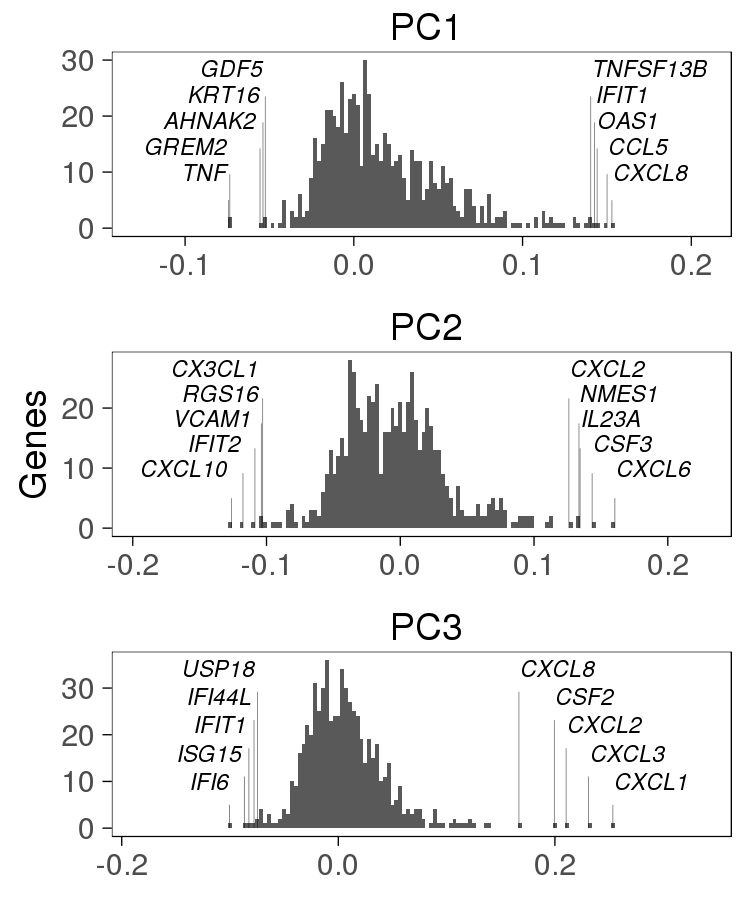

In [282]:
plot_hist_genes <- function(d, x, n = 5) {
  # This should be a column in d.
  x <- enquo(x)
  
  # Build the histogram.
  p1 <- ggplot() +
  geom_histogram(data = d, mapping = aes(x = !!x), bins = 100)
  
  p1_data <- ggplot_build(p1)
  
  # Get the maximum count from the plot.
  max_y <- max(p1_data[["data"]][[1]][["count"]])
  
  x1 <- bind_rows(
    d %>% top_n(n = n, wt = !!x) %>% arrange(!!x),
    d %>% top_n(n = n, wt = -!!x) %>% arrange(!!x)
  )

  x1$nudge_y <- c(
    seq(10, max_y * 0.95, length.out = n),
    seq(max_y * 0.95, 10, length.out = n)
  )[order(x1 %>% select(!!x))]
  
  p1 + geom_segment(
    data = x1,
    mapping = aes(x = !!x, xend = !!x, yend = 0, y = nudge_y - 5),
    size = 0.2, alpha = 0.5
  ) +
  geom_text(
    data = x1 %>% filter(!!x < 0),
    mapping = aes(x = !!x, y = nudge_y, label = gene),
    fontface = "italic",
    hjust = 1.05
  ) +
  geom_text(
    data = x1 %>% filter(!!x > 0),
    mapping = aes(x = !!x, y = nudge_y, label = gene),
    fontface = "italic",
    hjust = 0
  ) +
  scale_x_continuous(expand = c(0.3, 0)) +
  labs(y = "Genes", x = NULL, title = x)
}

options(repr.plot.width = 5, repr.plot.height = 6)

p1 <- plot_hist_genes(pca$rotation, PC1) + labs(y = NULL)
p2 <- plot_hist_genes(pca$rotation, PC2)
p3 <- plot_hist_genes(pca$rotation, PC3) + labs(y = NULL)

show_plot(p1 / p2 / p3, res = 150)

# show_plot(plot_hist_genes(pca$rotation, PC4))
# show_plot(plot_hist_genes(pca$rotation, PC5))
# show_plot(plot_hist_genes(pca$rotation, PC6))


# Target genes for CUX1, ELF3, LIFR, STAT3, STAT4


In [679]:
d_sirna <- fread("gzip -cd analysis/limma/003_sirna_limma_dosetime_sirna.tsv.gz")

In [681]:
cats <- readRDS("analysis/limma/cats.rds")

print(sapply(cats, length))

   C1    C2    C3    C4    C5  None 
   26    25   370    13   202 19243 


In [682]:
d_sirna$category <- 0
d_sirna$category[d_sirna$ensembl_id %in% cats$C1] <- 1
d_sirna$category[d_sirna$ensembl_id %in% cats$C2] <- 2
d_sirna$category[d_sirna$ensembl_id %in% cats$C3] <- 3
d_sirna$category[d_sirna$ensembl_id %in% cats$C4] <- 4
d_sirna$category[d_sirna$ensembl_id %in% cats$C5] <- 5

table(d_sirna$category)


     0      1      2      3      4      5 
339024    312    300   4440    156   2424 

In [689]:
targets <- lapply(c("CUX1", "LIFR", "ELF3", "STAT3", "STAT4"), function(this_coef) {
  (
    d_sirna %>%
    filter(Coef == this_coef) %>%
    filter(category != 0) %>%
    filter(logFC < log2(1 / 1.5) & adj.P.Val < 0.05) %>%
    dplyr::select(ID)
  )[,1]
})
names(targets) <- c("CUX1", "LIFR", "ELF3", "STAT3", "STAT4")
sapply(targets, length)

CUX1  LIFR  ELF3 STAT3 STAT4 
   15    14     4    17    28

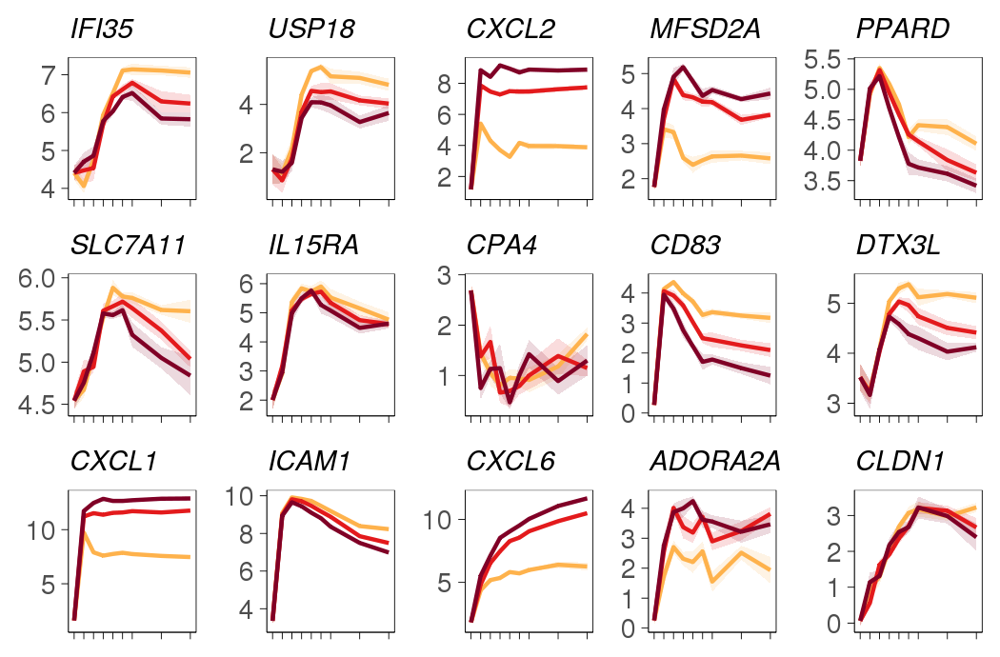

In [691]:
plot_these_genes(targets[["CUX1"]])

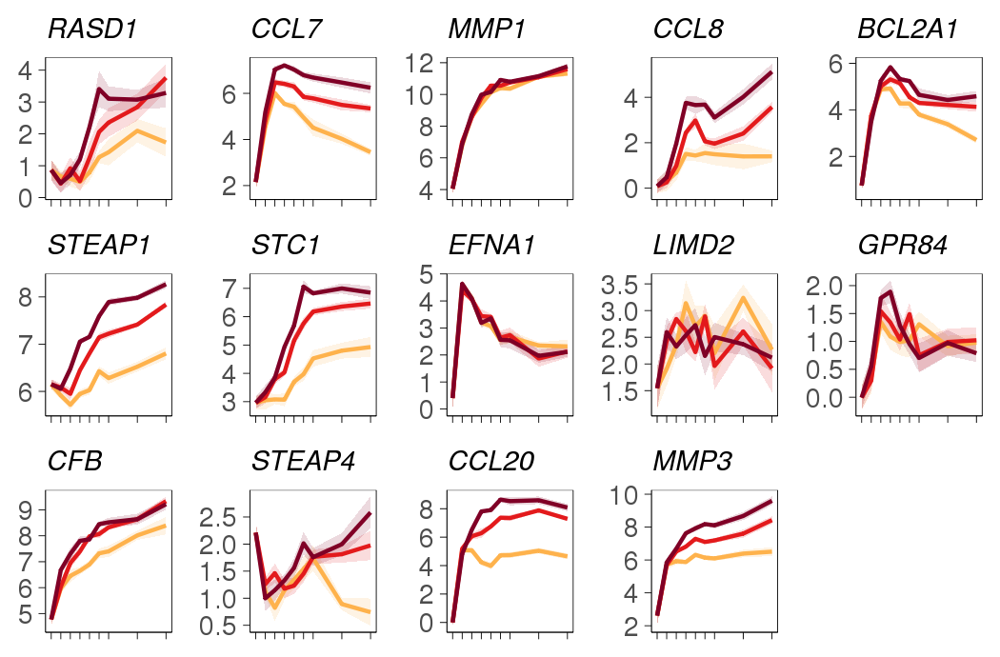

In [692]:
plot_these_genes(targets[["LIFR"]])

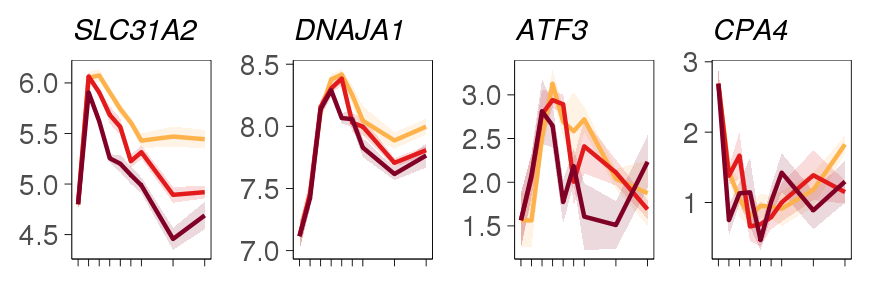

In [693]:
plot_these_genes(targets[["ELF3"]])

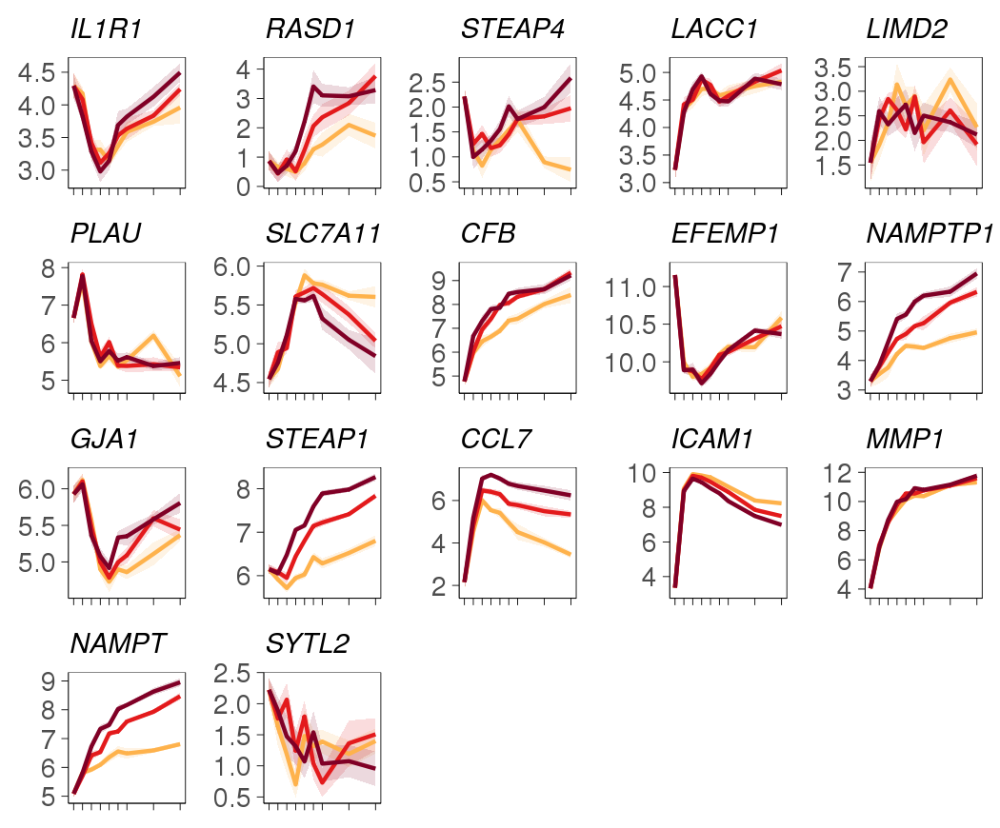

In [694]:
plot_these_genes(targets[["STAT3"]])

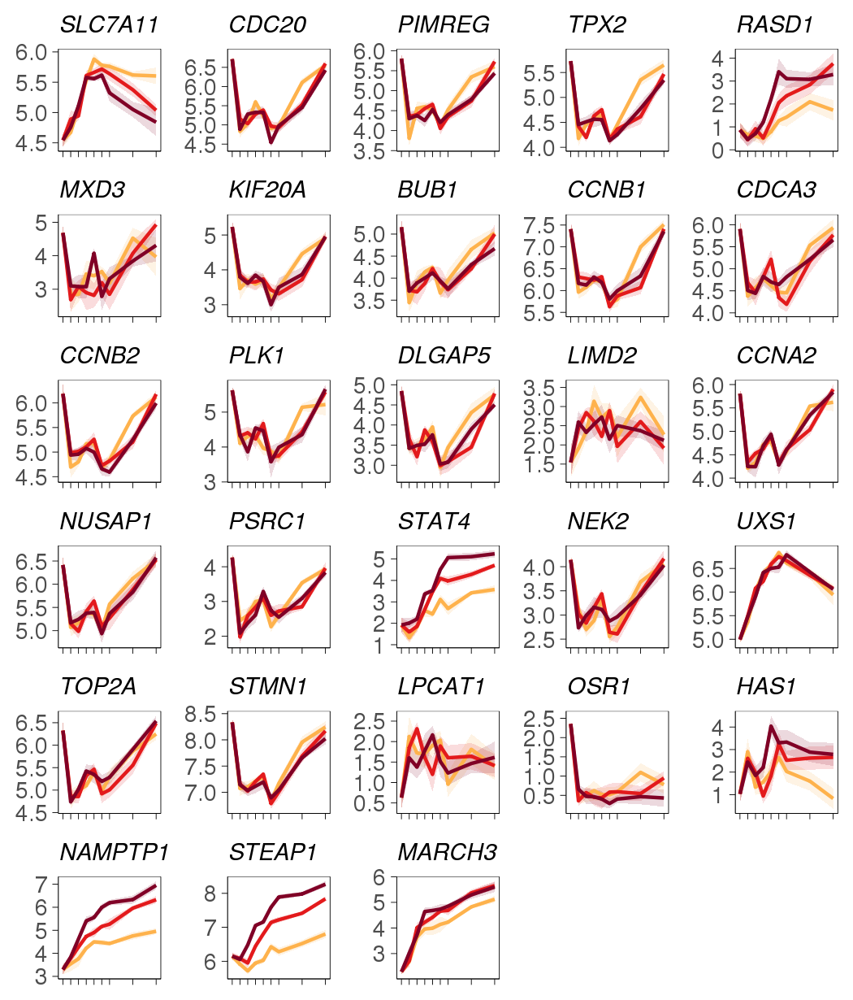

In [695]:
plot_these_genes(targets[["STAT4"]])

In [285]:
# Select the top 100 genes by p-value for 3 splines versus 1 spline.
ix_dtime_hmap <- dtime[order(dtime$qval),] %>% rownames %>% head(100)

clean_cols <- function(x) {
  colnames(x) <- str_replace_all(colnames(x), "[()]", "")
  colnames(x) <- str_replace_all(colnames(x), ":", "")
  colnames(x) <- str_replace_all(colnames(x), "DoseFactor", "d")
  colnames(x) <- str_replace_all(colnames(x), "DoseExposure", "d")
  colnames(x) <- str_replace_all(colnames(x), "TimeFactor", "t")
  colnames(x) <- str_replace_all(colnames(x), "TRUE", "1")
  return(x)
}

# Only model the TNF data (excluding the TNF+IL17 data)
ix_hmap <- which(meta_zero$DoseFactor == 0)

des_hmap <- clean_cols(with(
  meta_zero[ix_hmap,],
  model.matrix(~ 0 + TimeFactor)
))

print(colnames(des_hmap))

fit_hmap <- lmFit(object = log2tpm_zero[,ix_hmap], design = des_hmap)

fit_hmap <- eBayes(fit_hmap)
fit_hmap$genes <- gene_symbols[rownames(fit_hmap$coefficients)]

hmap1_mat <- fit_hmap$coefficients[ix_dtime_hmap,]
# plot(hmap[this_ens,])

[1] "t0"  "t2"  "t4"  "t6"  "t8"  "t10" "t12" "t18" "t24"


In [286]:
clean_cols <- function(x) {
  colnames(x) <- str_replace_all(colnames(x), "[()]", "")
  colnames(x) <- str_replace_all(colnames(x), ":", "")
  colnames(x) <- str_replace_all(colnames(x), "DoseFactor", "d")
  colnames(x) <- str_replace_all(colnames(x), "DoseExposure", "d")
  colnames(x) <- str_replace_all(colnames(x), "TimeFactor", "t")
  colnames(x) <- str_replace_all(colnames(x), "TRUE", "1")
  return(x)
}

des_hmap <- clean_cols(with(
  meta_zero,
  model.matrix(~ 0 + TimeFactor:DoseFactor)
))

print(colnames(des_hmap))

fit_hmap <- lmFit(object = log2tpm_zero, design = des_hmap)

fit_hmap <- eBayes(fit_hmap)
fit_hmap$genes <- gene_symbols[rownames(fit_hmap$coefficients)]

hmap3_mat <- fit_hmap$coefficients[ix_dtime_hmap,]

hmap4_mat <- fit_hmap$coefficients[ix_cat,]

con_hmap <- limma::contrasts.fit(
  fit = fit_hmap,
  contrasts = makeContrasts(
    contrasts = c(
      sprintf("t%sd1 - t%sd0", c(0, 2, 4, 6, 8, 10, 12, 18, 24), c(0, 2, 4, 6, 8, 10, 12, 18, 24)),
      sprintf("t%sd10 - t%sd0", c(0, 2, 4, 6, 8, 10, 12, 18, 24), c(0, 2, 4, 6, 8, 10, 12, 18, 24))
    ),
    levels = des_hmap
  )
)
con_hmap <- eBayes(con_hmap)
con_hmap$genes <- gene_symbols[rownames(con_hmap$p.value)]
print(colnames(con_hmap$p.value))

hmap2_mat <- (con_hmap$coefficients[,1:9] + con_hmap$coefficients[,10:18]) / 2
# hmap2_mat <- con_hmap$coefficients[,10:18]
hmap2_mat <- hmap2_mat[ix_dtime_hmap,]

#topTable(con_hmap, coef = 2)

 [1] "t0d0"   "t2d0"   "t4d0"   "t6d0"   "t8d0"   "t10d0"  "t12d0"  "t18d0" 
 [9] "t24d0"  "t0d1"   "t2d1"   "t4d1"   "t6d1"   "t8d1"   "t10d1"  "t12d1" 
[17] "t18d1"  "t24d1"  "t0d10"  "t2d10"  "t4d10"  "t6d10"  "t8d10"  "t10d10"
[25] "t12d10" "t18d10" "t24d10"
 [1] "t0d1 - t0d0"    "t2d1 - t2d0"    "t4d1 - t4d0"    "t6d1 - t6d0"   
 [5] "t8d1 - t8d0"    "t10d1 - t10d0"  "t12d1 - t12d0"  "t18d1 - t18d0" 
 [9] "t24d1 - t24d0"  "t0d10 - t0d0"   "t2d10 - t2d0"   "t4d10 - t4d0"  
[13] "t6d10 - t6d0"   "t8d10 - t8d0"   "t10d10 - t10d0" "t12d10 - t12d0"
[17] "t18d10 - t18d0" "t24d10 - t24d0"


In [287]:
scale_fill_scico_auto <- function(xs, ...) {
  offset <- abs(diff(abs(range(xs)))) / max(abs(xs)) / 2
  if (abs(min(xs)) > abs(max(xs))) {
    begin <- 0
    end   <- 1 - offset
  } else {
    begin <- offset
    end   <- 1 
  }
  return(scico::scale_fill_scico(begin = begin, end = end, ...))
}

Make two heatmaps, with genes as columns and time points as rows:

- Top heatmap shows the total response to IL-17 on top of TNF.
- Bottom heatmap shows the response to of TNF.

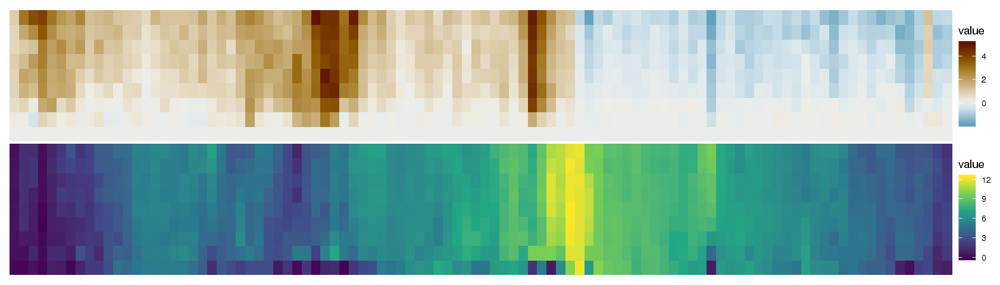

In [288]:
set.seed(42)

# hmap1_order <- seriation::seriate(
#   x = hmap1_mat,# + abs(min(hmap1_mat)),
#   margin = 1,
# #   method = "BEA_TSP"
#   method = "PCA"
# )

hmap2_order <- seriation::seriate(
  margin = 1,
  x = cbind(
    hmap1_mat + abs(min(hmap1_mat)),
    hmap2_mat + abs(min(hmap2_mat))
  ),
  method = "BEA_TSP"
#   x = cbind(hmap1_mat, hmap1_mat + hmap2_mat),
#   method = "PCA"
)

hmap1_dat <- hmap1_mat[hmap2_order[[1]],] %>% melt(id.vars = NULL)
hmap2_dat <- hmap2_mat[hmap2_order[[1]],] %>% melt(id.vars = NULL)
colnames(hmap2_dat) <- c("Var1", "Var2", "value")

stopifnot(all(hmap1_dat$Var1 == hmap2_dat$Var1))

p1 <- ggplot(hmap1_dat, aes(x = Var1, y = Var2, fill = value)) +
geom_tile() +
scale_fill_viridis_c() +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  axis.text.x = element_blank(),
  axis.text.y = element_blank(),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank()
)

p2 <- ggplot(hmap2_dat, aes(x = Var1, y = Var2, fill = value)) +
geom_tile() +
# scico::scale_fill_scico(
#   palette = "vik",
#   begin = diff(abs(range(hmap2_dat$value))) / max(hmap2_dat$value) / 2,
#   end = 1
# ) +
scale_fill_scico_auto(hmap2_dat$value, palette = "vik") +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  axis.text.x = element_blank(),
  axis.text.y = element_blank(),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank()
)

options(repr.plot.width = 14, repr.plot.height = 4)

p2 / p1

This is some sort of normalization... don't remember how to interpret it.

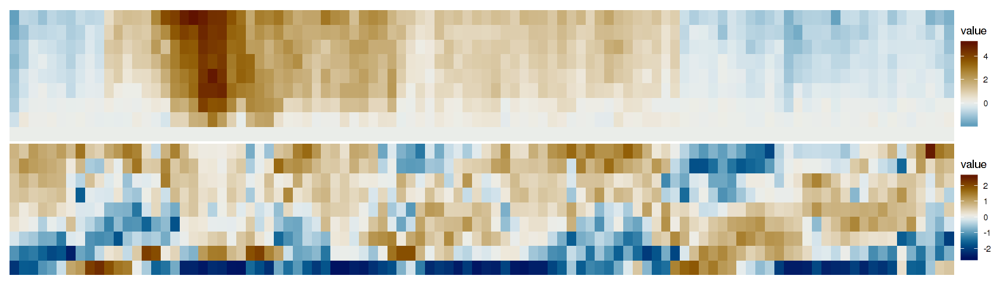

In [289]:
set.seed(42)

x1 <- scale_rows(hmap1_mat)
x2 <- hmap2_mat

hmap2_order <- seriation::seriate(
  margin = 1,
  x = cbind(
    x1 + abs(min(x1)),
    x2 + abs(min(x2))
  ),
  method = "BEA_TSP"
)

hmap1_dat <- hmap1_mat[hmap2_order[[1]],] %>% scale_rows %>% melt(id.vars = NULL)
hmap2_dat <- hmap2_mat[hmap2_order[[1]],] %>% melt(id.vars = NULL)
colnames(hmap2_dat) <- c("Var1", "Var2", "value")

stopifnot(all(hmap1_dat$Var1 == hmap2_dat$Var1))

p1 <- ggplot(hmap1_dat, aes(x = Var1, y = Var2, fill = value)) +
geom_tile() +
scale_fill_scico_auto(hmap1_dat$value, palette = "vik") +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  axis.text.x = element_blank(),
  axis.text.y = element_blank(),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank()
)

p2 <- ggplot(hmap2_dat, aes(x = Var1, y = Var2, fill = value)) +
geom_tile() +
scale_fill_scico_auto(hmap2_dat$value, palette = "vik") +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  axis.text.x = element_blank(),
  axis.text.y = element_blank(),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank()
)

options(repr.plot.width = 14, repr.plot.height = 4)

p2 / p1

# Figure 1 Heatmap

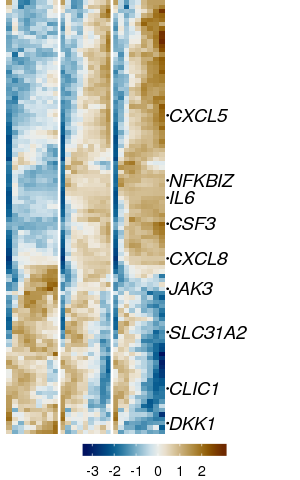

In [290]:
set.seed(42)

x3 <- scale_rows(hmap3_mat)

hmap3_order <- seriation::seriate(
  margin = 1,
  x = x3 + abs(min(x3)),
  method = "BEA_TSP"
)

hmap3_dat <- hmap3_mat[hmap3_order[[1]],] %>% scale_rows %>% melt(id.vars = NULL)
colnames(hmap3_dat) <- c("Var1", "Var2", "value")

# hmap3_dat$gene <- factor(gene_symbols[hmap3_dat$Var1])
# class(hmap3_dat$Var1)
# class(hmap3_dat$gene)
hmap3_dat$ensembl_id <- hmap3_dat$Var1
levels(hmap3_dat$Var1) <- gene_symbols[levels(hmap3_dat$Var1)]

these_genes <- c("CXCL5", "NFKBIZ", "IL6", "CSF3", "CXCL8", "JAK3", "SLC31A2", "CLIC1", "DKK1")
hmap3_dat_text <- subset(
  hmap3_dat,
  Var1 %in% these_genes &
  Var2 %in% c("t24d10")
)

p1 <- ggplot() +
geom_tile(
  data = hmap3_dat,
  mapping = aes(y = Var1, x = Var2, fill = value)
) +
geom_point(
  data = hmap3_dat_text,
  mapping = aes(y = Var1, x = 28),
  size = 0.1
) +
geom_text(
  data = hmap3_dat_text,
  mapping = aes(y = Var1, x = 28, label = Var1),
  hjust = 0,
  fontface = "italic"
) +
scale_fill_scico_auto(hmap3_dat$value, palette = "vik") +
geom_vline(xintercept = c(9.5, 18.5), color = "white", size = 0.75) +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  axis.text.x = element_blank(),
  axis.text.y = element_blank(),
#   axis.text.y = element_text(face = "italic", size = 6),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank(),
  legend.position = "bottom"
) +
guides(fill = guide_colorbar(title = NULL, barheight = 0.5, barwidth = 6)) +
# coord_flip() +
coord_cartesian(xlim = c(0, 50)) +
NULL

options(repr.plot.width = 2.5, repr.plot.height = 4)

show_plot(p1)

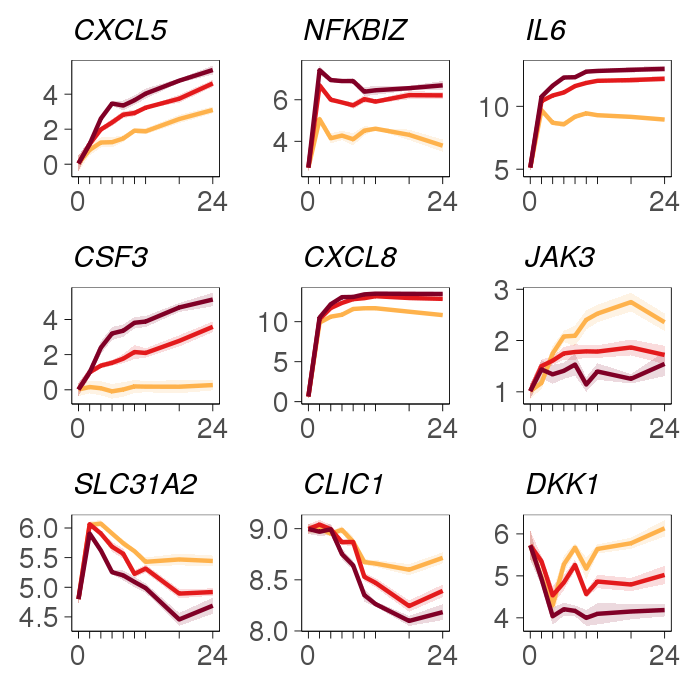

In [291]:
plot_these_genes(these_genes, ncol = 3)

In [292]:
hmap3_dat <- hmap3_dat %>%
mutate(
  time = str_extract(Var2, "\\d+"),
  dose = substr(str_extract(Var2, "d(\\d+)"), 2, 3)
)

In [293]:
table(hmap3_dat$time, hmap3_dat$dose)

    
       0   1  10
  0  100 100 100
  10 100 100 100
  12 100 100 100
  18 100 100 100
  2  100 100 100
  24 100 100 100
  4  100 100 100
  6  100 100 100
  8  100 100 100

In [294]:
class(hmap3_dat$time)

[1] "character"

In [295]:
hmap3_dat$time <- factor(as.numeric(hmap3_dat$time))

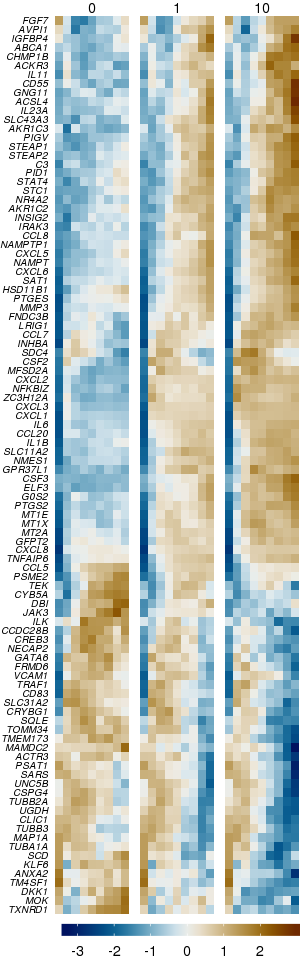

In [296]:
p1 <- ggplot() +
geom_tile(
  data = hmap3_dat,
  mapping = aes(y = Var1, x = time, fill = value)
) +
facet_wrap(~ dose) +
scale_fill_scico_auto(hmap3_dat$value, palette = "vik") +
# geom_vline(xintercept = c(9.5, 18.5), color = "white", size = 0.75) +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  axis.text.x = element_blank(),
#   axis.text.y = element_blank(),
  axis.text.y = element_text(face = "italic", size = 6),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank(),
  legend.position = "bottom"
) +
guides(fill = guide_colorbar(title = NULL, barheight = 0.5, barwidth = 10)) +
# coord_flip() +
# coord_cartesian(xlim = c(0, 50)) +
NULL

options(repr.plot.width = 2.5, repr.plot.height = 8)

show_plot(p1)

In [297]:
set.seed(42)

dim(hmap4_mat)
hmap4_mat[1:5,1:5]

x3 <- scale_rows(hmap4_mat)

hmap4_order <- seriation::seriate(
  margin = 1,
  x = x3 + abs(min(x3)),
  method = "BEA_TSP"
)

hmap4_dat <- hmap4_mat[hmap4_order[[1]],] %>% t %>% scale %>% t %>% melt(id.vars = NULL)
colnames(hmap4_dat) <- c("ensembl_id", "timedose", "value")

hmap4_dat <- hmap4_dat %>%
mutate(
  gene = gene_symbols[as.character(ensembl_id)],
  category = as.integer(as.character(ens_to_cat[as.character(ensembl_id)])),
  time = as.character(str_replace(str_extract(timedose, "t\\d+"), "t", "")),
  dose = as.integer(str_replace(str_extract(timedose, "d\\d+"), "d", ""))
)

hmap4_dat$time %<>% forcats::fct_relevel(c("0", "2", "4", "6", "8", "10", "12", "18", "24"))

head(hmap4_dat)

[1] 636  27

,t0d0,t2d0,t4d0,t6d0,t8d0
ENSG00000002549,5.676363256,5.5379707,6.075245,6.783165,7.3641707
ENSG00000003402,5.199183640,6.3496944,6.556770,6.639810,6.9472460
ENSG00000003989,0.361436198,1.2777128,2.442427,2.848048,3.5621200
ENSG00000004660,2.473585689,2.8515166,2.065385,1.098019,0.9791438
ENSG00000005102,-0.005548861,0.9823525,2.235975,2.472889,2.4581425


ensembl_id,timedose,value,gene,category,time,dose
ENSG00000181135,t0d0,1.243253,ZNF707,5,0,0
ENSG00000125968,t0d0,1.535090,ID1,5,0,0
ENSG00000147642,t0d0,1.752033,SYBU,5,0,0
ENSG00000183087,t0d0,2.227101,GAS6,5,0,0
ENSG00000133937,t0d0,1.438311,GSC,5,0,0
ENSG00000107738,t0d0,2.103635,VSIR,5,0,0


In [298]:
cat_count <- hmap4_dat %>% select(ensembl_id, category) %>%
unique() %>%
dplyr::count(category) %>%
mutate(label = sprintf("C%s\n(n = %s) ", category, n))

hmap4_dat$category_label <- unlist(with(cat_count, split(label, category)))[hmap4_dat$category]

cat_count

head(hmap4_dat)

category,n,label
1,26,C1 (n = 26)
2,25,C2 (n = 25)
3,370,C3 (n = 370)
4,13,C4 (n = 13)
5,202,C5 (n = 202)


ensembl_id,timedose,value,gene,category,time,dose,category_label
ENSG00000181135,t0d0,1.243253,ZNF707,5,0,0,C5 (n = 202)
ENSG00000125968,t0d0,1.535090,ID1,5,0,0,C5 (n = 202)
ENSG00000147642,t0d0,1.752033,SYBU,5,0,0,C5 (n = 202)
ENSG00000183087,t0d0,2.227101,GAS6,5,0,0,C5 (n = 202)
ENSG00000133937,t0d0,1.438311,GSC,5,0,0,C5 (n = 202)
ENSG00000107738,t0d0,2.103635,VSIR,5,0,0,C5 (n = 202)


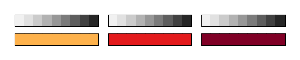

In [528]:
x <- hmap4_dat %>%
select(time, dose) %>%
unique() %>%
mutate(dose = factor(dose))

options(repr.plot.width = 2.5, repr.plot.height = 0.5)

p_time <- ggplot() +
geom_tile(
  data = x,
  mapping = aes(y = "Time", x = time, fill = time)
) +
facet_grid( ~ dose, scales = "free_y") +
# scale_fill_manual(values = scico::scico(n = 9, palette = "bilbao")) +
scale_fill_manual(values = time_colors) +
scale_x_discrete(expand = c(0, 0)) +
scale_y_discrete(expand = c(0, 0), position = "right") +
theme_void() +
# theme(axis.text = element_text(size = 16), axis.text.x = element_blank()) +
theme(
  plot.margin = margin(t = 0, r = 0, b = 4, l = 0, unit = "pt"),
  legend.position = "none",
  panel.border = element_rect(size = 0.2),
  strip.text = element_blank()
)

p_dose <- ggplot() +
geom_tile(
  data = x,
  mapping = aes(y = "IL-17", x = time, fill = dose)
) +
facet_grid( ~ dose, scales = "free_y") +
scale_fill_manual(values = c('0' = '#FEB24C', '1' = '#E31A1C', '10' = '#800026')) +
scale_x_discrete(expand = c(0, 0)) +
scale_y_discrete(expand = c(0, 0), position = "right") +
theme_void() +
# theme(axis.text = element_text(size = 16), axis.text.x = element_blank()) +
theme(
  plot.margin = margin(t = 0, r = 0, b = 4, l = 0, unit = "pt"),
  legend.position = "none",
  panel.border = element_rect(size = 0.2),
  strip.text = element_blank()
)

p_time / p_dose

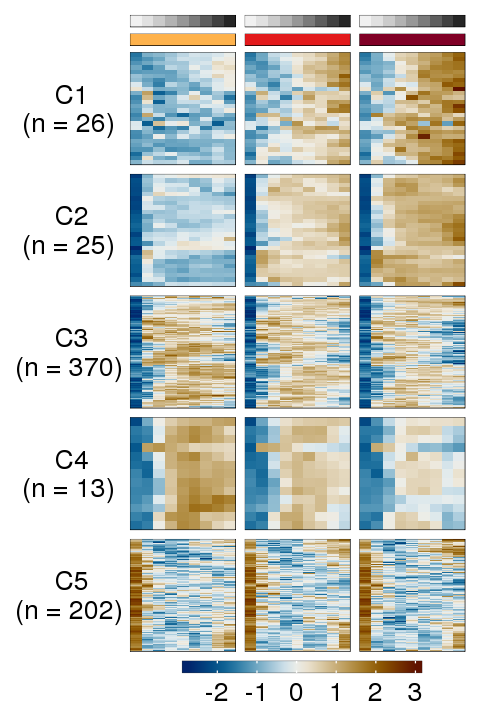

In [531]:
p1 <- ggplot() +
geom_tile(
  data = hmap4_dat,
  mapping = aes(y = ensembl_id, x = time, fill = value)
) +
facet_grid(category_label ~ dose, scales = "free_y", switch = "y") +
scale_fill_scico_auto(hmap4_dat$value, palette = "vik") +
scale_x_discrete(expand = c(0, 0)) +
scale_y_discrete(expand = c(0, 0)) +
labs(x = NULL, y = NULL) +
theme_void() +
theme(
  legend.text = element_text(size = 16),
#   axis.text.x = element_text(size = 3),
  axis.text.x = element_blank(),
  axis.text.y = element_blank(),
#   axis.text.y = element_text(face = "italic", size = 6),
  axis.ticks.x = element_blank(),
  axis.ticks.y = element_blank(),
  legend.position = "bottom",
  panel.border = element_rect(size = 0.2),
  strip.text.x = element_blank(),
  strip.text.y = element_text(size = 16, angle = 180)
) +
guides(fill = guide_colorbar(
  frame.linewidth = 0.2,
  frame.colour = "black",
  ticks.linewidth = 1,
  title = NULL,
  barheight = 0.5,
  barwidth = 10
)) +
# coord_flip() +
# coord_cartesian(xlim = c(0, 50)) +
NULL

options(repr.plot.width = 4, repr.plot.height = 6)

show_plot(name = "figure1-heatmap",
  (p_time / p_dose / p1) + plot_layout(ncol = 1, heights = c(1, 1, 50))
)

## Figure 1 Heatmap v2

In [220]:
dat_c1 <- subset(dat, category == 1) %>%
mutate(weight = d10 - abs(t6)) %>%
top_n(n = 20, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c2 <- subset(dat, category == 2) %>%
mutate(weight = d10 + t6) %>%
top_n(n = 20, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c3 <- subset(dat, category == 3) %>%
mutate(weight = t6 - abs(d10)) %>%
top_n(n = 20, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c4 <- subset(dat, category == 4) %>%
mutate(weight = t6 - d10) %>%
top_n(n = 20, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

dat_c5 <- subset(dat, category == 5) %>%
mutate(weight = -t6 - abs(d10) ^ 2) %>%
top_n(n = 3, wt = weight) %>%
dplyr::select(category, ensembl_id, ID, d10, t6, weight) %>%
arrange(category, -weight)

# dat_c5

dat_cat_hmap <- dplyr::bind_rows(dat_c1, dat_c2, dat_c3, dat_c4, dat_c5)
head(dat_cat_hmap)

category,ensembl_id,ID,d10,t6,weight
1,ENSG00000108342,CSF3,3.329725,-0.19394691,3.135778
1,ENSG00000163435,ELF3,2.431524,-0.08379862,2.347726
1,ENSG00000110944,IL23A,1.993358,0.17185654,1.821502
1,ENSG00000159167,STC1,1.809191,0.04808206,1.761109
1,ENSG00000250339,CXCL1P1,1.830372,0.17827063,1.652101
1,ENSG00000095752,IL11,1.608618,0.02222195,1.586396


In [221]:
cat_ens <- with(subset(dat, category != 0), split(ensembl_id, category))
data.frame(
  category = names(cat_ens),
  genes = sapply(cat_ens, length)
)

ens_cat <- unlist(with(subset(dat, category != 0), split(category, ensembl_id)))

# cat_ens <- with(subset(dat_cat_hmap, category != 0), split(ensembl_id, category))
# data.frame(
#   category = names(cat_ens),
#   genes = sapply(cat_ens, length)
# )

,category,genes
0,0,0
1,1,26
2,2,27
3,3,463
4,4,15
5,5,297


In [222]:
hmap3_dat$category <- as.character(ens_cat[hmap3_dat$ensembl_id])
head(hmap3_dat)

with(subset(hmap3_dat, Var2 == "t0d0"), table(category))

Var1,Var2,value,ensembl_id,category,time,dose
TXNRD1,t0d0,0.5212696,ENSG00000198431,3,0,0
MOK,t0d0,1.0689944,ENSG00000080823,3,0,0
DKK1,t0d0,1.2290087,ENSG00000107984,2,0,0
TM4SF1,t0d0,2.0049149,ENSG00000169908,5,0,0
ANXA2,t0d0,1.8367398,ENSG00000182718,3,0,0
KLF6,t0d0,1.4309027,ENSG00000067082,5,0,0


category
 1  2  3  4  5 
 3  3 60  1 33 

[1] 20
[1] 20
[1] 20
[1] 15
[1] 3


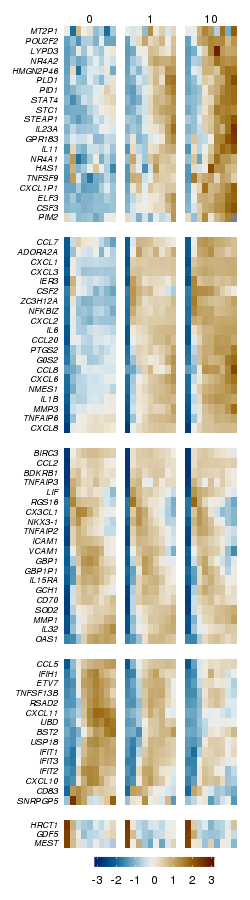

In [227]:
set.seed(42)

all_values <- as.numeric(do.call(rbind, lapply(c('1', '2', '3', '4', '5'), function(this_cat) {  
  ix <- intersect(cat_ens[[this_cat]], rownames(fit_hmap$coefficients))
  ix <- intersect(ix, dat_cat_hmap$ensembl_id)
  x3 <- scale_rows(fit_hmap$coefficients[ix,])
})))

plot_this_heatmap <- function(this_cat) {
  
  ix <- intersect(cat_ens[[this_cat]], rownames(fit_hmap$coefficients))
  
  ix <- intersect(ix, dat_cat_hmap$ensembl_id)

#   ix <- intersect(
#     ix,
#     rownames(dtime)[
#       which(rownames(dtime) %in% cat_ens[[this_cat]] & dtime$qval < 0.01)
#     ]
#   )
  
  print(length(ix))
  stopifnot(length(ix) > 2)
  
  x3 <- scale_rows(fit_hmap$coefficients[ix,])
#   x3 <- fit_hmap$coefficients[ix,]

  this_order <- seriation::seriate(
    margin = 1,
    x = x3 + abs(min(x3)),
    method = "BEA_TSP"
#     method = "PCA"
  )

  this_dat <- x3[this_order[[1]],] %>% melt(id.vars = NULL)
  colnames(this_dat) <- c("Var1", "Var2", "value")

  this_dat$gene <- factor(gene_symbols[this_dat$Var1])
  class(this_dat$Var1)
  class(this_dat$gene)
  levels(this_dat$Var1) <- gene_symbols[levels(this_dat$Var1)]

#   these_genes <- c("CXCL5", "NFKBIZ", "IL6", "CSF3", "CXCL8", "JAK3", "SLC31A2", "CLIC1", "DKK1")
#   this_dat_text <- subset(
#     this_dat,
#     Var1 %in% these_genes &
#     Var2 %in% c("t24d10")
#   )
  
  this_dat %<>% mutate(
    time = factor(as.numeric(str_extract(Var2, "\\d+"))),
    dose = substr(str_extract(Var2, "d(\\d+)"), 2, 3)
  )
  
  p1 <- ggplot() +
  geom_tile(
    data = this_dat,
    mapping = aes(y = Var1, x = time, fill = value)
  ) +
#   geom_point(
#     data = this_dat_text,
#     mapping = aes(y = Var1, x = 28),
#     size = 0.1
#   ) +
#   geom_text(
#     data = this_dat_text,
#     mapping = aes(y = Var1, x = 28, label = Var1),
#     hjust = 0,
#     fontface = "italic"
#   ) +
#   scale_fill_scico_auto(this_dat$value, palette = "vik") +
  scale_fill_scico_auto(all_values, palette = "vik", limits = c(-3, 3)) +
  facet_grid(~ dose) +
#   geom_vline(xintercept = c(9.45, 18.45), color = "white", size = 0.2) +
  labs(x = NULL, y = NULL) +
  theme_void() +
  theme(
    axis.text.x = element_blank(),
    # axis.text.y = element_blank(),
    axis.text.y = element_text(face = "italic", size = 6),
    axis.ticks.x = element_blank(),
    axis.ticks.y = element_blank(),
    legend.position = "bottom"
  ) +
  guides(fill = guide_colorbar(title = NULL, barheight = 0.5, barwidth = 6)) +
  # coord_flip() +
#   coord_cartesian(xlim = c(0, 50)) +
  NULL
  
  return(p1)
}

plots <- lapply(c('1', '2', '3', '4', '5'), plot_this_heatmap)

plots[[1]] <- plots[[1]] + guides(fill = FALSE)
plots[[2]] <- plots[[2]] + guides(fill = FALSE) + theme(axis.text.y = element_text(face = "italic", size = 6), strip.text = element_text(color = "white"))
plots[[3]] <- plots[[3]] + guides(fill = FALSE) + theme(axis.text.y = element_text(face = "italic", size = 6), strip.text = element_text(color = "white"))
plots[[4]] <- plots[[4]] + guides(fill = FALSE) + theme(axis.text.y = element_text(face = "italic", size = 6), strip.text = element_text(color = "white"))
plots[[5]] <- plots[[5]] + theme(axis.text.y = element_text(face = "italic", size = 6), strip.text = element_text(color = "white"))

options(repr.plot.width = 2.5, repr.plot.height = 9)

show_plot(
  patchwork::wrap_plots(plots,
    ncol = 1,
    nrow = 5,
    heights = c(20, 20, 20, 15, 3)
  ),
  res = 100
)

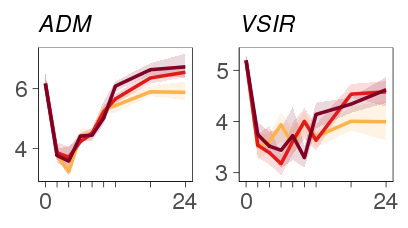

In [201]:
plot_these_genes(c("ADM", "VSIR"), ncol = 3)

## Decide how many coefficients are nonzero

In [154]:
fit1_signif <- decideTests(fit1, lfc = log2(1.25), p.value = 0.005)

do.call(rbind, apply(fit1_signif, 2, function(x) {
  data.frame(
    "Up"        = sum(x == 1),
    "Down"      = sum(x == -1),
    "Unchanged" = sum(x == 0)
  )
}))

,Up,Down,Unchanged
(Intercept),16120,0,3759
"bs(Time, df = df)1",709,966,18204
"bs(Time, df = df)2",558,312,19009
"bs(Time, df = df)3",235,224,19420
"bs(Time, df = df)4",785,888,18206
"bs(Time, df = df)1:DoseFactor1",5,0,19874
"bs(Time, df = df)2:DoseFactor1",6,0,19873
"bs(Time, df = df)3:DoseFactor1",1,1,19877
"bs(Time, df = df)4:DoseFactor1",90,82,19707
"bs(Time, df = df)1:DoseFactor10",13,0,19866


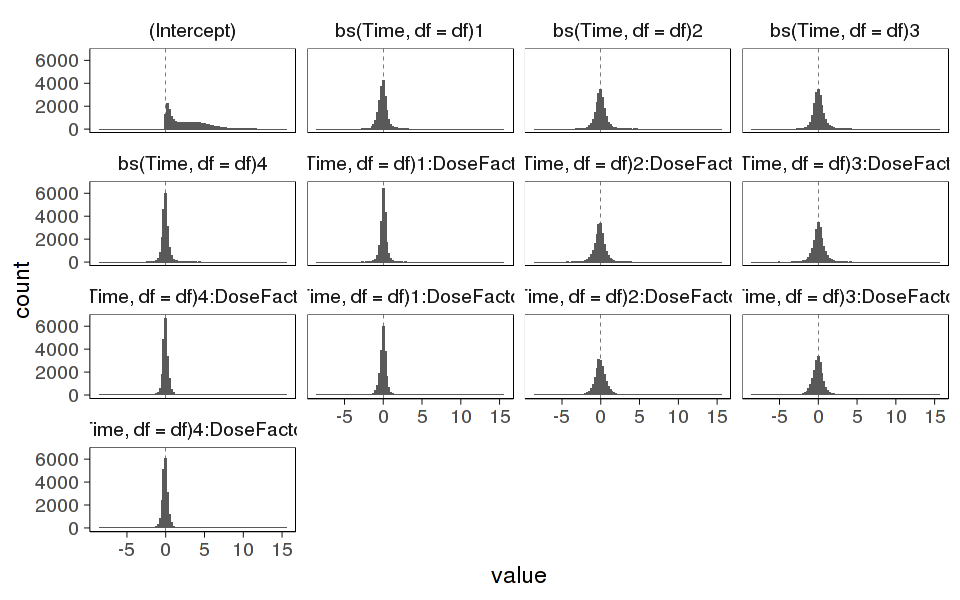

In [155]:
options(repr.plot.width = 8, repr.plot.height = 5)

coef <- as.data.frame(fit1$coefficients)

melt(coef, id.vars = NULL) %>%
ggplot(aes(x = value)) +
geom_vline(xintercept = 0, size = 0.1, linetype = 2) +
geom_histogram(bins = 100) +
facet_wrap(~ variable) +
theme_clean(base_size = 14)